# Tree-Based Macroeconomic Regime Classification

Based on:
> Diebold Bie, Li He. *Machine Learning and the Yield Curve: Tree-Based Macroeconomic Regime Switching*. (2024).

- Loads and merges macroeconomic data from FRED, yfinance, and supplementary Excel/CSV files into a unified, monthly dataset, covering ~60 variables across industrial output, labour, housing, liquidity & credit, inflation, bond markets, foreign exchange, commodities, equity markets, sentiment, and uncertainty
- Computes year-over-year percent changes for level series and retains rates, spreads, and indices as-is
- Applies a rolling 5-year quantile standardization to each variable
- Grows a sequential greedy tree using Bayesian marginal likelihood under a Normal-Inverse-Gamma conjugate model as the splitting criterion, partitioning the full sample into 3 macroeconomic regimes, targeting Svensson-reconstructed zero-coupon yields at 13 maturities as the likelihood target

`MacroRegimes1.ipynb`'s forecaster suffered from a lot of look-ahead bias because of careless decisions I made along the way. In this version, I try to fix those mistakes and take the algorithm further.

## 0. Standard Imports

In [1]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import pandas_datareader as pdr
import os

try:
    from fredapi import Fred
except ImportError:
    !pip install fredapi -q
    from fredapi import Fred

## 1. Load & Merge Category Factors

Based on Zhao et al. (2025).

**Macroeconomic Factor:**

Outputs:
- Industry Production Index (INDPRO)
- Capacity Utilization: Manufacturing (CUMFNS)

Consumer:
- Real Personal Income (RPI)

Labour:
- Job Openings (JTSJOL)
- Jobless Claims (ICSA, CCSA/ICSA Ratio) rather than UNRATE due to lag

Housing:
- Permits Issued (PERMIT)
- Completed Units Ratio (COMPUTSA/PERMIT)

Liquidity & Credit:
- Commercial and Industrial Loans (BUSLOANS)
- M2 Money Stock (M2SL)
- Effective Federal Funds (FEDFUNDS)

Inflation:
- Consumer Price Index (CPIAUCSL)
- Producer Price Index: All Commodities (PPIACO)
- Forward Inflation Expectations (MICH)

**Bond Market Factor:**
- 3-Month Treasury Bill (TB3MS)
- 6-Month Treasury Bill (TB6MS)
- 1-Year Treasury Rate (GS1)
- 2-Year Treasury Rate (GS2)
- 5-Year Treasury Rate (GS5)
- 10-Year Tresury Rate (GS10)
- Credit Spread (BAMLH0A0HYM2, I have a CSV of pre-2023)
- Term Spread (T10Y2YM)

**Foreign Exchange Market Factor:**
- Trade Weighted U.S. Dollar Index (TWEXBGSMTH post-2006 extended using TWEXBMTH to pre-2006)
- U.S./Switzerland Exchange Rate (1/EXSZUS)
- U.S./Japan Exchange Rate (1/EXJPUS)
- U.S./U.K. Exchange Rate (EXUSUK)
- U.S./European Exchange Rate (3.301/EXBEUS + 0.6242/EXGEUS + 0.1976/EXDNUS + 1.332/EXFRUS + 0.08784$\times$EXUSUK + 0.008552$\times$EXUSIR + 151.8/EXITUS + 0.2198/EXNEUS + 0.13/CCUSMA02LUM618N + 6.885/EXSPUS + 1.44/EXGRUS + 1.393/EXPOUS pre-1999, EXUSEU post-1999)
- U.S./Canadian Foreign Exchange Rate (1/EXCAUS)

**Commodity Market Factor:**
- Corn (WPU012202)
- Wheat (WPU0121)
- Gold (Inspect https://www.lbma.org.uk/prices-and-data/precious-metal-prices#/)
- Crude Oil (WTISPLC)
- Copper (WPUSI019011)
- Natural Gas (PNGASUSUSDM)

**Stock Market Factor:**
- S&P 500 (^GSPC)
- NASDAQ (^IXIC)
- DJIA (^DJI)
- Nikkei 225 (^N225)
- CAC 40 (^FCHI)
- AEX (^AEX)
- BEL 20 (^BFX)
- S&P/TSX (^GSPTSE)
- HSI (^HSI)
- FTSE 100 (^FTSE)
- DAX (^GDAXI)

Unfortunately, not enough historical data for the S&P Global 1200 (^SPG1200) and the Euronext 100 (^N100)

**Sentiment Factor:**
- Consumer Confidence (USACSCICP02STSAM)
- University of Michigan: Consumer Sentiment (UMCSENT)
- AAII US Investor Sentiment Bullish & Bearish Index (https://www.aaii.com/files/surveys/sentiment.xls)
- Kansas City Fed’s Financial Stress Index (KCFSI)

**Uncertainty Factor:**
- Geopolitical Risk/Threat/Acts Indices (https://www.matteoiacoviello.com/gpr_files/data_gpr_export.xls; https://github.com/iacoviel/iacoviel.github.io/tree/master/gpr_archive_files)
- Economic Policy Uncertainty Index (USEPUINDXD)
- Monetary Policy Uncertainty Index (EPUMONETARY)
- Trade Policy Uncertainty Index (EPUTRADE)
- CBOE Volatility Index (VIXCLS)

In [2]:
# User Inputs
from google.colab import drive

# Mount your Google Drive into the Colab Virtual Machine
drive.mount('/content/drive')

# Define the path where you want to keep your project files
# This creates a folder named "MacroRegimes2" in your main Google Drive
project_folder = '/content/drive/MyDrive/MacroRegimes2'
if not os.path.exists(project_folder):
    os.makedirs(project_folder)
    print(f"Created a new project folder at: {project_folder}")
else:
    print(f"Project folder ready: {project_folder}")

# FRED Series
fred = Fred(api_key='BRUH')
fred_series = [
    'INDPRO', 'CUMFNS', 'RPI', 'JTSJOL', 'ICSA', 'CCSA', 'PAYEMS', 'UNRATE', 'PERMIT', 'COMPUTSA', 'BUSLOANS', 'M2SL', 'FEDFUNDS', 'CPIAUCSL', 'PPIACO', 'MICH',
    'TB3MS', 'TB6MS', 'GS1', 'GS2', 'GS5', 'GS10', 'BAMLH0A0HYM2', 'T10Y2YM',
    'TWEXBMTH', 'TWEXBGSMTH', 'EXSZUS', 'EXJPUS', 'EXUSUK', 'EXUSEU', 'EXBEUS', 'EXGEUS', 'EXDNUS', 'EXFRUS', 'EXUSIR', 'EXITUS', 'EXNEUS', 'CCUSMA02LUM618N', 'EXSPUS', 'EXGRUS', 'EXPOUS', 'EXCAUS',
    'WPU012202', 'WPU0121', 'WTISPLC', 'WPUSI019011', 'PNGASUSUSDM',
    'USACSCICP02STSAM', 'UMCSENT', 'KCFSI', 'USEPUINDXD', 'EPUMONETARY', 'EPUTRADE', 'VIXCLS'
    ]

# yfinance Series
yf_series = ['^GSPC', '^IXIC', '^DJI', '^N225', '^FCHI', '^AEX', '^BFX', '^GSPTSE', '^HSI', '^FTSE', '^GDAXI']

# Data start and end dates
start_date = '1990-01-01'
end_date = '2100-01-01'

# Rolling quantile standardization parameters
rolling_window = 60 # 10-year = 120 months rolling window (pg. 17), we use 5 years to preserve more data

# Tree classification parameters
thresholds = [0.2, 0.4, 0.6, 0.8] # candidate split thresholds (pg. 17)
min_regime_months = 24 # (pg. 11)
max_regimes = 3 # (pg. 11)

Mounted at /content/drive
Project folder ready: /content/drive/MyDrive/MacroRegimes2


### 1.0. FRED Series Debugging

In [3]:
# Gets data from FRED API
print('Fetching FRED data...')

fred_raw = []
for ticker in fred_series:
    try:
        series = fred.get_series(ticker, start=start_date, end=end_date)
        series.name = ticker
        fred_raw.append(series)
        print(f"Successfully fetched {ticker}")
    except Exception as e:
        print(f"Error fetching data for {ticker}: {e}")

fred_raw = pd.concat(fred_raw, axis=1)
fred_raw.index = pd.to_datetime(fred_raw.index)
fred_raw = fred_raw.sort_index()
fred_raw = fred_raw.resample('MS').mean()

Fetching FRED data...
Successfully fetched INDPRO
Successfully fetched CUMFNS
Successfully fetched RPI
Successfully fetched JTSJOL
Successfully fetched ICSA
Successfully fetched CCSA
Successfully fetched PAYEMS
Successfully fetched UNRATE
Successfully fetched PERMIT
Successfully fetched COMPUTSA
Successfully fetched BUSLOANS
Successfully fetched M2SL
Successfully fetched FEDFUNDS
Successfully fetched CPIAUCSL
Successfully fetched PPIACO
Successfully fetched MICH
Successfully fetched TB3MS
Successfully fetched TB6MS
Successfully fetched GS1
Successfully fetched GS2
Successfully fetched GS5
Successfully fetched GS10
Successfully fetched BAMLH0A0HYM2
Successfully fetched T10Y2YM
Successfully fetched TWEXBMTH
Successfully fetched TWEXBGSMTH
Successfully fetched EXSZUS
Successfully fetched EXJPUS
Successfully fetched EXUSUK
Successfully fetched EXUSEU
Successfully fetched EXBEUS
Successfully fetched EXGEUS
Successfully fetched EXDNUS
Successfully fetched EXFRUS
Successfully fetched EXUSIR
S

In [4]:
# 1. Ratios and Inverses
print('Computing CCSA/ICSA Ratio...')
fred_raw['CCSA/ICSA'] = fred_raw['CCSA'] / fred_raw['ICSA']

print('Computing COMPUTSA/PERMIT Ratio...')
fred_raw['COMPUTSA/PERMIT'] = fred_raw['COMPUTSA'] / fred_raw['PERMIT']

print('Computing 1/EXSZUS...')
fred_raw['1/EXSZUS'] = 1 / fred_raw['EXSZUS']

print('Computing 1/EXJPUS...')
fred_raw['1/EXJPUS'] = 1 / fred_raw['EXJPUS']

print('Computing 1/EXCAUS...')
fred_raw['1/EXCAUS'] = 1 / fred_raw['EXCAUS']

Computing CCSA/ICSA Ratio...
Computing COMPUTSA/PERMIT Ratio...
Computing 1/EXSZUS...
Computing 1/EXJPUS...
Computing 1/EXCAUS...


Fetching BAMLH0A0HYM2.csv data...


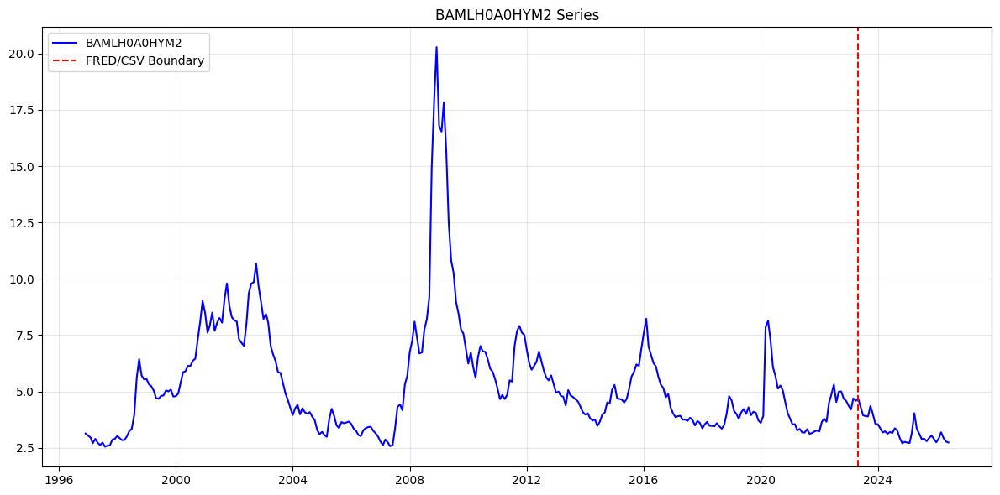

In [5]:
# 2. Include BAMLH0A0HYM2 data from Internet Archive
try:
  print('Fetching BAMLH0A0HYM2.csv data...')
  df_BAMLH0A0HYM2 = pd.read_csv(f"{project_folder}/BAMLH0A0HYM2.csv", index_col='observation_date', parse_dates=True)
  df_BAMLH0A0HYM2 = df_BAMLH0A0HYM2.ffill()
  df_BAMLH0A0HYM2 = df_BAMLH0A0HYM2.resample('MS').mean()
  df_BAMLH0A0HYM2 = df_BAMLH0A0HYM2.combine_first(fred_raw[['BAMLH0A0HYM2']])
  fred_raw['BAMLH0A0HYM2'] = df_BAMLH0A0HYM2['BAMLH0A0HYM2']

  # Check BAMLH0A0HYM2 data
  plt.figure(figsize=(12, 6))
  plt.plot(fred_raw.index, fred_raw['BAMLH0A0HYM2'], label='BAMLH0A0HYM2', color='blue')
  plt.title('BAMLH0A0HYM2 Series')
  plt.axvline(pd.Timestamp('2023-04-25'), color='red', linestyle='--', label='FRED/CSV Boundary')
  plt.legend()
  plt.grid(True, alpha=0.3)
  plt.tight_layout()
  plt.show()

except FileNotFoundError:
  print('BAMLH0A0HYM2 data not found. Skipping.')

Merging TWEXBMTH and TWEXBGSMTH...


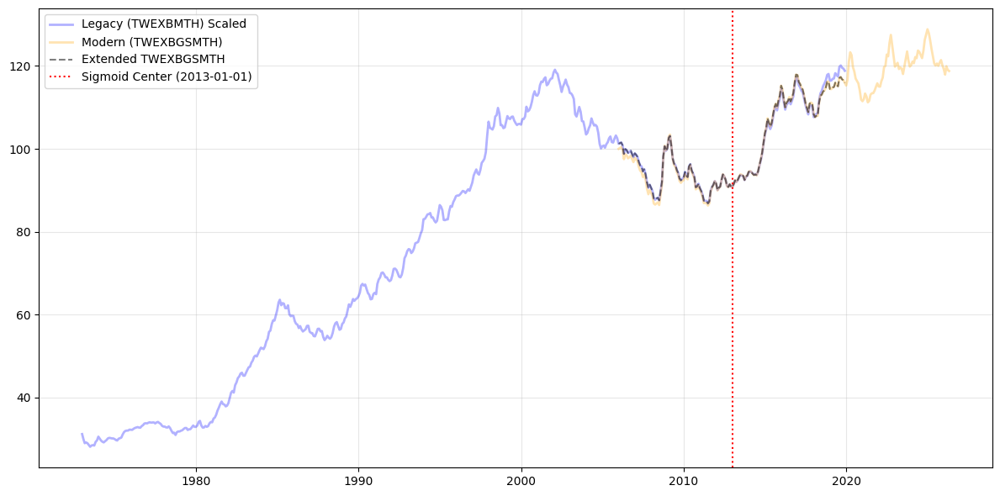

In [6]:
# 3. The modern TWEXBGSMTH series using TWEXBMTH
def sigmoid_bridge(df, legacy_col='TWEXBMTH', modern_col='TWEXBGSMTH', k=0.5):
    df = df.copy()

    # Identify the overlap period by finding where both columns have non-null values
    overlap = df[df[legacy_col].notna() & df[modern_col].notna()].index

    if len(overlap) == 0:
        raise ValueError("No overlapping data found between the two series.")

    # Calculate the transition center (midpoint of overlap)
    mid_idx = len(overlap) // 2
    transition_date = overlap[mid_idx]

    # Create a numeric timeline (months from transition date)
    # This converts our datetime index into a relative integer scale
    df = df.copy()
    df['months_from_center'] = (df.index.year - pd.Timestamp(transition_date).year) * 12 + (df.index.month - pd.Timestamp(transition_date).month)

    # Calculate Sigmoid Weights
    # Formula: 1 / (1 + exp(-k * (x - x0)))
    df['weight_modern'] = 1 / (1 + np.exp(-k * df['months_from_center']))
    df['weight_legacy'] = 1 - df['weight_modern']

    # Handle Scaling
    # These indices often have different base years. We scale the legacy series to match the modern series at the transition center.
    scale_factor = df.loc[transition_date, modern_col] / df.loc[transition_date, legacy_col]
    df['legacy_scaled'] = df[legacy_col] * scale_factor

    # Compute the Blend
    df['bridged_index'] = (df['legacy_scaled'] * df['weight_legacy']) + (df[modern_col] * df['weight_modern'])
    # Create the combined series
    combined = (df['legacy_scaled'].fillna(0) * df['weight_legacy']) + (df[modern_col].fillna(0) * df['weight_modern'])
    has_data = df[legacy_col].notna() | df[modern_col].notna()
    combined = combined[has_data]

    return combined, df['legacy_scaled'], transition_date

try:
  print('Merging TWEXBMTH and TWEXBGSMTH...')
  combined_series, legacy_scaled, t_center = sigmoid_bridge(fred_raw)
  fred_raw['Extended_TWEXBGSMTH'] = combined_series
  fred_raw['Inverted_TWEXBGSMTH'] = 1 / fred_raw['Extended_TWEXBGSMTH'] # To be consistent with the strength of foreign currencies relative to the USD

  # Check extended TWEXBGSMTH data
  plt.figure(figsize=(12, 6))
  overlap_period = fred_raw[fred_raw['TWEXBMTH'].notna() & fred_raw['TWEXBGSMTH'].notna()].index
  plt.plot(fred_raw.index, legacy_scaled, label='Legacy (TWEXBMTH) Scaled', color='blue', alpha=0.3, linewidth=2)
  plt.plot(fred_raw.index, fred_raw['TWEXBGSMTH'], label='Modern (TWEXBGSMTH)', color='orange', alpha=0.3, linewidth=2)
  plt.plot(overlap_period, fred_raw.loc[overlap_period, 'Extended_TWEXBGSMTH'], label='Extended TWEXBGSMTH', color='black', alpha=0.5, linestyle='--')
  plt.axvline(t_center, color='red', linestyle=':', label=f'Sigmoid Center ({t_center.date()})') # Mark the transition center point
  plt.legend()
  plt.grid(True, alpha=0.3)
  plt.tight_layout()
  plt.show()

except Exception as e:
  print(e)
  print('Error merging TWEXBMTH and TWEXBGSMTH. Skipping.')

Combining ECU/Euro series...
Final ECU Series Value: 1.30698745
Official Euro Value: 1.15910000
Absolute Difference: 0.14788745


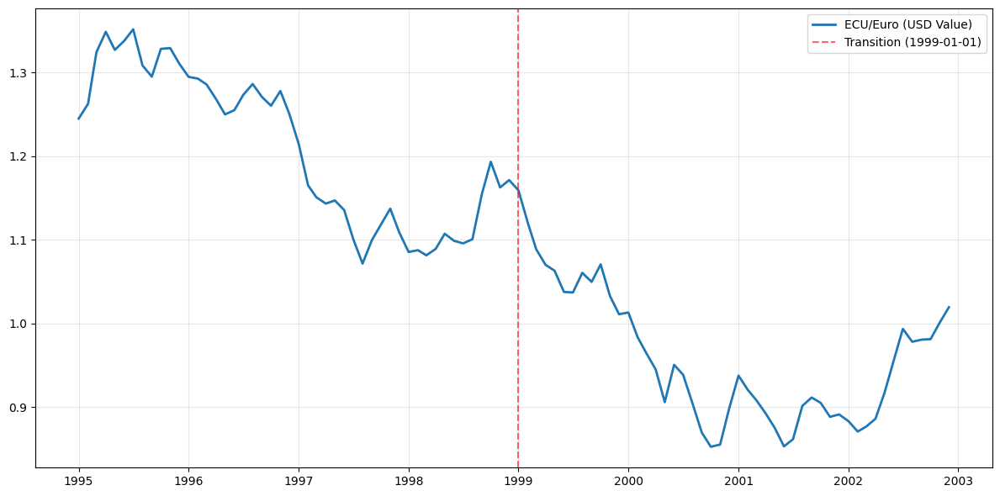

In [7]:
# 4. Merge pre- and post-1999 U.S./European Currency Exchange Rate
def ecu_euro_series(fred_raw_data):
    # Define the fixed basket amounts
    basket = {
        'EXBEUS': 3.301,    # Belgian Franc
        'EXGEUS': 0.6242,   # German Mark
        'EXDNUS': 0.1976,   # Danish Krone
        'EXFRUS': 1.332,    # French Franc
        'EXUSUK': 0.08784,  # British Pound
        'EXUSIR': 0.008552, # Irish Pound
        'EXITUS': 151.8,    # Italian Lira
        'EXNEUS': 0.2198,   # Dutch Guilder
        'CCUSMA02LUM618N': 0.13, # Luxembourg Franc
        'EXSPUS': 6.885,    # Spanish Peseta
        'EXGRUS': 1.44,     # Greek Drachma
        'EXPOUS': 1.393     # Portuguese Escudo
    }

    # Calculate the ECU value in USD
    terms = []
    for code, amount in basket.items():
        if code in fred_raw_data.columns:
            if code in ['EXUSUK', 'EXUSIR']:
                term = amount * fred_raw_data[code]
            else:
                term = amount / fred_raw_data[code]
            terms.append(term.ffill().fillna(0))

    ecu_reconstruction = pd.concat(terms, axis=1).sum(axis=1)

    # Nullify any ECU values prior to the 1989 "Fixed Weights" date
    fixed_weights_start = pd.Timestamp('1989-09-21')
    ecu_reconstruction.loc[ecu_reconstruction.index < fixed_weights_start] = np.nan

    # Create the combined series
    transition_date = pd.Timestamp('1999-01-01')
    combined = pd.Series(index=fred_raw_data.index, dtype='float64')

    # Pre-1999: Reconstructed ECU; Post-1999: Euro
    combined.loc[fred_raw_data.index <= transition_date] = ecu_reconstruction
    combined.loc[fred_raw_data.index > transition_date] = fred_raw_data['EXUSEU']

    # Check market price parity on January 1, 1999
    if transition_date in fred_raw_data.index:
        ecu_val = ecu_reconstruction.loc[transition_date]
        euro_val = fred_raw_data.loc[transition_date, 'EXUSEU']

        print(f"Final ECU Series Value: {ecu_val:.8f}")
        print(f"Official Euro Value: {euro_val:.8f}")
        print(f"Absolute Difference: {ecu_val - euro_val:.8f}")

        combined.loc[fred_raw_data.index <= transition_date] = combined.loc[fred_raw_data.index <= transition_date] * euro_val/ecu_val

    return combined

try:
    print('Combining ECU/Euro series...')
    fred_raw['ECU_EUR_USD'] = ecu_euro_series(fred_raw)

    # Check ECU/Euro data
    plt.figure(figsize=(12, 6))
    plt.plot(fred_raw.loc['1995':'2002'].index, fred_raw.loc['1995':'2002', 'ECU_EUR_USD'], color='#1f77b4', linewidth=2, label='ECU/Euro (USD Value)')
    plt.axvline(pd.Timestamp('1999-01-01'), color='red', linestyle='--', alpha=0.6, label='Transition (1999-01-01)') # Mark the transition point
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(e)
    print('Error combining ECU/Euro series. Skipping.')

In [8]:
# Save data in case FRED ever decides to remove even more series
fred_raw.to_csv(f"{project_folder}/fred_raw.csv", index=True)

# Drop the original columns to clean up the feature space
fred_raw = fred_raw.drop(columns=[
        'CCSA', 'COMPUTSA',
        'TWEXBGSMTH', 'TWEXBMTH',
        'EXUSEU', 'EXBEUS', 'EXGEUS', 'EXDNUS', 'EXFRUS', 'EXUSIR', 'EXITUS', 'EXNEUS', 'CCUSMA02LUM618N', 'EXSPUS', 'EXGRUS', 'EXPOUS',
        'EXSZUS', 'EXJPUS', 'EXCAUS'
        ])

# Check data
print(f'\nAmount of data:')
for col in fred_raw.columns:
    print(f'{col:20s} | {f'{fred_raw[col].notna().sum()} months':20s} | '
          f'{fred_raw[col].first_valid_index().date()} → {fred_raw[col].last_valid_index().date()}')

print(f'\nMissing values per column:')
print(fred_raw.isnull().sum())

print(f'\nMerged shape: {fred_raw.shape}')


Amount of data:
INDPRO               | 1288 months          | 1919-01-01 → 2026-04-01
CUMFNS               | 940 months           | 1948-01-01 → 2026-04-01
RPI                  | 808 months           | 1959-01-01 → 2026-04-01
JTSJOL               | 305 months           | 2000-12-01 → 2026-04-01
ICSA                 | 713 months           | 1967-01-01 → 2026-05-01
PAYEMS               | 1049 months          | 1939-01-01 → 2026-05-01
UNRATE               | 940 months           | 1948-01-01 → 2026-05-01
PERMIT               | 796 months           | 1960-01-01 → 2026-04-01
BUSLOANS             | 952 months           | 1947-01-01 → 2026-04-01
M2SL                 | 808 months           | 1959-01-01 → 2026-04-01
FEDFUNDS             | 863 months           | 1954-07-01 → 2026-05-01
CPIAUCSL             | 951 months           | 1947-01-01 → 2026-04-01
PPIACO               | 1360 months          | 1913-01-01 → 2026-04-01
MICH                 | 580 months           | 1978-01-01 → 2026-04-01
TB3

### 1.1. yfinance Series Debugging

In [9]:
# Fetch data from yfinance
print('Fetching yfinance data...')
yf_raw = yf.download(tickers=yf_series, start=start_date, end=end_date, auto_adjust=True)
yf_raw = yf_raw.resample('MS').last() # Differs from fred_raw

Fetching yfinance data...


[*********************100%***********************]  11 of 11 completed


In [10]:
prices_df = yf_raw['Close']
start_dates = prices_df.notna().idxmax()
ticker_starts = start_dates.to_frame(name='Start Date').sort_values(by='Start Date')
print(ticker_starts)

        Start Date
Ticker            
^FTSE   1990-01-01
^GDAXI  1990-01-01
^GSPC   1990-01-01
^GSPTSE 1990-01-01
^HSI    1990-01-01
^IXIC   1990-01-01
^N225   1990-01-01
^FCHI   1990-03-01
^BFX    1991-04-01
^DJI    1992-01-01
^AEX    1992-10-01


In [11]:
yf_prices = yf_raw.xs('Close', axis=1, level='Price')
raw = pd.concat([fred_raw, yf_prices], axis=1)

### 1.2. Miscellaneous Excel File Debuggings

Fetching LBMA Gold data...


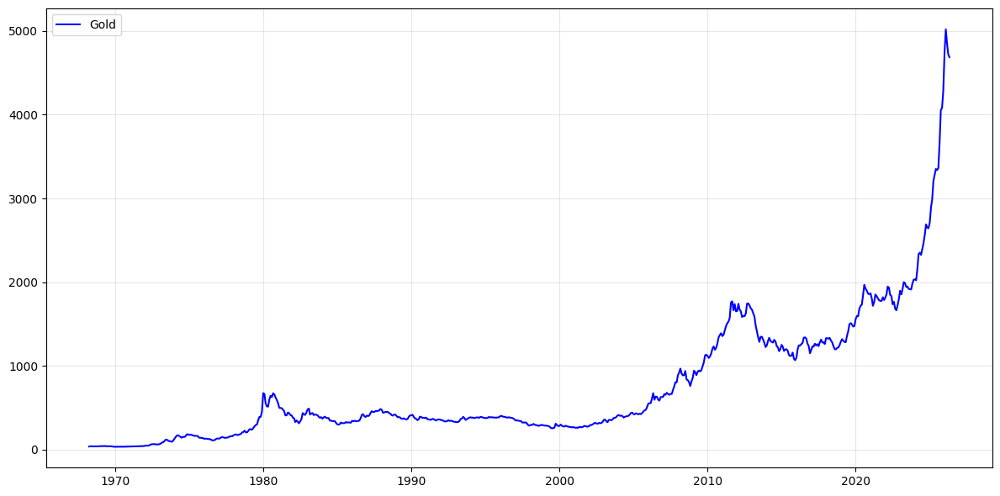

In [12]:
# 1. LBMA Gold
try:
  print('Fetching LBMA Gold data...')
  df_GOLD = pd.read_csv(f"{project_folder}/gold.csv", index_col='d', parse_dates=True)
  df_GOLD = df_GOLD.ffill()

  df_GOLD = df_GOLD.resample('MS').mean()

  # Add to raw
  raw['GOLD'] = df_GOLD['v/0']

  # Check gold data
  plt.figure(figsize=(12, 6))
  plt.plot(raw.index, raw['GOLD'], label='Gold', color='blue')
  plt.legend()
  plt.grid(True, alpha=0.3)
  plt.tight_layout()
  plt.show()

except FileNotFoundError:
  print('Gold CSV data not found. Skipping.')
except KeyError:
    print('Column "d" or "v/0" not found in the CSV. Check the file headers.')

Fetching AAII Sentiment Index...


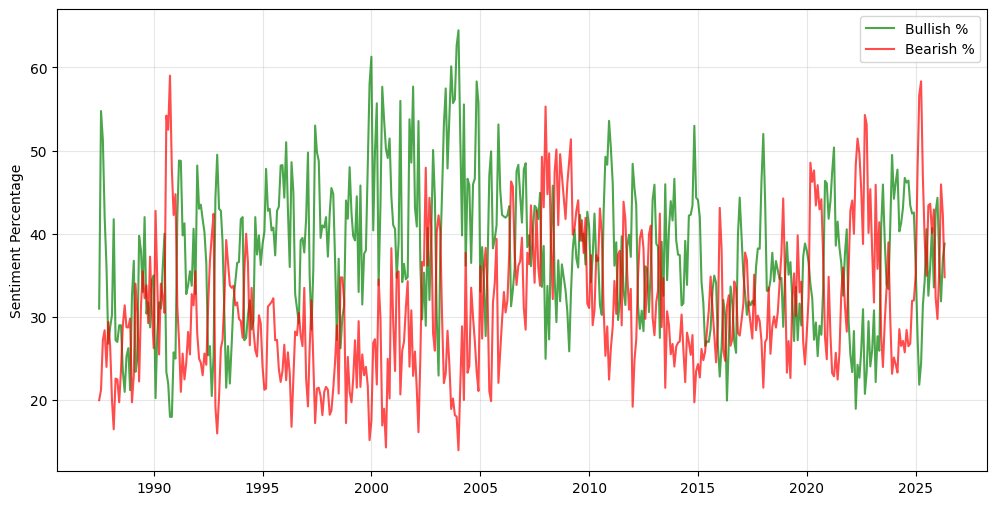

In [13]:
# 2. AAII US Investor Sentiment Bullish & Bearish Index
try:
    print('Fetching AAII Sentiment Index...')
    df_sentiment = pd.read_excel(f"{project_folder}/fear-greed_sentiment.xls", sheet_name='SENTIMENT', skiprows=5, header=None)
    df_sentiment.columns = ['Date', 'Bullish', 'Neutral', 'Bearish'] + list(df_sentiment.columns[4:])
    df_sentiment['Date'] = pd.to_datetime(df_sentiment['Date'], errors='coerce')

    df_sentiment = df_sentiment.dropna(subset=['Date', 'Bullish', 'Bearish'])
    df_sentiment.set_index('Date', inplace=True)
    df_sentiment = df_sentiment.sort_index()

    df_sentiment = df_sentiment[['Bullish', 'Bearish']].resample('MS').mean()

    # Add to raw
    raw['AAII_Bullish'] = df_sentiment['Bullish']
    raw['AAII_Bearish'] = df_sentiment['Bearish']

    # Check data
    plt.figure(figsize=(12, 6))
    plt.plot(raw.index, raw['AAII_Bullish']*100, label='Bullish %', color='green', alpha=0.7)
    plt.plot(raw.index, raw['AAII_Bearish']*100, label='Bearish %', color='red', alpha=0.7)
    plt.ylabel('Sentiment Percentage')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

except FileNotFoundError:
    print('Sentiment XLS file not found. Skipping.')
except Exception as e:
    print(f"Error processing Sentiment data: {e}")

Fetching Geopolitical Risk data...


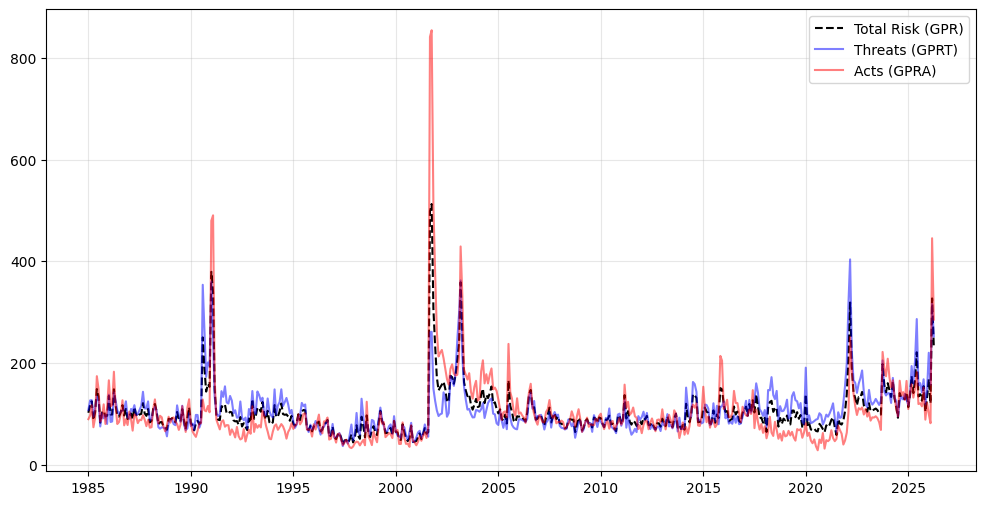

In [14]:
# 3. Geopolitical Risk/Threat/Acts Indices
try:
    print('Fetching Geopolitical Risk data...')
    df_GPR = pd.read_excel(f"{project_folder}/data_gpr_export.xls", sheet_name='Sheet1')
    df_GPR['Date'] = pd.to_datetime(df_GPR['month'], errors='coerce')

    df_GPR = df_GPR.dropna(subset=['month', 'GPR', 'GPRT', 'GPRA'])
    df_GPR.set_index('month', inplace=True)
    df_GPR = df_GPR.sort_index()

    df_GPR = df_GPR[['GPR', 'GPRT', 'GPRA']].resample('MS').mean()

    # Add to raw
    raw['GPR'] = df_GPR['GPR']
    raw['GPRT'] = df_GPR['GPRT']
    raw['GPRA'] = df_GPR['GPRA']

    # Check data
    plt.figure(figsize=(12, 6))
    plt.plot(raw.index, raw['GPR'], label='Total Risk (GPR)', color='black', linestyle="--")
    plt.plot(raw.index, raw['GPRT'], label='Threats (GPRT)', color='blue', alpha=0.5)
    plt.plot(raw.index, raw['GPRA'], label='Acts (GPRA)', color='red', alpha=0.5)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

except FileNotFoundError:
    print('GPR XLS file not found. Skipping.')
except Exception as e:
    print(f"Error processing GPR data: {e}")

### 1.3. Merge Everything Together

In [15]:
# Clean data
data = raw.loc[start_date:end_date].copy()
data = data.ffill()
data = data.dropna(how='all')

# Check data again
print(f'\nFinal merged shape: {data.shape}')
print(f'Final date range: {data.index.min().date()} → {data.index.max().date()}')
print(f'Total months: {len(data)}')

print(f'\nMissing values per column:')
print(data.isnull().sum())

# Preview the data
print(data.head())


Final merged shape: (438, 60)
Final date range: 1990-01-01 → 2026-06-01
Total months: 438

Missing values per column:
INDPRO                   0
CUMFNS                   0
RPI                      0
JTSJOL                 131
ICSA                     0
PAYEMS                   0
UNRATE                   0
PERMIT                   0
BUSLOANS                 0
M2SL                     0
FEDFUNDS                 0
CPIAUCSL                 0
PPIACO                   0
MICH                     0
TB3MS                    0
TB6MS                    0
GS1                      0
GS2                      0
GS5                      0
GS10                     0
BAMLH0A0HYM2            83
T10Y2YM                  0
EXUSUK                   0
WPU012202                0
WPU0121                  0
WTISPLC                  0
WPUSI019011              0
PNGASUSUSDM             24
USACSCICP02STSAM         0
UMCSENT                  0
KCFSI                    1
USEPUINDXD               0
EPUMONETARY      

## 2. Compute Year-over-Year Changes

In [16]:
macro_cols = ['INDPRO', 'CUMFNS', 'RPI', 'PAYEMS', 'JTSJOL', 'ICSA', 'CCSA/ICSA', 'PERMIT', 'COMPUTSA/PERMIT', 'BUSLOANS', 'M2SL', 'FEDFUNDS', 'CPIAUCSL', 'PPIACO', 'MICH']
bond_cols = ['TB3MS', 'TB6MS', 'GS1', 'GS2', 'GS5', 'GS10', 'BAMLH0A0HYM2', 'T10Y2YM']
fx_cols = ['Extended_TWEXBGSMTH', '1/EXSZUS', '1/EXJPUS', 'EXUSUK', 'ECU_EUR_USD', '1/EXCAUS']
commodity_cols = ['WPU012202', 'WPU0121', 'GOLD', 'WTISPLC', 'WPUSI019011', 'PNGASUSUSDM']
stock_cols = ['^GSPC', '^IXIC', '^DJI', '^N225', '^FCHI', '^AEX', '^BFX', '^GSPTSE', '^HSI', '^FTSE', '^GDAXI']
sentiment_cols = ['USACSCICP02STSAM', 'UMCSENT', 'AAII_Bullish', 'AAII_Bearish', 'KCFSI']
uncertainty_cols = ['GPR', 'GPRT', 'GPRA', 'USEPUINDXD', 'EPUMONETARY', 'EPUTRADE', 'VIXCLS']

all_cols = macro_cols + bond_cols + fx_cols + commodity_cols + stock_cols + sentiment_cols + uncertainty_cols

for col in macro_cols:
    if col not in data.columns:
        macro_cols.remove(col)
        print(f'Removed {col} from macro_cols')

for col in bond_cols:
    if col not in data.columns:
        bond_cols.remove(col)
        print(f'Removed {col} from bond_cols')

for col in fx_cols:
    if col not in data.columns:
        fx_cols.remove(col)
        print(f'Removed {col} from fx_cols')

for col in commodity_cols:
    if col not in data.columns:
        commodity_cols.remove(col)
        print(f'Removed {col} from commodity_cols')

for col in stock_cols:
    if col not in data.columns:
        stock_cols.remove(col)
        print(f'Removed {col} from stock_cols')

for col in sentiment_cols:
    if col not in data.columns:
        sentiment_cols.remove(col)
        print(f'Removed {col} from sentiment_cols')

for col in uncertainty_cols:
    if col not in data.columns:
        uncertainty_cols.remove(col)
        print(f'Removed {col} from uncertainty_cols')

In [17]:
print('Computing year-over-year changes...')
data_YoY = pd.DataFrame(index=data.index)

# Macroeconomic YoY % change and first difference
for col in macro_cols:
    if col in ['INDPRO', 'RPI', 'BUSLOANS', 'M2SL', 'PAYEMS','JTSJOL', 'ICSA', 'PERMIT', 'CPIAUCSL', 'PPIACO']:
        data_YoY[col] = data[col].pct_change(12) * 100
        print(f'Applied YoY % change: {col}')
    else:
        data_YoY[col] = data[col]

# No change for bonds
for col in bond_cols:
    data_YoY[col] = data[col]

# YoY % change for all FX series
for col in fx_cols:
      data_YoY[col] = data[col].pct_change(12) * 100
      print(f'Applied YoY % change: {col}')

# YoY % change for all commodities
for col in commodity_cols:
      data_YoY[col] = data[col].pct_change(12) * 100
      print(f'Applied YoY % change: {col}')

# YoY % change for equity indices
for col in stock_cols:
      data_YoY[col] = data[col].pct_change(12) * 100
      print(f'Applied YoY % change: {col}')

# YoY % change for sentiment
for col in sentiment_cols:
    if col in ['USACSCICP02STSAM', 'UMCSENT']:
        data_YoY[col] = data[col].pct_change(12) * 100
        print(f'Applied YoY % change: {col}')
    else:
        data_YoY[col] = data[col]

# YoY % change for uncertainty indices
for col in uncertainty_cols:
    if col in ['GPR', 'GPRT', 'GPRA', 'USEPUINDXD', 'EPUMONETARY', 'EPUTRADE']:
        data_YoY[col] = data[col].pct_change(12) * 100
        print(f'Applied YoY % change: {col}')
    else:
        data_YoY[col] = data[col]

Computing year-over-year changes...
Applied YoY % change: INDPRO
Applied YoY % change: RPI
Applied YoY % change: PAYEMS
Applied YoY % change: JTSJOL
Applied YoY % change: ICSA
Applied YoY % change: PERMIT
Applied YoY % change: BUSLOANS
Applied YoY % change: M2SL
Applied YoY % change: CPIAUCSL
Applied YoY % change: PPIACO
Applied YoY % change: Extended_TWEXBGSMTH
Applied YoY % change: 1/EXSZUS
Applied YoY % change: 1/EXJPUS
Applied YoY % change: EXUSUK
Applied YoY % change: ECU_EUR_USD
Applied YoY % change: 1/EXCAUS
Applied YoY % change: WPU012202
Applied YoY % change: WPU0121
Applied YoY % change: GOLD
Applied YoY % change: WTISPLC
Applied YoY % change: WPUSI019011
Applied YoY % change: PNGASUSUSDM
Applied YoY % change: ^GSPC
Applied YoY % change: ^IXIC
Applied YoY % change: ^DJI
Applied YoY % change: ^N225
Applied YoY % change: ^FCHI
Applied YoY % change: ^AEX
Applied YoY % change: ^BFX
Applied YoY % change: ^GSPTSE
Applied YoY % change: ^HSI
Applied YoY % change: ^FTSE
Applied YoY % 

In [18]:
data_YoY = data_YoY.dropna()

print(f'\nShape after transformations: {data_YoY.shape}')
print(f'Date range: {data_YoY.index.min().date()} → {data_YoY.index.max().date()}')
print(f'\nRemaining NaNs per column:')
print(data_YoY.isnull().sum()[data_YoY.isnull().sum() >= 0])


Shape after transformations: (295, 58)
Date range: 2001-12-01 → 2026-06-01

Remaining NaNs per column:
INDPRO                 0
CUMFNS                 0
RPI                    0
PAYEMS                 0
JTSJOL                 0
ICSA                   0
CCSA/ICSA              0
PERMIT                 0
COMPUTSA/PERMIT        0
BUSLOANS               0
M2SL                   0
FEDFUNDS               0
CPIAUCSL               0
PPIACO                 0
MICH                   0
TB3MS                  0
TB6MS                  0
GS1                    0
GS2                    0
GS5                    0
GS10                   0
BAMLH0A0HYM2           0
T10Y2YM                0
Extended_TWEXBGSMTH    0
1/EXSZUS               0
1/EXJPUS               0
EXUSUK                 0
ECU_EUR_USD            0
1/EXCAUS               0
WPU012202              0
WPU0121                0
GOLD                   0
WTISPLC                0
WPUSI019011            0
PNGASUSUSDM            0
^GSPC                

## 3. Rolling 5-Year Quantile Standardization
We replace each macro value with its quantile rank within the past 60 months.

In [19]:
def rolling_quantile_standardize(series, window=120):
    """
    For each time t, compute the quantile rank of series[t]
    within the past 'window' observations.
    """
    result = pd.Series(index=series.index, dtype=float)
    for i in range(window-1, len(series)):
        window_data = series.iloc[i-(window-1):i+1].dropna()
        if pd.isna(series.iloc[i]) or len(window_data) == 0:
            continue  # leaves result.iloc[i] as NaN
        result.iloc[i] = (window_data <= series.iloc[i]).sum() / len(window_data)

    return result

print('Computing rolling quantile standardization...')
data_q = pd.DataFrame(index=data_YoY.index)

for col in all_cols:
    data_q[col] = rolling_quantile_standardize(data_YoY[col], window=rolling_window)

# Clean quantile data
data_q = data_q.ffill().dropna()

# Check quantile data
print(f'\nStandardized shape: {data_q.shape}')
data_q.describe().round(2)

Computing rolling quantile standardization...

Standardized shape: (236, 58)


,INDPRO,CUMFNS,RPI,PAYEMS,JTSJOL,ICSA,CCSA/ICSA,PERMIT,COMPUTSA/PERMIT,BUSLOANS,...,AAII_Bullish,AAII_Bearish,KCFSI,GPR,GPRT,GPRA,USEPUINDXD,EPUMONETARY,EPUTRADE,VIXCLS
count,236.00,236.00,236.00,236.00,236.00,236.00,236.00,236.00,236.00,236.00,...,236.00,236.00,236.00,236.00,236.00,236.00,236.00,236.00,236.00,236.00
mean,0.47,0.55,0.48,0.46,0.45,0.57,0.44,0.45,0.56,0.46,...,0.48,0.53,0.48,0.53,0.53,0.54,0.54,0.52,0.54,0.49
std,0.29,0.31,0.29,0.35,0.31,0.31,0.32,0.32,0.34,0.30,...,0.29,0.31,0.31,0.29,0.29,0.31,0.30,0.29,0.31,0.32
min,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,...,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02
25%,0.28,0.27,0.26,0.13,0.16,0.32,0.13,0.15,0.20,0.22,...,0.20,0.25,0.23,0.28,0.33,0.26,0.28,0.28,0.25,0.20
50%,0.47,0.58,0.50,0.43,0.45,0.62,0.38,0.40,0.62,0.43,...,0.46,0.56,0.45,0.55,0.52,0.55,0.57,0.49,0.53,0.48
75%,0.68,0.83,0.72,0.80,0.70,0.84,0.72,0.72,0.85,0.73,...,0.73,0.78,0.75,0.78,0.77,0.85,0.80,0.78,0.83,0.82
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


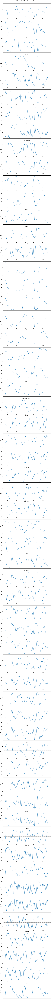

In [20]:
# Plot standardized macro variables
n_cols = len(all_cols)
fig, axes = plt.subplots(n_cols, 1, figsize=(12, 4*n_cols))

for i, col in enumerate(all_cols):
    axes[i].plot(data_q.index, data_q[col], lw=0.8)
    axes[i].axhline(0.5, color='gray', lw=0.7, linestyle='--')
    axes[i].set_title(col)
    axes[i].set_ylim(-0.05, 1.05)
    axes[i].set_ylabel('Quantile')

plt.suptitle('Rolling 5-Year Quantile Standardized Macro Variables', y=1.0)
plt.tight_layout()
plt.show()

## 4. Bayesian Marginal Likelihood (Splitting Criterion)

Instead of splitting based on the marginal likelihood of a DNS model, as in the paper, we compute the Bayesian marginal likelihood under a Normal-Inverse-Gamma conjugate model:

$$p(Y) = \int p(Y | \mu, \sigma^2) \, p(\mu, \sigma^2) \, d\mu \, d\sigma^2$$

This has a closed-form expression (see below). It naturally penalizes splits that reduce regime size
without improving fit.

**Model:**
* Likelihood - $Y_i \sim \mathcal{N}(\mu, \sigma^2)$: $Y_i$ is a single observation (e.g., the CPI quantile for June 2024). We assume that within any specific economic regime, the macro variable follows a Normal distribution with some mean ($\mu$) and variance ($\sigma^2$).
* Prior for the Mean - $\mu \sim \mathcal{N}(\mu_0, \sigma^2 / \kappa_0)$: Since we don't know the "true" average of the regime, we treat $\mu$ as a random variable. We assume it's centered at our best guess $\mu_0$. The variance is scaled by $\sigma^2$ because if the data is generally very noisy, our guess for the mean should be noisier too.
* Prior for the Variance - $\sigma^2 \sim \text{IG}(\alpha_0, \beta_0)$: The Inverse-Gamma (IG) is the standard distribution for "variance" because it is only defined for positive numbers and has a "fat tail," which accounts for the possibility of sudden high-volatility regimes.

**Prior Hyperparameters:**
* Mean - $\mu_0$
* Precision Scaling - $\kappa_0$
* Shape for Inverse Gamma - $\alpha_0$
* Scale for Inverse Gamma - $\beta_0$

**Posterior Hyperparameters (from Wikipedia, unfortunately):**
* Sample Mean: $$\overline{y} = \frac{1}{n}\sum_{i=1}^n Y_i$$
* Mean (weighted average of prior and data): $$\mu_n = \frac{\kappa_0 \mu_0 + n \overline{y}}{\kappa_0 + n}$$
* Precision Scaling: $$\kappa_n = \kappa_0 + n$$
* Shape for Inverse Gamma: $$\alpha_n = \alpha_0 + \frac{n}{2}$$
* Scale for Inverse Gamma: $$\beta_n = \beta_0 + \frac{1}{2} \sum_{i=1}^n (Y_i - \overline{y})^2 + \frac{n \kappa_0}{\kappa_0 + n} \frac{(\mu_0 - \overline{y})^2}{2}$$

**Marginal Likelihood:** $$p(Y) = \frac{1}{(2\pi)^{n/2}} \sqrt{\frac{\kappa_0}{\kappa_n}} \frac{\Gamma(\alpha_n)}{\Gamma(\alpha_0)} \frac{\beta_0^{\alpha_0}}{\beta_n^{\alpha_n}}$$

In [21]:
from scipy.special import gammaln

# Log marginal likelihood under a Normal-Inverse-Gamma (NIG) conjugate model
def log_marginal_likelihood_nig(Y, mu0=0.0, kappa0=1.0, alpha0=1.0, beta0=1.0):
    # Clean array
    Y = np.asarray(Y, dtype=float)
    Y = Y[np.isfinite(Y)]
    n = len(Y)
    if n < 2: # We need at least 2 points to define a variance
        return -np.inf # -inf ensures the tree rejects splits that create singleton regimes

    # Posterior hyperparameters
    ybar = Y.mean()
    kappa_n = kappa0 + n
    mu_n = (kappa0 * mu0 + n * ybar) / kappa_n
    alpha_n = alpha0 + n / 2.0
    beta_n = (beta0 + np.sum((Y - ybar) ** 2) / 2.0 + (n * kappa0 * (ybar - mu0) ** 2) / (2.0 * kappa_n))

    # Log marginal likelihood
    log_ml = - (n / 2.0) * np.log(2.0 * np.pi) + (1 / 2.0) * np.log(kappa0 / kappa_n) + (gammaln(alpha_n) - gammaln(alpha0)) + alpha0 * np.log(beta0) - alpha_n * np.log(beta_n)

    return log_ml

# Sum of log marginal likelihoods across all regimes
def total_log_ml(regime_labels, target_data, unique_labels=None):
    # Monthly regime labels
    regime_labels = np.asarray(regime_labels)
    if unique_labels is None:
        unique_labels = np.unique(regime_labels)

    target = np.asarray(target_data)
    if target.ndim == 1:
        target = target.reshape(-1, 1)

    # Compute sum
    total = 0.0
    for label in unique_labels:
        mask = (regime_labels == label)

        # Insufficient data
        if mask.sum() < 2:
            return -np.inf

        for col_idx in range(target.shape[1]):
            total += log_marginal_likelihood_nig(target[mask, col_idx])

    return total

print('Bayesian marginal likelihood functions defined.')

Bayesian marginal likelihood functions defined.


## 5. Reconstruct Yields from Nelson-Siegel-Svensson (NSS) Parameters
We load the Fed's NSS parameters (`feds200628.csv` from https://www.federalreserve.gov/data/nominal-yield-curve.htm) and reconstruct zero-coupon yields at 13 maturities. These reconstructed yields are used as the marginal likelihood target in both the full-sample classifier and the expanding
window forecaster.

In [22]:
# Load Svensson parameters
svensson_fred_raw = pd.read_csv(f"{project_folder}/feds200628.csv", skiprows=9, index_col=0, parse_dates=True)
svensson_fred_raw = svensson_fred_raw[['BETA0', 'BETA1', 'BETA2', 'BETA3', 'TAU1', 'TAU2']]
svensson_fred_raw = svensson_fred_raw.replace(-999.99, np.nan).dropna()
svensson_monthly = svensson_fred_raw.resample('MS').first().dropna()

# Check data
print(f'Svensson parameters: {svensson_monthly.shape}')
print(f'Date range: {svensson_monthly.index.min().date()} → {svensson_monthly.index.max().date()}')

# Svensson yield reconstruction
def svensson_yield(tau_months, beta0, beta1, beta2, beta3, tau1, tau2):
    tau = tau_months / 12.0  # convert to years
    f1 = (1 - np.exp(-tau / tau1)) / (tau / tau1)
    f2 = f1 - np.exp(-tau / tau1)
    f3 = (1 - np.exp(-tau / tau2)) / (tau / tau2) - np.exp(-tau / tau2)
    return beta0 + beta1 * f1 + beta2 * f2 + beta3 * f3

# Reconstruct at 13 maturities (pg. 12)
maturities_months = [3, 6, 9, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120]
maturity_labels = [f'Y{m}M' for m in maturities_months]

yields_svensson = pd.DataFrame(index=svensson_monthly.index, columns=maturity_labels, dtype=float)

for date, row in svensson_monthly.iterrows():
    for m, label in zip(maturities_months, maturity_labels):
        yields_svensson.loc[date, label] = svensson_yield(m, row.BETA0, row.BETA1, row.BETA2, row.BETA3, row.TAU1, row.TAU2)

# Clean data
yields_svensson = yields_svensson.dropna()

# Check data
print(f'\nReconstructed yields shape: {yields_svensson.shape}')
print(f'Date range: {yields_svensson.index.min().date()} → {yields_svensson.index.max().date()}')
yields_svensson.head()

Svensson parameters: (557, 6)
Date range: 1980-01-01 → 2026-05-01

Reconstructed yields shape: (557, 13)
Date range: 1980-01-01 → 2026-05-01


,Y3M,Y6M,Y9M,Y12M,Y24M,Y36M,Y48M,Y60M,Y72M,Y84M,Y96M,Y108M,Y120M
Date,,,,,,,,,,,,,
1980-01-01,12.578174,12.204127,11.881552,11.603698,10.832514,10.421302,10.211237,10.111768,10.071732,10.062548,10.068496,10.081114,10.095983
1980-02-01,12.460933,12.250100,12.060350,11.890033,11.373421,11.059761,10.885231,10.803453,10.781598,10.796959,10.834169,10.883059,10.937075
1980-03-01,14.275042,14.578194,14.692831,14.680344,14.080893,13.382222,12.881085,12.566536,12.376847,12.261603,12.188848,12.140210,12.105566
1980-04-01,15.693937,15.509740,15.274143,15.008758,13.911927,13.041023,12.473271,12.149926,11.992111,11.935610,11.936218,11.966170,12.009126
1980-05-01,10.970851,10.793823,10.642654,10.514198,10.176408,10.029190,9.990632,10.011446,10.062393,10.126469,10.194073,10.260035,10.321791


## 6. Target Variable Setup
We use the Svensson-reconstructed yields as target data for the marginal likelihood.

Although using reconstructed yields results in a significantly lower log marginal likelihood compared to using fred_raw yields, the signal-to-noise ratio is arguably higher. This is because the NSS model acts as a structural filter, smoothing out market noise. Additionally, fred_raw yields have more degrees of freedom, which allows for more flexibility in fitting and thus an artificially lower log marginal likelihood.

In [23]:
# Align Svensson yields and macro quantiles to a common date index
common_idx = data_q.index.intersection(yields_svensson.index).sort_values()
data_q = data_q.loc[common_idx]
target_data = yields_svensson.loc[common_idx].values

'''
Alternative Target Options

# Yields as Target
common_idx = data_q.index # align everything to common dates
yield_series = ['DGS3MO', 'DGS1', 'DGS2', 'DGS5', 'DGS10', 'DGS30']
yields = pdr.get_data_fred(yield_series, start=start_date, end=end_date)
yields = yields.resample('MS').mean()
yields.columns = ['Y3M', 'Y1Y', 'Y2Y', 'Y5Y', 'Y10Y', 'Y30Y']
yields = yields.ffill().dropna()
yields = yields.loc[data_q.index]
target_data = yields.values

# Macros as Target Data
common_idx = data_q.index # align everything to common dates
target_data = data.loc[common_idx, macro_cols].values # fred_raw macro values
'''

# Check data
print(f'Target data shape: {target_data.shape}')
print(f'Macro (split candidates) shape: {data_q.shape}')
print(f'Date range: {common_idx.min().date()} → {common_idx.max().date()}')

Target data shape: (235, 13)
Macro (split candidates) shape: (235, 58)
Date range: 2006-11-01 → 2026-05-01


## 7. Sequential Tree Growing (2 Splits, 3 Regimes)
Greedy search: at each step, we evaluate every candidate
(macro variable $\times$ threshold) on every current leaf node and
pick the one with the highest total marginal likelihood (sec. 2.2.2).

In [24]:
# Search all (variable, threshold) combinations for the best split of a given leaf node
def find_best_split(regime_labels, leaf_label, data_q, target_data, thresholds, min_obs, next_label):
    """
    Parameters:
    regime_labels - regime label array for all observations
    leaf_label - integer label of the leaf node to split
    data_q - DataFrame of standardized macro variables (split candidates)
    target_data - array of target observations (yields or macros)
    thresholds - list of quantile thresholds to try
    min_obs - minimum observations required in each resulting regime
    next_label - integer label to assign to the new (right) child node

    Returns:
    best_macro - column name of the best splitting variable
    best_threshold - quantile threshold of the best split
    best_ml - total log marginal likelihood achieved
    best_labels - updated regime label array after the split
    """
    leaf_mask = (regime_labels == leaf_label)

    # Initialize best guesses
    best_ml = -np.inf
    best_macro = None
    best_threshold = None
    best_labels = None

    # Track all results for diagnostics
    all_results = []

    for macro in data_q.columns:
        for threshold in thresholds:
            # Proposed split: where var < threshold -> leaf_label; where var >= threshold -> next_label
            candidate_labels = regime_labels.copy()
            split_mask = leaf_mask & (data_q[macro].values >= threshold)
            candidate_labels[split_mask] = next_label

            # Check minimum number of observations in both new child nodes
            left_count  = (leaf_mask & (data_q[macro].values < threshold)).sum()
            right_count = (leaf_mask & (data_q[macro].values >= threshold)).sum()
            if left_count < min_obs or right_count < min_obs:
                continue

            # Evaluate total marginal likelihood across all regimes
            ml = total_log_ml(candidate_labels, target_data)

            # Append results
            all_results.append({'macro': macro, 'threshold': threshold, 'ml': ml})

            if ml > best_ml:
                best_ml = ml
                best_macro = macro
                best_threshold = threshold
                best_labels = candidate_labels.copy()

    # Print top 5 candidates
    all_results = sorted(all_results, key=lambda x: x['ml'], reverse=True)
    print(f'\n  Top 5 candidates for Leaf {leaf_label}:')
    for r in all_results[:5]:
        print(f'    {r["macro"]:20s} threshold = {r["threshold"]} | log ML = {r["ml"]:.4f}')

    return best_macro, best_threshold, best_ml, best_labels

print('Split search function defined.')

Split search function defined.


In [25]:
# Grow tree
def grow_tree(data_q, target_data, thresholds, min_obs, max_regimes):
    """
    At each step:
      1. Try splitting every current leaf
      2. Pick the (leaf, variable, threshold) combination with highest total marginal likelihood
      3. Apply the split and record it
      4. Stop when max_regimes is reached
    """
    n = len(data_q) # total number of observations (months)
    regime_labels = np.zeros(n, dtype=int) # start every observation in regime 0
    splits = [] # empty list to record split decisions
    n_regimes = 1 # start with 1 regime
    next_label = 1 # the label to assign to the next new regime

    while n_regimes < max_regimes:
        print(f'\n── Split {len(splits)+1}: Searching across '
              f'{n_regimes} leaf node(s) × '
              f'{len(data_q.columns)} variables × '
              f'{len(thresholds)} thresholds ──')

        best_global_ml = -np.inf
        best_global_macro = None
        best_global_threshold = None
        best_global_labels = None
        best_leaf = None

        current_leaves = np.unique(regime_labels)

        for leaf in current_leaves:
            leaf_size = (regime_labels == leaf).sum()
            if leaf_size < 2 * min_obs:
                print(f'\nLeaf {leaf}: too small to split ({leaf_size} observations), skipping.')
                continue

            macro, threshold, ml, labels = find_best_split(regime_labels, leaf, data_q, target_data, thresholds, min_obs, next_label)

            if macro is not None:
                if ml > best_global_ml:
                    best_global_ml = ml
                    best_global_macro = macro
                    best_global_threshold = threshold
                    best_global_labels = labels
                    best_leaf = leaf
            else:
                print(f'Leaf {leaf}: no valid split found.')

        if best_global_macro is None:
            print('\nNo valid split found anywhere. Stopping.')
            break

        # Apply the best split
        regime_labels = best_global_labels
        split_info = {
            'number_of_splits': len(splits) + 1,
            'leaf_split': best_leaf,
            'macro_variable': best_global_macro,
            'threshold': best_global_threshold,
            'log_ml': best_global_ml,
            'new_label': next_label
        }
        splits.append(split_info)

        print(f'\nSplit {len(splits)} applied: '
              f'  Leaf {best_leaf} split on {best_global_macro} at {best_global_threshold:.1f}')

        for label in np.unique(regime_labels):
            count = (regime_labels == label).sum()
            print(f'    Regime {label}: {count} months')

        next_label += 1
        n_regimes  += 1

    return regime_labels, splits

print('Tree growing function defined.')

Tree growing function defined.


In [26]:
print('Growing macro-instrumented regime tree...')

regime_labels, splits = grow_tree(
    data_q = data_q,
    target_data = target_data,
    thresholds = thresholds,
    min_obs = min_regime_months,
    max_regimes = max_regimes
)

print('\nTree growing complete.')

Growing macro-instrumented regime tree...

── Split 1: Searching across 1 leaf node(s) × 58 variables × 4 thresholds ──

  Top 5 candidates for Leaf 0:
    GS10                 threshold = 0.6 | log ML = -4127.0290
    GS1                  threshold = 0.2 | log ML = -4534.0494
    TB6MS                threshold = 0.2 | log ML = -4570.1256
    PAYEMS               threshold = 0.8 | log ML = -4681.5286
    GS10                 threshold = 0.4 | log ML = -4722.0605

Split 1 applied:   Leaf 0 split on GS10 at 0.6
    Regime 0: 145 months
    Regime 1: 90 months

── Split 2: Searching across 2 leaf node(s) × 58 variables × 4 thresholds ──

  Top 5 candidates for Leaf 0:
    PAYEMS               threshold = 0.4 | log ML = -3538.6691
    PAYEMS               threshold = 0.6 | log ML = -3626.8921
    JTSJOL               threshold = 0.4 | log ML = -3709.6636
    ICSA                 threshold = 0.8 | log ML = -3733.9401
    PAYEMS               threshold = 0.8 | log ML = -3744.9471

  Top 5 ca

## 8. Results, Tree Structure, and Regime Summary

In [27]:
print('Tree Structure')

for s in splits:
    print(f"\nSplit {s['number_of_splits']}:")
    print(f"  Node split    : Regime {s['leaf_split']}")
    print(f"  Macro Variable: {s['macro_variable']}")
    print(f"  Threshold     : {s['threshold']}")
    print(f"  Log ML        : {s['log_ml']:.4f}")
    print(f"  Left child    : Regime {s['leaf_split']}  "
          f"({s['macro_variable']} < {s['threshold']})")
    print(f"  Right child   : Regime {s['new_label']}  "
          f"({s['macro_variable']} >= {s['threshold']})")
    print()

print('────────────────────────────────────────────')
print('Regime Sizes:')
for label in sorted(np.unique(regime_labels)):
    count = (regime_labels == label).sum()
    pct = count / len(regime_labels) * 100
    print(f'  Regime {label}: {count:4d} months  ({pct:.1f}%)')

Tree Structure

Split 1:
  Node split    : Regime 0
  Macro Variable: GS10
  Threshold     : 0.6
  Log ML        : -4127.0290
  Left child    : Regime 0  (GS10 < 0.6)
  Right child   : Regime 1  (GS10 >= 0.6)


Split 2:
  Node split    : Regime 0
  Macro Variable: PAYEMS
  Threshold     : 0.4
  Log ML        : -3538.6691
  Left child    : Regime 0  (PAYEMS < 0.4)
  Right child   : Regime 2  (PAYEMS >= 0.4)

────────────────────────────────────────────
Regime Sizes:
  Regime 0:   58 months  (24.7%)
  Regime 1:   90 months  (38.3%)
  Regime 2:   87 months  (37.0%)


## 9. Visualizations

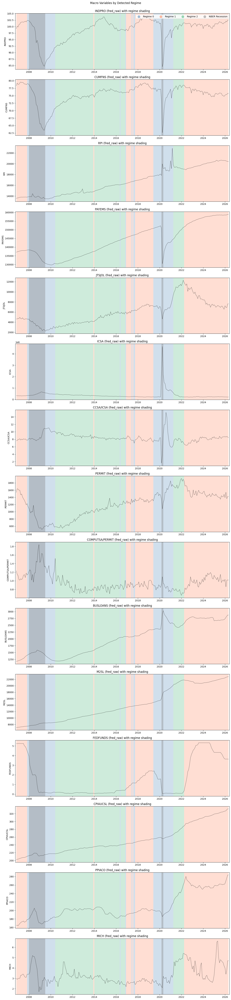

In [28]:
# Get NBER recession dates from FRED
recession_series = fred.get_series('USREC', start=start_date, end=end_date)
recession = pd.DataFrame(recession_series, columns=['USREC'])
recession = recession.ffill().fillna(0)

# Plots of Macro Variables Colored by Regime
n_cols_plot = len(macro_cols)
fig, axes = plt.subplots(n_cols_plot, 1, figsize=(14, 4 * n_cols_plot))
colors = {0: 'steelblue', 1: 'coral', 2: 'mediumseagreen', 3: 'orchid', 4: 'goldenrod'}

if n_cols_plot == 1:
    axes = [axes]

for ax, col in zip(axes, macro_cols):
    ax.plot(common_idx, data.loc[common_idx, col], color='black', lw=0.5, zorder=2)

    # Shade background by regime
    for label in np.unique(regime_labels):
        mask = (regime_labels == label)

        # Find contiguous blocks
        in_block = False
        block_start = None
        for i, date in enumerate(common_idx):
            if mask[i] and not in_block:
                in_block = True
                block_start = date
            # If this month does not belong to the current regime and we were in a block, the block just ended
            elif not mask[i] and in_block:
                in_block = False
                ax.axvspan(block_start, date, alpha=0.25, color=colors[label], lw=0) # Draw the span from `block_start` to `date`
        # Close any open block at the end of the sample
        if in_block:
            ax.axvspan(block_start, common_idx[-1], alpha=0.25, color=colors[label], lw=0)

    # Shade NBER recessions
    in_recession = False
    rec_start = None
    for date, val in recession.iterrows():
        if val['USREC'] == 1 and not in_recession:
            in_recession = True
            rec_start = date
        elif val['USREC'] == 0 and in_recession:
            in_recession = False
            ax.axvspan(rec_start, date, alpha=0.35, color='grey', lw=0, zorder=1)
    # Close any open recession at end of sample
    if in_recession:
        ax.axvspan(rec_start, recession.index[-1], alpha=0.25, color='grey', lw=0, zorder=1)

    ax.set_xlim(common_idx.min() - pd.DateOffset(months=1), common_idx.max() + pd.DateOffset(months=1))
    ax.set_ylabel(col)
    ax.set_title(f'{col} (fred_raw) with regime shading')

# Legend
for label in np.unique(regime_labels):
    axes[0].scatter([], [], color=colors[label], alpha=0.5, label=f'Regime {label}', s=100)
axes[0].scatter([], [], color='grey', alpha=0.5, label='NBER Recession', s=100)
axes[0].legend(loc='upper right', ncol=len(np.unique(regime_labels)) + 1)

plt.suptitle('Macro Variables by Detected Regime', y=1.0)
plt.tight_layout()
plt.show()

## 10. Data Analysis and Statistics

In [29]:
# Record everything in one table
results = pd.DataFrame(index=common_idx)
results[all_cols] = data.loc[common_idx, all_cols] # raw values
results[[f'{col}_q' for col in all_cols]] = data_q.loc[common_idx] # quantile values
results['regime'] = regime_labels

# Preview
results.head()

/tmp/ipykernel_4319/337712328.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  results[[f'{col}_q' for col in all_cols]] = data_q.loc[common_idx] # quantile values
/tmp/ipykernel_4319/337712328.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  results[[f'{col}_q' for col in all_cols]] = data_q.loc[common_idx] # quantile values
/tmp/ipykernel_4319/337712328.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining 

,INDPRO,CUMFNS,RPI,PAYEMS,JTSJOL,ICSA,CCSA/ICSA,PERMIT,COMPUTSA/PERMIT,BUSLOANS,...,AAII_Bearish_q,KCFSI_q,GPR_q,GPRT_q,GPRA_q,USEPUINDXD_q,EPUMONETARY_q,EPUTRADE_q,VIXCLS_q,regime
2006-11-01,99.1627,78.2681,13547.935,137060.0,4645.0,326250.0,7.589272,1535.0,1.233225,1170.5212,...,0.783333,0.050000,0.633333,0.683333,0.516667,0.683333,0.766667,0.966667,0.016667,1
2006-12-01,100.1735,79.2270,13627.346,137249.0,4620.0,324000.0,7.658025,1638.0,1.152625,1182.8014,...,0.866667,0.133333,0.516667,0.733333,0.166667,0.216667,0.066667,0.333333,0.033333,1
2007-01-01,99.8346,78.7810,13651.743,137472.0,4763.0,317250.0,7.956659,1626.0,1.120541,1192.2900,...,0.533333,0.066667,0.633333,0.533333,0.633333,0.566667,0.400000,0.900000,0.050000,1
2007-02-01,100.7753,78.8347,13711.191,137560.0,4699.0,322750.0,7.960496,1598.0,1.026283,1204.8529,...,0.433333,0.066667,0.583333,0.600000,0.483333,0.666667,0.283333,0.650000,0.083333,1
2007-03-01,100.9547,79.2850,13762.811,137784.0,4962.0,309400.0,8.141564,1596.0,1.016917,1215.6537,...,0.816667,0.516667,0.483333,0.450000,0.450000,0.716667,0.700000,0.283333,0.483333,1


In [30]:
# Recession Overlap Statistics
print('Recession Overlap Statistics:')

recession_aligned = recession.reindex(common_idx, method='ffill').fillna(0)
rec_mask = recession_aligned['USREC'].values == 1
total_rec_months = rec_mask.sum()
total_months = len(common_idx)

print(f'\n  Total months in sample: {total_months}')
print(f'  Total recession months: {total_rec_months} ({total_rec_months/total_months*100:.1f}%)')

for label in sorted(np.unique(regime_labels)):
    regime_mask = (regime_labels == label)
    regime_months = regime_mask.sum()

    # Months that are both in this regime AND in recession
    overlap = (regime_mask & rec_mask).sum()

    # % of this regime that is recession
    pct_of_regime = overlap / regime_months * 100

    # % of all recessions captured by this regime
    pct_of_rec = overlap / total_rec_months * 100

    print(f'\nRegime {label} ({regime_months:3d} months):')
    print(f'  Recession months: {overlap}')
    print(f'  % of regime in recession: {pct_of_regime:.1f}%')
    print(f'  % of recessions captured: {pct_of_rec:.1f}%')

Recession Overlap Statistics:

  Total months in sample: 235
  Total recession months: 20 (8.5%)

Regime 0 ( 58 months):
  Recession months: 20
  % of regime in recession: 34.5%
  % of recessions captured: 100.0%

Regime 1 ( 90 months):
  Recession months: 0
  % of regime in recession: 0.0%
  % of recessions captured: 0.0%

Regime 2 ( 87 months):
  Recession months: 0
  % of regime in recession: 0.0%
  % of recessions captured: 0.0%


In [31]:
# Regime Statistics Table
print('Regime Statistics (with fred_raw macro values):\n')
stat_rows = []
for label in sorted(np.unique(regime_labels)):
    mask = (regime_labels == label)
    row = {'Regime': label, 'N months': mask.sum()}
    for col in macro_cols:
        vals = data.loc[common_idx[mask], col]
        row[f'{col} mean'] = round(vals.mean(), 3)
        row[f'{col} std']  = round(vals.std(), 3)
    stat_rows.append(row)

stats_df = pd.DataFrame(stat_rows).set_index('Regime')
stats_df

Regime Statistics (with fred_raw macro values):



,N months,INDPRO mean,INDPRO std,CUMFNS mean,CUMFNS std,RPI mean,RPI std,PAYEMS mean,PAYEMS std,JTSJOL mean,...,M2SL mean,M2SL std,FEDFUNDS mean,FEDFUNDS std,CPIAUCSL mean,CPIAUCSL std,PPIACO mean,PPIACO std,MICH mean,MICH std
Regime,,,,,,,,,,,,,,,,,,,,,
0,58,95.200,6.048,72.562,5.147,15878.676,2496.276,139211.586,7501.323,4807.931,...,12005.179,4445.907,0.989,1.158,234.119,21.160,188.533,11.565,2.986,0.799
1,90,101.220,1.245,77.056,1.448,18197.531,2272.013,151440.033,7019.244,7401.811,...,17235.642,5247.847,3.510,1.679,278.116,41.128,229.334,36.999,3.523,0.981
2,87,98.625,3.002,75.376,1.874,15613.320,1621.995,138493.724,5763.616,5302.920,...,12199.395,3773.456,0.144,0.089,237.937,16.731,202.867,16.640,3.275,0.705


# Proxy-Variable Random Forest Regime Classification and Forecaster

Based on:
> Yuan Zhao, Xue Gong, Weiguo Zhang, Weijun Xu. *Stock return forecasting based on the proxy variables of category factors*. (2025).

- Tree-based regime classification is analyzed via a Random Forest Classifier trained on the full feature set, extracting per-regime SHAP beeswarm plots and waterfall explanations to identify which variables drive each regime
- Reduces the ~60-variable feature space to 12 economically interpretable proxy variables (one per category) using SHAP importance weights from a Random Forest Regressor targeting the NSS yield curve
- Benchmarks the proxy variable approach against PCA and RMT-PCA via a Model Confidence Set test on Brier scores

## 11. Feature Importance via Random Forest Classification

We train a Random Forest Classifier based on the Bayesian tree results to determine the importance of each feature in regime classification.

In [32]:
from sklearn.ensemble import RandomForestClassifier
import shap

# data_q as features (X) and regime_labels as target (y)
X = data_q.copy()
y = regime_labels.copy()

# Initialize and train the Random Forest
base_rf = RandomForestClassifier(n_estimators=100, max_depth=None, random_state=42)
base_rf.fit(X, y)

print(f"Random Forest trained on {len(X)} months.")
print(f"Regimes identified: {np.unique(y)}")

Random Forest trained on 235 months.
Regimes identified: [0 1 2]


Random Forest Accuracy (Alignment with Bayesian Tree Results): 100.00%

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        58
           1       1.00      1.00      1.00        90
           2       1.00      1.00      1.00        87

    accuracy                           1.00       235
   macro avg       1.00      1.00      1.00       235
weighted avg       1.00      1.00      1.00       235



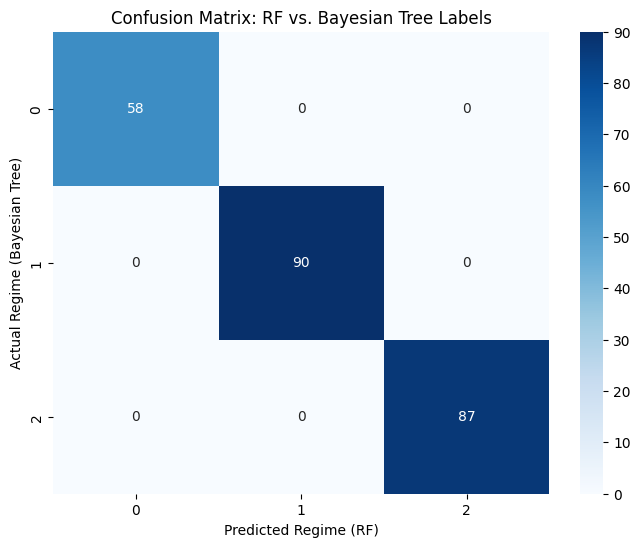

In [33]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Generate predictions
y_pred = base_rf.predict(X)

# Calculate accuracy
accuracy = accuracy_score(y, y_pred)
print(f"Random Forest Accuracy (Alignment with Bayesian Tree Results): {accuracy:.2%}\n") # Confirm 100% (hopefully)

# Show Precision, Recall, and F1-Score for each regime
print("Classification Report:")
print(classification_report(y, y_pred))

# 4. Plot Confusion Matrix
cm = confusion_matrix(y, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel('Predicted Regime (RF)')
plt.ylabel('Actual Regime (Bayesian Tree)')
plt.title('Confusion Matrix: RF vs. Bayesian Tree Labels')
plt.show()


Beeswarm — Regime 0


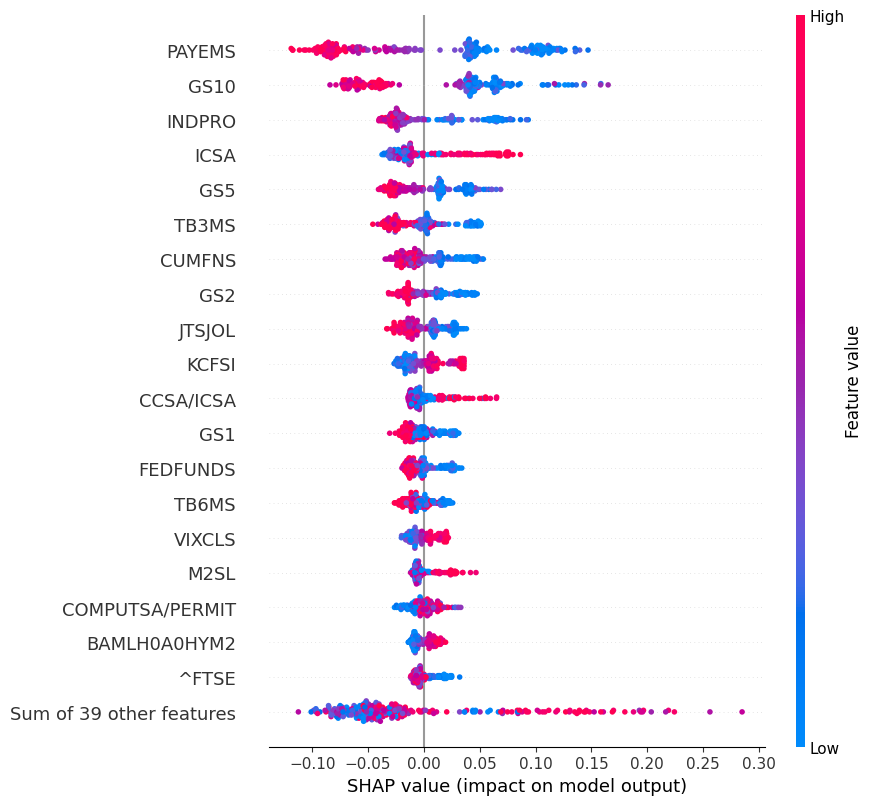


Beeswarm — Regime 1


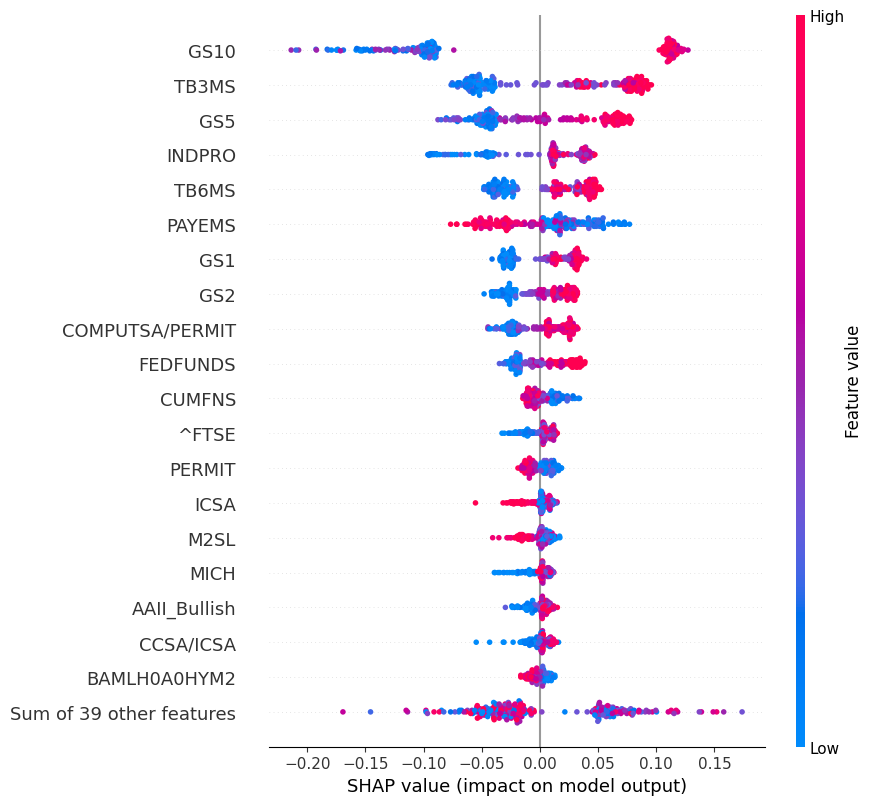


Beeswarm — Regime 2


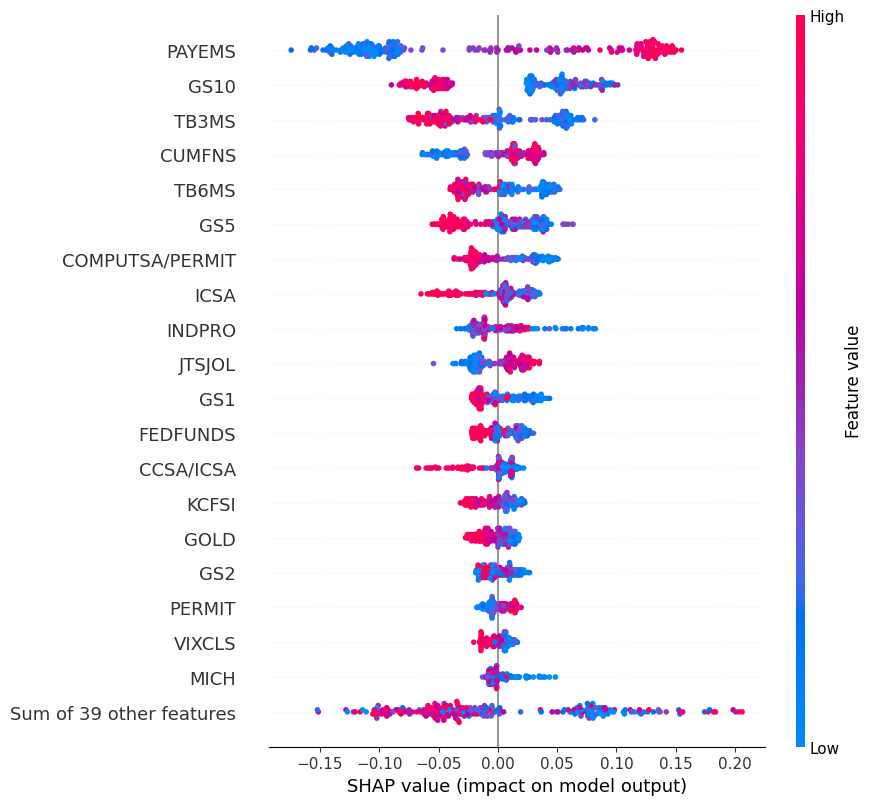

In [34]:
# SHAP Beeswarm (per-regime)
regime_names = {0: 'Regime 0', 1: 'Regime 1', 2: 'Regime 2'}
explainer = shap.TreeExplainer(base_rf)
shap_explanation = explainer(X)

# Beeswarm for each regime separately
for class_idx in range(len(np.unique(y))):
    print(f"\nBeeswarm — {regime_names.get(class_idx, f'Regime {class_idx}')}")
    shap.plots.beeswarm(shap_explanation[:, :, class_idx], max_display=20, show=True)


Waterfall — Regime 0 at 2010-04-01


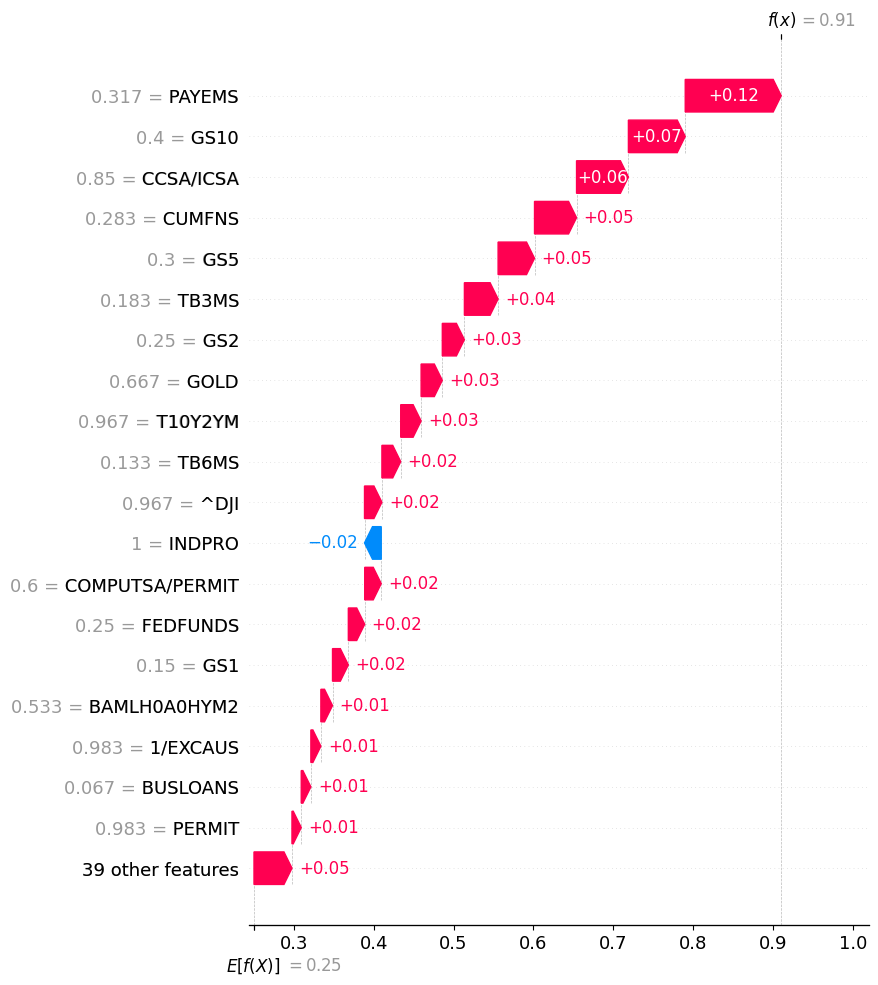


Waterfall — Regime 1 at 2022-09-01


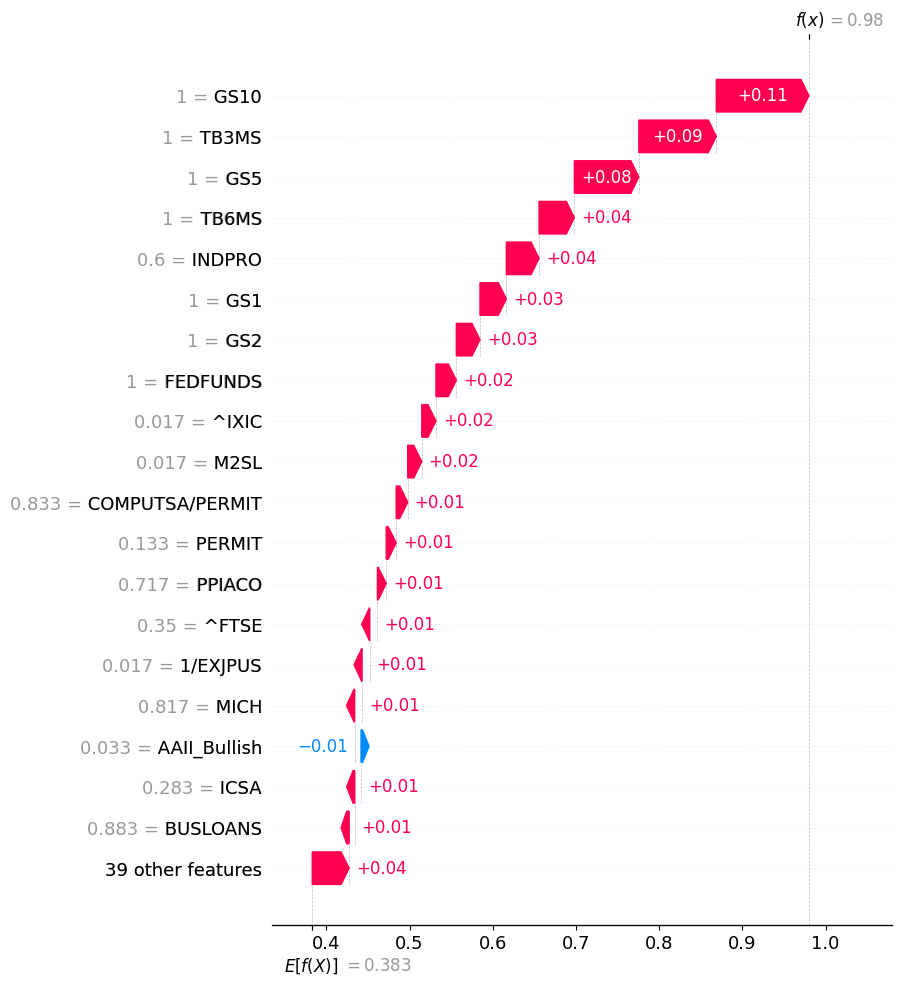


Waterfall — Regime 2 at 2014-02-01


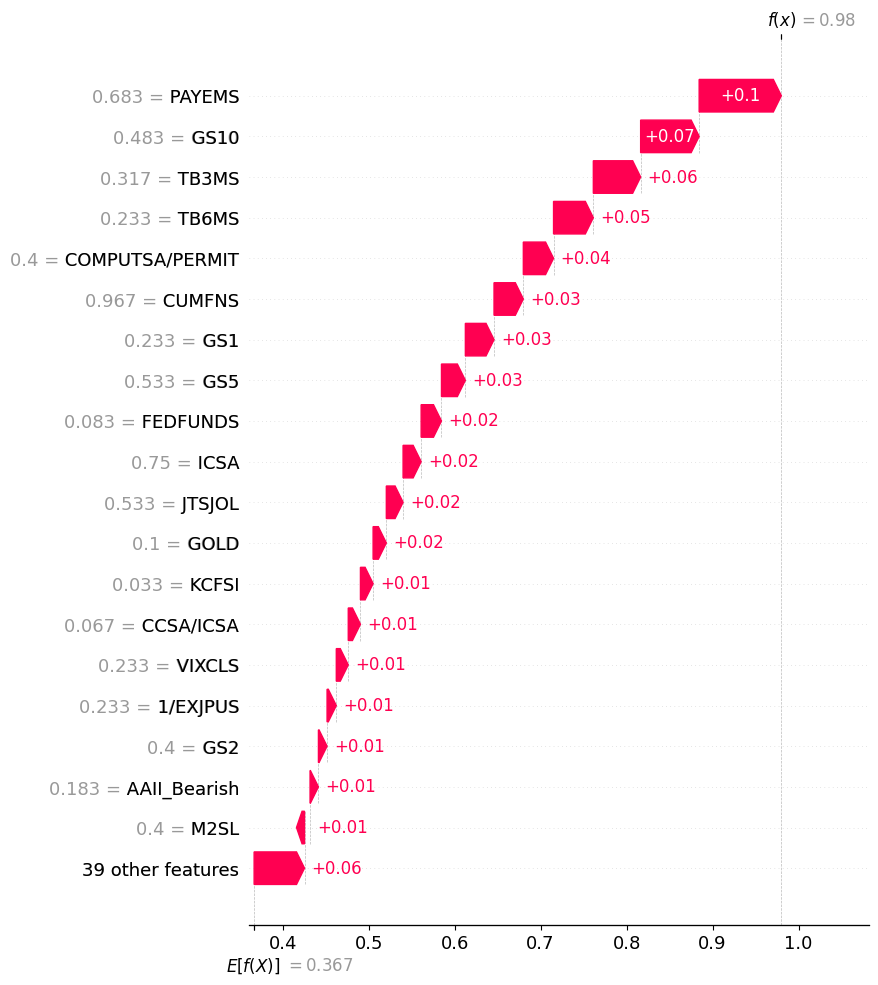

In [35]:
# Waterfall for a representative month in each regime
for class_idx in range(len(np.unique(y))):
    regime_indices = np.where(y == class_idx)[0]
    if len(regime_indices) == 0:
        print(f"No months in Regime {class_idx}, skipping.")
        continue

    # Pick the middle month of that regime as a representative sample
    sample_idx   = regime_indices[len(regime_indices) // 2]
    display_date = X.index[sample_idx].date()
    print(f"\nWaterfall — Regime {class_idx} at {display_date}")

    shap.plots.waterfall(
        shap.Explanation(
            values = shap_explanation.values[sample_idx, :, class_idx],
            base_values = explainer.expected_value[class_idx],
            data = X.iloc[sample_idx],
            feature_names = X.columns.tolist()
        ),
        max_display=20,
        show=True
    )

## 12. Dimensionality Reduction via Proxy Variables

We now train a Random Forest Regressor targeting the NSS-reconstructed yields. Using the resulting mean (global) absolute SHAP values, we construct proxy variables for each of the categories in Section 1. We compare this method of dimensionality reduction to other techniques such as Principal Component Analysis (PCA).

In [36]:
from sklearn.ensemble import RandomForestRegressor

# 1. Define Category Mapping
categories = {
    'Output':           ['INDPRO', 'CUMFNS'],
    'Consumer':         ['RPI'],
    'Labour':           ['PAYEMS', 'JTSJOL', 'ICSA', 'CCSA/ICSA'],   # PAYEMS was missing
    'Housing':          ['PERMIT', 'COMPUTSA/PERMIT'],
    'Liquidity_Credit': ['BUSLOANS', 'M2SL', 'FEDFUNDS'],
    'Inflation':        ['CPIAUCSL', 'PPIACO', 'MICH'],
    'Bond_Market':      ['TB3MS', 'TB6MS', 'GS1', 'GS2', 'GS5', 'GS10', 'BAMLH0A0HYM2', 'T10Y2YM'],
    'FX_Market':        ['Extended_TWEXBGSMTH', '1/EXSZUS', '1/EXJPUS', 'EXUSUK', 'ECU_EUR_USD', '1/EXCAUS'],
    'Commodity':        ['WPU012202', 'WPU0121', 'GOLD', 'WTISPLC', 'WPUSI019011', 'PNGASUSUSDM'],
    'Stock_Market':     ['^GSPC', '^IXIC', '^DJI', '^N225', '^FCHI', '^AEX', '^BFX', '^GSPTSE', '^HSI', '^FTSE', '^GDAXI'],
    'Sentiment':        ['USACSCICP02STSAM', 'UMCSENT', 'AAII_Bullish', 'AAII_Bearish', 'KCFSI'],  # fixed names
    'Uncertainty':      ['GPR', 'GPRT', 'GPRA', 'USEPUINDXD', 'EPUMONETARY', 'EPUTRADE', 'VIXCLS']
}

# Flatten
all_features = [f for cat in categories.values() for f in cat]
available_features = [f for f in all_features if f in data_q.columns]
missing = set(all_features) - set(available_features)
if missing:
    print(f"Warning: {len(missing)} features not found in data_q and will be skipped: {sorted(missing)}")

In [37]:
# Train Random Forest Regressor on available features
X_train = data_q.loc[common_idx, available_features]
y_train = yields_svensson.loc[common_idx]

print(f"Training RF on {X_train.shape[1]} features, {X_train.shape[0]} months...")
rfr = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rfr.fit(X_train, y_train)

Training RF on 58 features, 235 months...


RandomForestRegressor(n_jobs=-1, random_state=42)

In [38]:
# Proxy Variable Construction

# MDI feature importance
# importance_scores = pd.Series(rfr.feature_importances_, index=available_features)

# SHAP feature importance
explainer    = shap.TreeExplainer(rfr)
shap_values  = explainer(X_train)
# Mean absolute SHAP across months and output dimensions (13 maturities)
mean_abs_shap = np.abs(shap_values.values).mean(axis=(0, 2))
importance_scores = pd.Series(mean_abs_shap, index=available_features)

# Construct Proxy Variables
data_pv = pd.DataFrame(index=data_q.index)

for cat_name, feat_list in categories.items():
    valid_feats = [f for f in feat_list if f in importance_scores.index]
    if not valid_feats:
        print(f"Warning: '{cat_name}' has no available features — skipping.")
        continue

    cat_importances = importance_scores[valid_feats]
    cat_weight_sum  = cat_importances.sum()

    if cat_weight_sum > 0:
        weights = cat_importances / cat_weight_sum
        data_pv[cat_name] = (data_q[valid_feats] * weights).sum(axis=1)
    else:
        print(f"Warning: '{cat_name}' has all-zero importances — falling back to equal weighting.")
        data_pv[cat_name] = data_q[valid_feats].mean(axis=1)

print(f"\nProxy variables constructed: {data_pv.shape[1]} categories × {data_pv.shape[0]} months")
print(data_pv.columns.tolist())


Proxy variables constructed: 12 categories × 235 months
['Output', 'Consumer', 'Labour', 'Housing', 'Liquidity_Credit', 'Inflation', 'Bond_Market', 'FX_Market', 'Commodity', 'Stock_Market', 'Sentiment', 'Uncertainty']


In [39]:
# Random Forest Classifier on Proxy Variables
X_pv = data_pv.loc[common_idx]
y_target = regime_labels

pv_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
pv_rf.fit(X_pv, y_target)

RandomForestClassifier(n_jobs=-1, random_state=42)

### 12.0. Benchmark against PCA

In [40]:
# Random Forest Classifier after PCA
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier

# Initialize PCA to keep 12 components (to match the 12 PVs)
pca = PCA(n_components=12)

# Fit and transform the original quantile-standardized data
X_pca = pca.fit_transform(X_train)

print(f"PCA complete. Explained variance ratio (top 12): {pca.explained_variance_ratio_.sum():.2%}")

# Train Random Forest on PCA Components
# Predicting the same Bayesian Tree regime_labels
X_pca_df = pd.DataFrame(X_pca, index=common_idx, columns=[f'PC{i+1}' for i in range(12)])
pca_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
pca_rf.fit(X_pca_df, y_target)

PCA complete. Explained variance ratio (top 12): 84.30%


RandomForestClassifier(n_jobs=-1, random_state=42)

In [41]:
# Predictions from all four sources
pred_tree   = regime_labels # Bayesian tree (ground truth)
pred_base_rf = base_rf.predict(data_q.loc[common_idx]) # RF on all ~60 variables
pred_pv_rf  = pv_rf.predict(X_pv) # RF on 12 proxy variables
pred_pca_rf = pca_rf.predict(X_pca_df) # RF on 12 principal components

print("Regime agreement vs. Bayesian tree:")
print(f"  RF (all variables):        {(pred_tree == pred_base_rf).mean():.1%}")
print(f"  RF (proxy variables):      {(pred_tree == pred_pv_rf).mean():.1%}")
print(f"  RF (principal components): {(pred_tree == pred_pca_rf).mean():.1%}")

Regime agreement vs. Bayesian tree:
  RF (all variables):        100.0%
  RF (proxy variables):      100.0%
  RF (principal components): 100.0%


Damn, I was hoping for PCA to be worse...

In [42]:
# Get predicted probabilities instead of hard labels
probs_pv  = pv_rf.predict_proba(X_pv)
probs_pca = pca_rf.predict_proba(X_pca_df)

# One-hot encode the actual labels to calculate Mean Squared Error
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)
y_true_oh = encoder.fit_transform(y_target.reshape(-1, 1))

# Calculate Squared Error Loss for each time point
loss_pv = np.mean((probs_pv - y_true_oh)**2, axis=1)
loss_pca = np.mean((probs_pca - y_true_oh)**2, axis=1)

print(f"Mean Brier Score (PV):  {loss_pv.mean():.6f}")
print(f"Mean Brier Score (PCA): {loss_pca.mean():.6f}")

Mean Brier Score (PV):  0.001783
Mean Brier Score (PCA): 0.006266


In [43]:
try:
    from arch.bootstrap import MCS
except ImportError:
    !pip install arch
    from arch.bootstrap import MCS

losses_df = pd.DataFrame({
    'PV_RF': loss_pv,
    'PCA_RF': loss_pca
}, index=common_idx)

np.random.seed(42)
mcs = MCS(losses_df, size=0.10, method='max', reps=1000)
mcs.compute()

print("\n--- MCS Results ---")
print(mcs.pvalues)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.3/981.3 kB 42.1 MB/s eta 0:00:00

--- MCS Results ---
            Pvalue
Model name        
PCA_RF         0.0
PV_RF          1.0


Easy, the Proxy-Variable Random Forest is better. Although, one more thing I can try is to implement Random Matrix Theory (RMT) on top of PCA to clean the covariance matrix before training the Random Forest. One problem with this approach arises from the fact that RMT cleaning via the Marchenko-Pastur distribution is unsupervised. It filters based on variance magnitude, not predictive utility. It is therefore possible for RMT to clean away quiet variables that may have been genuine leading indicators for a recession.

### 12.1. Benchmark Against RMT-PCA

The Marchenko-Pastur (MP) law gives the theoretical eigenvalue bulk for a pure-noise $(T×p)$ random matrix:
$$ \lambda_{\pm} = \sigma^2 \left(1 \pm \sqrt{\frac{p}{T}}\right)$$

Eigenvalues below $\lambda_{+}$ are indistinguishable from noise. We therefore replace them with their cross-sectional mean so as to preserve the trace of the noise block, while leaving signal eigenvalues ($\lambda > \lambda_{+}$) untouched. The cleaned matrix is then used as the input covariance for PCA.

T = 235 months, p = 58 features, q = p/T = 0.2468

Marchenko-Pastur λ- = 0.2532, λ+ = 2.2404
Signal eigenvalues (λ > λ+) : 5
Noise eigenvalues (λ ≤ λ+) : 53


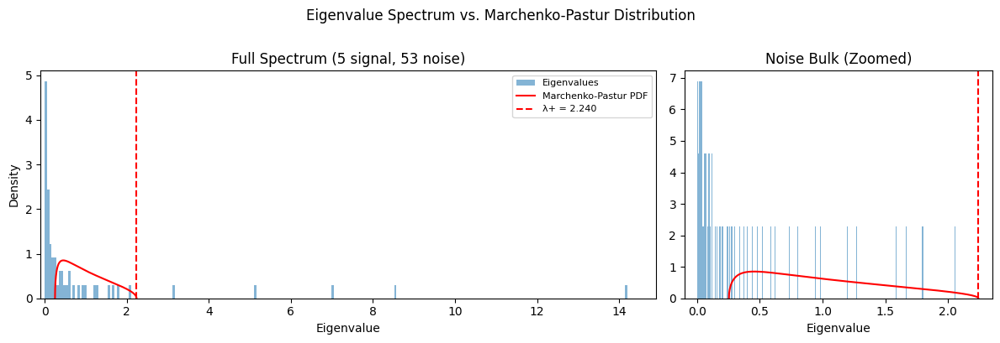


Noise eigenvalue mean: 0.377187
Trace before cleaning: 58.0000
Trace after cleaning: 58.0000

Variance explained by top 12 components:
Standard PCA: 84.30%
RMT-cleaned PCA: 70.09%

Per-component explained variance:
      Standard PCA (%)  RMT-PCA (%)
PC1              22.76        24.47
PC2              18.76        14.70
PC3              11.70        12.09
PC4               8.65         8.87
PC5               5.11         5.41
PC6               3.29         0.65
PC7               2.99         0.65
PC8               2.76         0.65
PC9               2.51         0.65
PC10              2.11         0.65
PC11              2.02         0.65
PC12              1.63         0.65


In [44]:
from sklearn.preprocessing import StandardScaler
import matplotlib.gridspec as gridspec
scaler = StandardScaler()
X_std = scaler.fit_transform(X_train) # zero-mean, unit-variance

T, p = X_std.shape
q = p / T
print(f"T = {T} months, p = {p} features, q = p/T = {q:.4f}")

# Sample correlation matrix
C = (X_std.T @ X_std) / T

# Eigendecomposition
eigenvalues, eigenvectors = np.linalg.eigh(C)

# Marchenko-Pastur bounds
sigma2 = 1.0
lambda_plus = sigma2 * (1 + np.sqrt(q)) ** 2 # noise ceiling
lambda_minus = sigma2 * (1 - np.sqrt(q)) ** 2 # noise floor

noise_mask = eigenvalues <= lambda_plus
n_noise = noise_mask.sum()
n_signal = len(eigenvalues) - n_noise

print(f"\nMarchenko-Pastur λ- = {lambda_minus:.4f}, λ+ = {lambda_plus:.4f}")
print(f"Signal eigenvalues (λ > λ+) : {n_signal}")
print(f"Noise eigenvalues (λ ≤ λ+) : {n_noise}")

# Visualisation
mp_x = np.linspace(max(lambda_minus, 1e-9), lambda_plus, 1000)
mp_pdf = np.sqrt((lambda_plus - mp_x) * (mp_x - lambda_minus)) / (2 * np.pi * sigma2 * q * mp_x)

fig = plt.figure(figsize=(12, 4))
gs = gridspec.GridSpec(1, 2, width_ratios=[2, 1])

ax0 = fig.add_subplot(gs[0])
ax0.hist(eigenvalues, bins=250, density=True, alpha=0.55, label='Eigenvalues')
ax0.plot(mp_x, mp_pdf, color='red', label='Marchenko-Pastur PDF')
ax0.axvline(lambda_plus,  color='red',  linestyle='--', label=f'λ+ = {lambda_plus:.3f}')
ax0.set_xlim(left=-0.1)
ax0.set_xlabel('Eigenvalue')
ax0.set_ylabel('Density')
ax0.set_title(f'Full Spectrum ({n_signal} signal, {n_noise} noise)')
ax0.legend(fontsize=8)

# Zoom into bulk
ax1 = fig.add_subplot(gs[1])
bulk_mask = eigenvalues <= lambda_plus * 1.1
ax1.hist(eigenvalues[bulk_mask], bins=250, density=True, alpha=0.55, label='Eigenvalues in bulk')
ax1.plot(mp_x, mp_pdf, color='red', label='Marchenko-Pastur PDF')
ax1.axvline(lambda_plus,  color='red',  linestyle='--', label=f'λ+ = {lambda_plus:.3f}')
ax1.set_xlim(left=-0.1)
ax1.set_xlabel('Eigenvalue')
ax1.set_title('Noise Bulk (Zoomed)')

plt.suptitle('Eigenvalue Spectrum vs. Marchenko-Pastur Distribution', y=1.01)
plt.tight_layout()
plt.show()

# Clean the covariance matrix
# Replace all noise eigenvalues with their mean to preserve the noise-block trace.
# Signal eigenvalues are left untouched.
noise_mean = eigenvalues[noise_mask].mean()
eigenvalues_clean = eigenvalues.copy()
eigenvalues_clean[noise_mask] = noise_mean

print(f"\nNoise eigenvalue mean: {noise_mean:.6f}")
print(f"Trace before cleaning: {eigenvalues.sum():.4f}")
print(f"Trace after cleaning: {eigenvalues_clean.sum():.4f}")

# Reconstruct cleaned correlation matrix
C_clean = eigenvectors @ np.diag(eigenvalues_clean) @ eigenvectors.T
C_clean = (C_clean + C_clean.T) / 2 # enforce symmetry

# PCA on the cleaned covariance
# We keep 12 components to match pv_rf and pca_rf
N_COMPONENTS_RMT = 12

# Sort eigenvectors by descending cleaned eigenvalue
idx_d = np.argsort(eigenvalues_clean)[::-1]
eigenvalues_d  = eigenvalues_clean[idx_d]
eigenvectors_d  = eigenvectors[:, idx_d]

W_rmt = eigenvectors_d[:, :N_COMPONENTS_RMT]
X_rmt = X_std @ W_rmt

X_rmt_pca_df = pd.DataFrame(X_rmt, index = common_idx, columns = [f'RMT_PC{i+1}' for i in range(N_COMPONENTS_RMT)])
rmt_var_explained = eigenvalues_d[:N_COMPONENTS_RMT] / eigenvalues_d.sum()
std_var_explained = pca.explained_variance_ratio_[:N_COMPONENTS_RMT]

print(f"\nVariance explained by top {N_COMPONENTS_RMT} components:")
print(f"Standard PCA: {std_var_explained.sum():.2%}")
print(f"RMT-cleaned PCA: {rmt_var_explained.sum():.2%}")

# Per-component comparison
comp_df = pd.DataFrame({'Standard PCA (%)' : std_var_explained * 100, 'RMT-PCA (%)' : rmt_var_explained * 100}, index=[f'PC{i+1}' for i in range(N_COMPONENTS_RMT)])
print("\nPer-component explained variance:")
print(comp_df.round(2).to_string())

In [45]:
# Train Random Forest on RMT-PCA components
rmt_pca_rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rmt_pca_rf.fit(X_rmt_pca_df, y_target)

pred_rmt_pca_rf = rmt_pca_rf.predict(X_rmt_pca_df)
agreement = (pred_tree == pred_rmt_pca_rf).mean()
print(f"\nRMT-PCA RF agreement with Bayesian tree labels: {agreement:.1%}")

# Brier scores (all three models)
probs_rmt_pca = rmt_pca_rf.predict_proba(X_rmt_pca_df)

try:
    y_true_oh
except NameError:
    enc = OneHotEncoder(sparse_output=False)
    y_true_oh = enc.fit_transform(y_target.reshape(-1, 1))

loss_rmt_pca = np.mean((probs_rmt_pca - y_true_oh) ** 2, axis=1)

print("\nMean Brier Scores:")
print(f"  PV-RF:      {loss_pv.mean():.6f}")
print(f"  PCA-RF:     {loss_pca.mean():.6f}")
print(f"  RMT-PCA-RF: {loss_rmt_pca.mean():.6f}")

# Model Confidence Set (all three)
try:
    from arch.bootstrap import MCS
except ImportError:
    !pip install arch -q
    from arch.bootstrap import MCS

losses_df = pd.DataFrame({
    'PV_RF': loss_pv,
    'PCA_RF': loss_pca,
    'RMT_PCA_RF': loss_rmt_pca,
}, index=common_idx)

np.random.seed(42)
mcs = MCS(losses_df, size=0.10, method='max', reps=1000)
mcs.compute()

print("\nModel Confidence Set:")
print(mcs.pvalues.sort_values('Pvalue', ascending=False).to_string())


RMT-PCA RF agreement with Bayesian tree labels: 100.0%

Mean Brier Scores:
  PV-RF:      0.001783
  PCA-RF:     0.006266
  RMT-PCA-RF: 0.007028

Model Confidence Set:
            Pvalue
Model name        
PV_RF          1.0
PCA_RF         0.0
RMT_PCA_RF     0.0


The Proxy-Variable Random Forest (PV-RF) Classifier predicts the Bayesian tree regimes as accurately as the baseline Random Forest trained on the full feature set. This result validates our dimensionality reduction framework.

The objective of constructing Proxy Variables (PVs) was to compress ~60 noisy input variables into 12 economically meaningful categories. The success of the PV-RF model suggests that the proxy representation preserves essentially all of the information relevant for regime classification.

This also supports the interpretation that the identified regimes reflect true underlying economic structure rather than being statistical artifacts driven by a small subset of individual variables.

However, because these results are currently evaluated in-sample, agreement between the models is not, by itself, sufficient evidence of robustness. A more meaningful assessment requires out-of-sample (OOS) evaluation.

## 13. Out-of-Sample Proxy-Variable Random Forest Regime Classification

In [46]:
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder

In [47]:
def sort_by_beta0(labels, index, svensson_params):
    """
    Relabels regimes canonically so that:
      0 = lowest mean BETA0 (lowest yield level)
      1 = moderate mean BETA0 (moderate yield leel)
      2 = highest mean BETA0 (highest yield level)
    Works for any number of regimes found by the local tree
    """
    beta0 = svensson_params.loc[index, 'BETA0']
    mean_beta0 = {label: beta0.values[labels == label].mean() for label in np.unique(labels)}
    sorted_regimes = sorted(mean_beta0, key=mean_beta0.get)  # ascending beta0
    mapping = {old: new for new, old in enumerate(sorted_regimes)}

    return np.vectorize(mapping.get)(labels)

In [48]:
def sort_by_spread(labels, index, yields_df):
    """
    Relabels regimes canonically based on the 10Y-2Y spread so that:
      0 = lowest mean 10Y-2Y slope (most inverted/flattest curve)
      1 = moderate mean 10Y-2Y slope (normal curve)
      2 = highest mean 10Y-2Y slope (steepest curve)
    Works for any number of regimes found by the local tree
    """
    # Adjust 'Y120M' and 'Y24M' if your yield columns use a different naming string
    spread = yields_df.loc[index, 'Y120M'] - yields_df.loc[index, 'Y24M']

    # Compute the arithmetic mean slope for each unique regime present
    mean_spread = {label: spread.values[labels == label].mean() for label in np.unique(labels)}

    # Sort the dictionary keys (regime labels) by their values in ascending order using lambda
    sorted_regimes = sorted(mean_spread.keys(), key=lambda label: mean_spread[label])

    # Create an old-to-new mapping array where index positions reflect the new order
    mapping = {old: new for new, old in enumerate(sorted_regimes)}

    # Broad-apply the structural map across the full NumPy labels array
    return np.vectorize(mapping.get)(labels)

### 13.0. Full-Sample Canonical Ground Truth

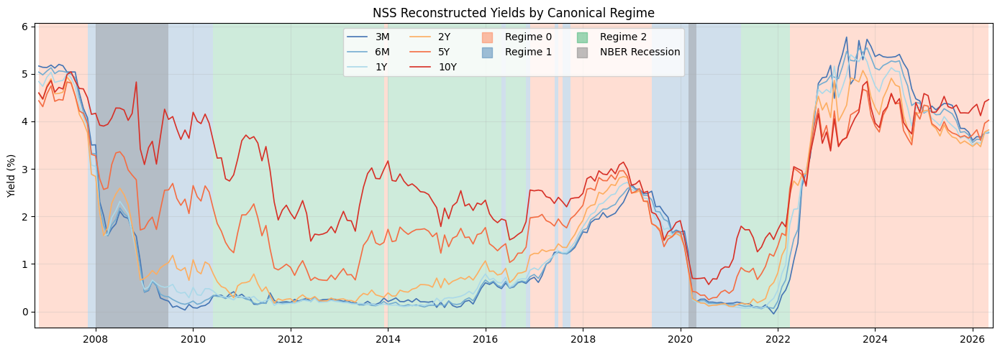

In [49]:
regime_labels_canonical = sort_by_spread(regime_labels, common_idx, yields_svensson)
regime_series_canonical = pd.Series(regime_labels_canonical, index=common_idx)

'''
# Verify canonical ordering is working
regime_labels_canonical = sort_by_beta0(regime_labels, common_idx, svensson_monthly)

beta0 = svensson_monthly.loc[common_idx, 'BETA0']
for r in sorted(np.unique(regime_labels_canonical)):
    mean_b0 = beta0.values[regime_labels_canonical == r].mean()
    n = (regime_labels_canonical == r).sum()
    print(f"Regime {r}: mean BETA0 = {mean_b0:.4f}  ({n} months)")
'''

# Maturities to plot (must match yields_svensson column names exactly)
plot_maturities = {
    'Y3M': '3M',
    'Y6M': '6M',
    'Y12M': '1Y',
    'Y24M': '2Y',
    'Y60M': '5Y',
    'Y120M': '10Y',
}
line_colors = ['#4575b4', '#74add1', '#abd9e9', '#fdae61', '#f46d43', '#d73027']

fig, ax = plt.subplots(figsize=(14, 5))
regime_colors = {0: 'coral', 1: 'steelblue', 2: 'mediumseagreen'}

# Yield curve lines
for (col, label), lc in zip(plot_maturities.items(), line_colors):
    ax.plot(common_idx, yields_svensson.loc[common_idx, col], color=lc, lw=1.2, label=label, zorder=3)

# Regime background shading (same contiguous-block logic as macro plots)
for label in np.unique(regime_labels_canonical):
    mask = (regime_series_canonical == label).values

    # Find contiguous blocks
    in_block, block_start = False, None
    for i, date in enumerate(common_idx):
        if mask[i] and not in_block:
            in_block, block_start = True, date
        # If this month does not belong to the current regime and we were in a block, the block just ended
        elif not mask[i] and in_block:
            in_block = False
            ax.axvspan(block_start, date, alpha=0.25, color=regime_colors[label], lw=0, zorder=0)
    # Close any open block at the end of the sample
    if in_block:
        ax.axvspan(block_start, common_idx[-1], alpha=0.25, color=regime_colors[label], lw=0, zorder=0)

# Shade NBER recessions
in_recession = False
rec_start = None
for date, val in recession.iterrows():
    if val['USREC'] == 1 and not in_recession:
        in_recession, rec_start = True, date
    elif val['USREC'] == 0 and in_recession:
        in_recession = False
        ax.axvspan(rec_start, date, alpha=0.35, color='grey', lw=0, zorder=1)
# Close any open recession at end of sample
if in_recession:
    ax.axvspan(rec_start, recession.index[-1], alpha=0.35, color='grey', lw=0, zorder=1)

ax.set_xlim(common_idx.min() - pd.DateOffset(months=1), common_idx.max() + pd.DateOffset(months=1))
ax.set_ylabel('Yield (%)')
ax.set_title('NSS Reconstructed Yields by Canonical Regime')

# Legend
for label in np.unique(regime_labels_canonical):
    ax.scatter([], [], color=regime_colors[label], alpha=0.5, label=f'Regime {label}', s=100, marker='s')
ax.scatter([], [], color='grey', alpha=0.5, label='NBER Recession', s=100, marker='s')
ax.legend(loc='best', ncol=4)
ax.grid(True, alpha=0.25)

plt.tight_layout()
plt.show()

### 13.1. Local Canonical Ground Truth

In [50]:
min_training_years = 5
first_test_year = (common_idx.min() + pd.DateOffset(years=min_training_years)).year
last_test_year = common_idx.max().year
gap_months = 1

print("=" * 70)
print("PRE-COMPUTING EVALUATION TREES")
print("=" * 70)

eval_ground_truth = {}  # test_year → y_test_true (canonical labels for test months)

for test_year in range(first_test_year, last_test_year + 1):
    test_start = pd.Timestamp(f'{test_year}-01-01')
    test_end = pd.Timestamp(f'{test_year}-12-01')

    eval_idx = common_idx[common_idx <= test_end]
    test_idx = common_idx[(common_idx >= test_start) & (common_idx <= test_end)]

    if len(test_idx) == 0:
        continue

    print(f"\n[{test_year}] Growing evaluation tree ({len(eval_idx)} months)...")
    eval_labels, _ = grow_tree(
        data_q = data_q.loc[eval_idx],
        target_data = yields_svensson.loc[eval_idx].values,
        thresholds = thresholds,
        min_obs = min_regime_months,
        max_regimes = max_regimes
    )

    if len(np.unique(eval_labels)) < max_regimes:
        print(f"Warning: only found {len(np.unique(eval_labels))} regimes — fold will be skipped in all loops.")
        continue

    eval_labels_canonical = sort_by_spread(eval_labels, eval_idx, yields_svensson)
    test_mask = eval_idx >= test_start
    eval_ground_truth[test_year] = eval_labels_canonical[test_mask]
    print(f"  Done. Regime distribution: { {r: (eval_labels_canonical[test_mask] == r).sum() for r in np.unique(eval_labels_canonical[test_mask])} }")

print(f"\nEvaluation trees pre-computed for {len(eval_ground_truth)} years.")

PRE-COMPUTING EVALUATION TREES

[2011] Growing evaluation tree (62 months)...

── Split 1: Searching across 1 leaf node(s) × 58 variables × 4 thresholds ──

  Top 5 candidates for Leaf 0:
    BUSLOANS             threshold = 0.6 | log ML = -1018.2117
    CCSA/ICSA            threshold = 0.6 | log ML = -1020.5831
    PERMIT               threshold = 0.6 | log ML = -1094.9459
    TB3MS                threshold = 0.2 | log ML = -1114.5779
    BUSLOANS             threshold = 0.4 | log ML = -1128.7946

Split 1 applied:   Leaf 0 split on BUSLOANS at 0.6
    Regime 0: 38 months
    Regime 1: 24 months

── Split 2: Searching across 2 leaf node(s) × 58 variables × 4 thresholds ──

Leaf 0: too small to split (38 observations), skipping.

Leaf 1: too small to split (24 observations), skipping.

No valid split found anywhere. Stopping.

[2012] Growing evaluation tree (74 months)...

── Split 1: Searching across 1 leaf node(s) × 58 variables × 4 thresholds ──

  Top 5 candidates for Leaf 0:
    PE

### 13.2. Actual OOS Classification now

In [51]:
results_oos = []

print("\n" + "=" * 70)
print("EXPANDING WINDOW OOS VALIDATION — RECURSIVE CANONICAL PV-RF")
print("=" * 70)

shap_history = []

for test_year in range(first_test_year, last_test_year + 1):
    # Define periods
    test_start = pd.Timestamp(f'{test_year}-01-01')
    test_end = pd.Timestamp(f'{test_year}-12-01')
    gap_month = test_start - pd.DateOffset(months=1)
    train_end = test_start - pd.DateOffset(months=gap_months+1)
    train_start = common_idx.min()

    train_idx = common_idx[(common_idx >= train_start) & (common_idx <= train_end)]
    test_idx = common_idx[(common_idx >= test_start) & (common_idx <= test_end)]

    if len(test_idx) == 0:
        print(f"\n[{test_year}] No test data, skipping.")
        continue
    if len(train_idx) < min_training_years * 12:
        print(f"\n[{test_year}] Insufficient training data ({len(train_idx)} months), skipping.")
        continue

    print(f"\n[Test Year {test_year}]")
    print(f"  Train: {train_idx[0].date()} → {train_idx[-1].date()} ({len(train_idx)} months)")
    print(f"  Gap: {gap_month.date()}")
    print(f"  Test: {test_idx[0].date()} → {test_idx[-1].date()} ({len(test_idx)} months)")

    # Step 1: Local tree on training data only
    train_data_q = data_q.loc[train_idx]
    train_target = yields_svensson.loc[train_idx].values

    print("\nGrowing local tree...")
    local_labels, local_splits = grow_tree(
        data_q = train_data_q,
        target_data = train_target,
        thresholds = thresholds,
        min_obs = min_regime_months,
        max_regimes = max_regimes
    )

    # Verify the local tree produced the expected number of regimes
    n_local_regimes = len(np.unique(local_labels))
    if n_local_regimes < max_regimes:
        print(f"  Warning: local tree only found {n_local_regimes}/{max_regimes} regimes — skipping fold.")
        continue

    # Sort by mean spread on training period
    local_labels_canonical = sort_by_spread(local_labels, train_idx, yields_svensson)

    # Step 2: Recompute SHAP weights and construct PVs
    X_train_fold = data_q.loc[train_idx, available_features]
    y_yields_train = yields_svensson.loc[train_idx]

    rfr_fold = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    rfr_fold.fit(X_train_fold, y_yields_train)

    expl_fold = shap.TreeExplainer(rfr_fold)
    shap_fold = expl_fold(X_train_fold)
    mean_shap_fold = np.abs(shap_fold.values).mean(axis=(0, 2))
    imp_fold = pd.Series(mean_shap_fold, index=available_features)
    shap_history.append(imp_fold.rename(test_year))

    pv_fold = pd.DataFrame(index=data_q.index)
    for cat_name, feat_list in categories.items():
        valid_feats = [f for f in feat_list if f in imp_fold.index]
        if not valid_feats:
            continue
        cat_imp = imp_fold[valid_feats]
        cat_sum = cat_imp.sum()
        weights = cat_imp / cat_sum if cat_sum > 0 else pd.Series(1/len(valid_feats), index=valid_feats)
        pv_fold[cat_name] = (data_q[valid_feats] * weights).sum(axis=1)

    X_pv_train = pv_fold.loc[train_idx]
    X_pv_test = pv_fold.loc[test_idx]

    # Train PV-RF on local canonical labels
    pv_rf_fold = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    pv_rf_fold.fit(X_pv_train, local_labels_canonical)

    # Step 3: Predict on test period
    pred_regimes = pv_rf_fold.predict(X_pv_test)
    pred_probs = pv_rf_fold.predict_proba(X_pv_test)

    # Step 4: Ground truth from pre-computed evaluation tree
    if test_year not in eval_ground_truth:
        print(f"  No evaluation tree for {test_year} — skipping.")
        continue
    y_test_true = eval_ground_truth[test_year]

    # Guard: if test contains a regime the local tree never saw, Brier is undefined
    unseen = set(np.unique(y_test_true)) - set(np.unique(local_labels_canonical))
    if unseen:
        print(f"  Warning: regime(s) {unseen} in test period not seen during training.")

    acc = accuracy_score(y_test_true, pred_regimes)

    # Brier score: use fixed 3-class encoder to ensure consistent column ordering
    encoder_fold = OneHotEncoder(sparse_output=False, categories=[sorted(np.unique(regime_labels_canonical))])
    y_test_oh = encoder_fold.fit_transform(y_test_true.reshape(-1, 1))

    # Map pred_probs columns (local class ordering) to global 3-class ordering
    local_classes = pv_rf_fold.classes_
    global_classes = sorted(np.unique(regime_labels_canonical))
    pred_probs_aligned = np.zeros((len(test_idx), len(global_classes)))
    for local_idx, cls in enumerate(local_classes):
        global_idx = global_classes.index(cls)
        pred_probs_aligned[:, global_idx] = pred_probs[:, local_idx]

    brier_monthly = np.mean((pred_probs_aligned - y_test_oh) ** 2, axis=1)

    print(f"\n  OOS Accuracy:    {acc:.2%}")
    print(f"  OOS Brier Score: {brier_monthly.mean():.6f}")

    for i, date in enumerate(test_idx):
        results_oos.append({
            'date': date,
            'test_year': test_year,
            'true_regime': y_test_true[i],
            'pred_regime': pred_regimes[i],
            'correct': int(y_test_true[i] == pred_regimes[i]),
            'brier': brier_monthly[i],
        })

# Aggregate results
results_oos_df = pd.DataFrame(results_oos).set_index('date')
print("\n" + "=" * 70)
print(f"TOTAL OOS MONTHS:        {len(results_oos_df)}")
print(f"OVERALL OOS ACCURACY:    {results_oos_df['correct'].mean():.2%}")
print(f"OVERALL OOS BRIER SCORE: {results_oos_df['brier'].mean():.6f}")
print("=" * 70)
print("\nPer-Year Breakdown:")
print(results_oos_df.groupby('test_year')[['correct', 'brier']].mean().round(4).to_string())


EXPANDING WINDOW OOS VALIDATION — RECURSIVE CANONICAL PV-RF

[2011] Insufficient training data (49 months), skipping.

[Test Year 2012]
  Train: 2006-11-01 → 2011-11-01 (61 months)
  Gap: 2011-12-01
  Test: 2012-01-01 → 2012-12-01 (12 months)

Growing local tree...

── Split 1: Searching across 1 leaf node(s) × 58 variables × 4 thresholds ──

  Top 5 candidates for Leaf 0:
    CCSA/ICSA            threshold = 0.6 | log ML = -1008.4664
    PERMIT               threshold = 0.6 | log ML = -1085.5260
    BUSLOANS             threshold = 0.4 | log ML = -1097.5934
    TB3MS                threshold = 0.2 | log ML = -1099.9739
    PERMIT               threshold = 0.4 | log ML = -1134.4521

Split 1 applied:   Leaf 0 split on CCSA/ICSA at 0.6
    Regime 0: 29 months
    Regime 1: 32 months

── Split 2: Searching across 2 leaf node(s) × 58 variables × 4 thresholds ──

Leaf 0: too small to split (29 observations), skipping.

Leaf 1: too small to split (32 observations), skipping.

No valid split

In [52]:
eval_truth_series = results_oos_df['true_regime']
pred_series = results_oos_df['pred_regime']
oos_dates = eval_truth_series.index.sort_values()

true_positives = []
false_negatives = []
false_positives = []
actual_transitions = []

for date in oos_dates:
    prev_date = date - pd.DateOffset(months=1)
    # Skip if we don't have the previous month's evaluation label
    if prev_date not in eval_truth_series.index:
        continue

    true_current = eval_truth_series.loc[date]
    true_prev = eval_truth_series.loc[prev_date]
    pred_current = pred_series.loc[date]
    pred_prev = pred_series.loc[prev_date]

    true_transition = (true_current != true_prev)
    predicted_transition = (pred_current != pred_prev)

    if true_transition and predicted_transition:
        # Model flagged a transition that happened
        true_positives.append({
            'date': date,
            'from_regime': true_prev,
            'to_regime': true_current,
            'from_pred_regime': pred_prev,
            'to_pred_regime': pred_current,
            'correctly_classified': (pred_current == true_current)
        })
        actual_transitions.append(date)

    elif true_transition and not predicted_transition:
        # Model did not flag a transition that happened
        false_negatives.append({
            'date': date,
            'from_regime': true_prev,
            'to_regime': true_current,
            'pred_regime': pred_current
        })
        actual_transitions.append(date)

    elif not true_transition and predicted_transition:
        # Model flagged a transition that didn't happen
        false_positives.append({
            'date': date,
            'true_regime': true_current,
            'from_pred_regime': pred_prev,
            'to_pred_regime': pred_current
        })

true_positives_df = pd.DataFrame(true_positives).set_index('date') if true_positives else pd.DataFrame()
false_negatives_df = pd.DataFrame(false_negatives).set_index('date') if false_negatives else pd.DataFrame()
false_positives_df = pd.DataFrame(false_positives).set_index('date') if false_positives else pd.DataFrame()

n_tp = len(true_positives_df)
n_fn = len(false_negatives_df)
n_fp = len(false_positives_df)
n_cc = int(true_positives_df['correctly_classified'].sum()) if not true_positives_df.empty else 0

recall = n_tp / (n_tp + n_fn) if (n_tp + n_fn) > 0 else float('nan') # of all real transitions, how many real transitions did the model detect?
precision = n_tp / (n_tp + n_fp) if (n_tp + n_fp) > 0 else float('nan') # of all detected transitions, how many real transitions did the model detect?
correct_given_detected = n_cc / n_tp if n_tp > 0 else float('nan') # of all real, detected transitions, how many were correctly classified?
correct = n_cc / (n_tp + n_fn) if (n_tp + n_fn) > 0 else float('nan') # of all real transitions, how many were correctly classified?

non_trans_acc = results_oos_df.loc[~results_oos_df.index.isin(actual_transitions), 'correct'].mean()

print("=" * 60)
print("REGIME TRANSITION ANALYSIS")
print("=" * 60)
print(f"Total OOS months:                                       {len(oos_dates)}")
print(f"Actual transition months:                               {n_tp+n_fn}")
print(f"")
print(f"True Positives (detected):                              {n_tp}  ({recall:.1%} recall)")
print(f"False Negatives (missed):                               {n_fn}  ({1-recall:.1%} miss rate)")
print(f"False Positives (false alarm):                          {n_fp}  (precision = {precision:.1%})")
print(f"")
print(f"Of all real detected transitions, correctly classified: {n_cc}/{n_tp} ({correct_given_detected:.1%})")
print(f"Of all real transitions, correctly classified:          {n_cc}/{n_tp+n_fn} ({correct:.1%})")
print(f"")
print(f"Non-transition accuracy:                                {non_trans_acc:.1%}")

if not true_positives_df.empty:
    print(f"\nTrue Positives:")
    display_cols = ['from_regime', 'to_regime', 'from_pred_regime', 'to_pred_regime', 'correctly_classified']
    print(true_positives_df[display_cols].to_string())

if not false_negatives_df.empty:
    print(f"\nFalse Negatives (missed transitions):")
    print(false_negatives_df.to_string())

if not false_positives_df.empty:
    print(f"\nFalse Positives (false alarms):")
    print(false_positives_df.to_string())

REGIME TRANSITION ANALYSIS
Total OOS months:                                       137
Actual transition months:                               22

True Positives (detected):                              11  (50.0% recall)
False Negatives (missed):                               11  (50.0% miss rate)
False Positives (false alarm):                          8  (precision = 57.9%)

Of all real detected transitions, correctly classified: 6/11 (54.5%)
Of all real transitions, correctly classified:          6/22 (27.3%)

Non-transition accuracy:                                79.1%

True Positives:
            from_regime  to_regime  from_pred_regime  to_pred_regime  correctly_classified
date                                                                                      
2016-01-01            1          0                 1               0                  True
2016-09-01            0          2                 0               1                 False
2017-01-01            0          2    

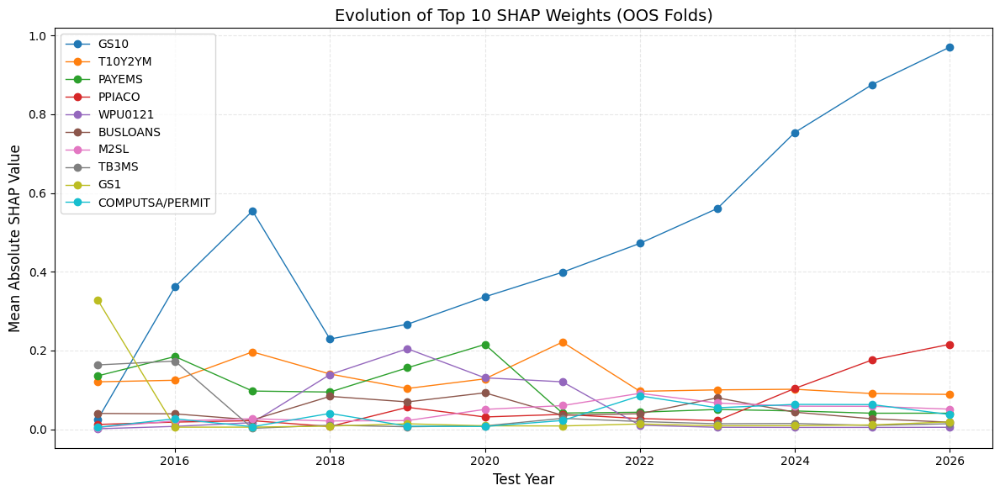

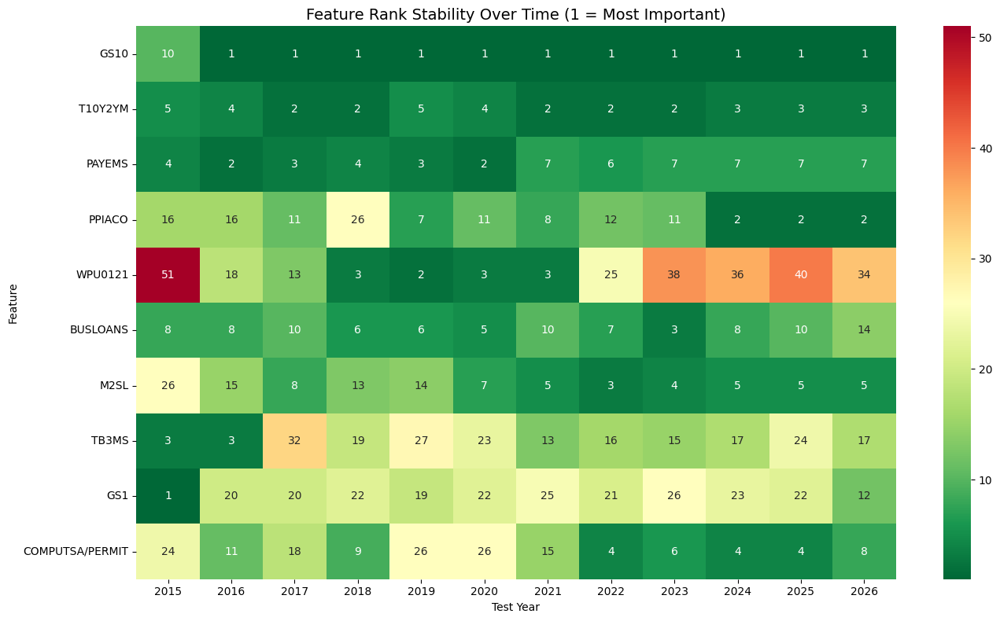

Average Rank Correlation between folds: 0.8264


In [53]:
# SHAP Weights Stability Analysis

# Convert list of Series into a DataFrame: Years as Index, Features as Columns
shap_stability_df = pd.concat(shap_history, axis=1).T

# Select the Top N features based on average importance for better visualization
top_n = 10
avg_importance = shap_stability_df.mean().sort_values(ascending=False)
top_features = avg_importance.head(top_n).index
plot_df = shap_stability_df[top_features]

# 1. Importance Trends
plt.figure(figsize=(12, 6))
for col in plot_df.columns:
    plt.plot(plot_df.index, plot_df[col], marker='o', label=col, linewidth=1)

plt.title(f"Evolution of Top {top_n} SHAP Weights (OOS Folds)", fontsize=14)
plt.xlabel("Test Year", fontsize=12)
plt.ylabel("Mean Absolute SHAP Value", fontsize=12)
plt.legend(loc='best')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Rank Stability Heatmap
rank_df = shap_stability_df.rank(axis=1, ascending=False)

plt.figure(figsize=(14, 8))
sns.heatmap(rank_df[top_features].T, annot=True, cmap="RdYlGn_r", fmt=".0f")
plt.title("Feature Rank Stability Over Time (1 = Most Important)", fontsize=14)
plt.xlabel("Test Year")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# 3. Numerical Stability Metric
# Calculate Spearman Rank Correlation between consecutive folds
corrs = []
for i in range(len(shap_stability_df) - 1):
    c = shap_stability_df.iloc[i].corr(shap_stability_df.iloc[i+1], method='spearman')
    corrs.append(c)

avg_stability = np.mean(corrs)
print(f"Average Rank Correlation between folds: {avg_stability:.4f}")

Some comments - written on May 20, 2026:
- OOS accuracy (76.64%) and Brier score (0.120243) are pretty good.
- OOS results for 2016-2018 and 2022 are pretty bad, possibly due to a lot of sudden policy changes. I have no idea if that's true, I did not study economics. However, this probably means that my "ground truth" Bayesian tree model is inaccurate too around these years (I see lots of regime flip flopping), which means that the accuracy rates for these years don't really mean anything anyway.
- The model knew that the regime was changing 71.4% of the time, but only correctly classified the new regime 52.4% of the time. Personally, I think that's pretty good; etter than random.
- The model's non-transition accuracy is higher at 81%, which makes sense.
- The GS10 importance is suspiciously high. I want to make sure my model isn't just learning to classify regimes based on the 10-year rate alone.
- SHAP weights are fairly stable, which means the model is actually identifying persistent structure.

Initially, I wanted to evaluate the out-of-sample PV-RF predictions against regime labels generated by the full-sample Bayesian tree. Before you comment, "Isn't that data leakage?" No, it's not. I'm only using the full-sample labels as an evaluation benchmark. They play no role in training the algorithm.

"Why would you even want to do that? That's stupid!" Well, think about this: NBER recession dates are determined retrospectively. A valuable regime classifier should ideally detect recessionary conditions in real time, without waiting for official confirmation. In this sense, you can think of the full-sample regime labels as a more detailed analogue of NBER recession dates.

For example, consider a model trained using data available only through 2015. This model might correctly identify a recession in 2016, even if NBER does not officially classify that period as a recession until 2017. If the model were evaluated against contemporaneously available NBER recession labels, the model would appear inaccurate despite having detected the regime transition earlier than the official benchmark. This doesn't constitute look-ahead bias; rather, it indicates genuine predictive ability.

Similarly, my PV-RF model trained on data through 2015 may correctly classify 2016 observations into regimes that are only confirmed by the full-sample tree, but not by a tree grown using data available up to 2016. As a result, benchmarking my model against the full-sample labels may be a stronger test of predictive ability than benchmarking against contemporaneous labels. Let's try it!

In [54]:
results_oos = []

print("\n" + "=" * 70)
print("EXPANDING WINDOW OOS VALIDATION — RECURSIVE CANONICAL PV-RF")
print("=" * 70)

shap_history = []

for test_year in range(first_test_year, last_test_year + 1):
    # Define periods
    test_start = pd.Timestamp(f'{test_year}-01-01')
    test_end = pd.Timestamp(f'{test_year}-12-01')
    gap_month = test_start - pd.DateOffset(months=1)
    train_end = test_start - pd.DateOffset(months=gap_months+1)
    train_start = common_idx.min()

    train_idx = common_idx[(common_idx >= train_start) & (common_idx <= train_end)]
    test_idx = common_idx[(common_idx >= test_start) & (common_idx <= test_end)]

    if len(test_idx) == 0:
        print(f"\n[{test_year}] No test data, skipping.")
        continue
    if len(train_idx) < min_training_years * 12:
        print(f"\n[{test_year}] Insufficient training data ({len(train_idx)} months), skipping.")
        continue

    print(f"\n[Test Year {test_year}]")
    print(f"  Train: {train_idx[0].date()} → {train_idx[-1].date()} ({len(train_idx)} months)")
    print(f"  Gap: {gap_month.date()}")
    print(f"  Test: {test_idx[0].date()} → {test_idx[-1].date()} ({len(test_idx)} months)")

    # Step 1: Local tree on training data only
    train_data_q = data_q.loc[train_idx]
    train_target = yields_svensson.loc[train_idx].values

    print("\nGrowing local tree...")
    local_labels, local_splits = grow_tree(
        data_q = train_data_q,
        target_data = train_target,
        thresholds = thresholds,
        min_obs = min_regime_months,
        max_regimes = max_regimes
    )

    # Verify the local tree produced the expected number of regimes
    n_local_regimes = len(np.unique(local_labels))
    if n_local_regimes < max_regimes:
        print(f"  Warning: local tree only found {n_local_regimes}/{max_regimes} regimes — skipping fold.")
        continue

    # Sort by mean spread on training period
    local_labels_canonical = sort_by_spread(local_labels, train_idx, yields_svensson)

    # Step 2: Recompute SHAP weights and construct PVs
    X_train_fold = data_q.loc[train_idx, available_features]
    y_yields_train = yields_svensson.loc[train_idx]

    rfr_fold = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    rfr_fold.fit(X_train_fold, y_yields_train)

    expl_fold = shap.TreeExplainer(rfr_fold)
    shap_fold = expl_fold(X_train_fold)
    mean_shap_fold = np.abs(shap_fold.values).mean(axis=(0, 2))
    imp_fold = pd.Series(mean_shap_fold, index=available_features)
    shap_history.append(imp_fold.rename(test_year))

    pv_fold = pd.DataFrame(index=data_q.index)
    for cat_name, feat_list in categories.items():
        valid_feats = [f for f in feat_list if f in imp_fold.index]
        if not valid_feats:
            continue
        cat_imp = imp_fold[valid_feats]
        cat_sum = cat_imp.sum()
        weights = cat_imp / cat_sum if cat_sum > 0 else pd.Series(1/len(valid_feats), index=valid_feats)
        pv_fold[cat_name] = (data_q[valid_feats] * weights).sum(axis=1)

    X_pv_train = pv_fold.loc[train_idx]
    X_pv_test = pv_fold.loc[test_idx]

    # Train PV-RF on local canonical labels
    pv_rf_fold = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    pv_rf_fold.fit(X_pv_train, local_labels_canonical)

    # Step 3: Predict on test period
    pred_regimes = pv_rf_fold.predict(X_pv_test)
    pred_probs = pv_rf_fold.predict_proba(X_pv_test)

    # Step 4: Ground truth = full-sample canonical labels for test months
    y_test_true = regime_series_canonical.loc[test_idx].values

    # Guard: if test contains a regime the local tree never saw, Brier is undefined
    unseen = set(np.unique(y_test_true)) - set(np.unique(local_labels_canonical))
    if unseen:
        print(f"  Warning: regime(s) {unseen} in test period not seen during training.")

    acc = accuracy_score(y_test_true, pred_regimes)

    # Brier score
    global_classes = sorted(np.unique(regime_labels_canonical))
    encoder_fold = OneHotEncoder(sparse_output=False, categories=[global_classes])
    y_test_oh = encoder_fold.fit_transform(y_test_true.reshape(-1, 1))

    local_classes = pv_rf_fold.classes_
    pred_probs_aligned = np.zeros((len(test_idx), len(global_classes)))
    for local_idx, cls in enumerate(local_classes):
        pred_probs_aligned[:, global_classes.index(cls)] = pred_probs[:, local_idx]

    brier_monthly = np.mean((pred_probs_aligned - y_test_oh) ** 2, axis=1)

    print(f"\n  OOS Accuracy:    {acc:.2%}")
    print(f"  OOS Brier Score: {brier_monthly.mean():.6f}")

    for i, date in enumerate(test_idx):
        results_oos.append({
            'date': date,
            'test_year': test_year,
            'true_regime': y_test_true[i],
            'pred_regime': pred_regimes[i],
            'correct': int(y_test_true[i] == pred_regimes[i]),
            'brier': brier_monthly[i],
        })

# Aggregate results
results_oos_df = pd.DataFrame(results_oos).set_index('date')
print("\n" + "=" * 70)
print(f"TOTAL OOS MONTHS:        {len(results_oos_df)}")
print(f"OVERALL OOS ACCURACY:    {results_oos_df['correct'].mean():.2%}")
print(f"OVERALL OOS BRIER SCORE: {results_oos_df['brier'].mean():.6f}")
print("=" * 70)
print("\nPer-Year Breakdown:")
print(results_oos_df.groupby('test_year')[['correct', 'brier']].mean().round(4).to_string())


EXPANDING WINDOW OOS VALIDATION — RECURSIVE CANONICAL PV-RF

[2011] Insufficient training data (49 months), skipping.

[Test Year 2012]
  Train: 2006-11-01 → 2011-11-01 (61 months)
  Gap: 2011-12-01
  Test: 2012-01-01 → 2012-12-01 (12 months)

Growing local tree...

── Split 1: Searching across 1 leaf node(s) × 58 variables × 4 thresholds ──

  Top 5 candidates for Leaf 0:
    CCSA/ICSA            threshold = 0.6 | log ML = -1008.4664
    PERMIT               threshold = 0.6 | log ML = -1085.5260
    BUSLOANS             threshold = 0.4 | log ML = -1097.5934
    TB3MS                threshold = 0.2 | log ML = -1099.9739
    PERMIT               threshold = 0.4 | log ML = -1134.4521

Split 1 applied:   Leaf 0 split on CCSA/ICSA at 0.6
    Regime 0: 29 months
    Regime 1: 32 months

── Split 2: Searching across 2 leaf node(s) × 58 variables × 4 thresholds ──

Leaf 0: too small to split (29 observations), skipping.

Leaf 1: too small to split (32 observations), skipping.

No valid split

In [55]:
eval_truth_series = results_oos_df['true_regime']
pred_series = results_oos_df['pred_regime']
oos_dates = eval_truth_series.index.sort_values()

true_positives = []
false_negatives = []
false_positives = []
actual_transitions = []

for date in oos_dates:
    prev_date = date - pd.DateOffset(months=1)
    # Skip if we don't have the previous month's evaluation label
    if prev_date not in eval_truth_series.index:
        continue

    true_current = eval_truth_series.loc[date]
    true_prev = eval_truth_series.loc[prev_date]
    pred_current = pred_series.loc[date]
    pred_prev = pred_series.loc[prev_date]

    true_transition = (true_current != true_prev)
    predicted_transition = (pred_current != pred_prev)

    if true_transition and predicted_transition:
        # Model flagged a transition that happened
        true_positives.append({
            'date': date,
            'from_regime': true_prev,
            'to_regime': true_current,
            'from_pred_regime': pred_prev,
            'to_pred_regime': pred_current,
            'correctly_classified': (pred_current == true_current)
        })
        actual_transitions.append(date)

    elif true_transition and not predicted_transition:
        # Model did not flag a transition that happened
        false_negatives.append({
            'date': date,
            'from_regime': true_prev,
            'to_regime': true_current,
            'pred_regime': pred_current
        })
        actual_transitions.append(date)

    elif not true_transition and predicted_transition:
        # Model flagged a transition that didn't happen
        false_positives.append({
            'date': date,
            'true_regime': true_current,
            'from_pred_regime': pred_prev,
            'to_pred_regime': pred_current
        })

true_positives_df = pd.DataFrame(true_positives).set_index('date') if true_positives else pd.DataFrame()
false_negatives_df = pd.DataFrame(false_negatives).set_index('date') if false_negatives else pd.DataFrame()
false_positives_df = pd.DataFrame(false_positives).set_index('date') if false_positives else pd.DataFrame()

n_tp = len(true_positives_df)
n_fn = len(false_negatives_df)
n_fp = len(false_positives_df)
n_cc = int(true_positives_df['correctly_classified'].sum()) if not true_positives_df.empty else 0

recall = n_tp / (n_tp + n_fn) if (n_tp + n_fn) > 0 else float('nan') # of all real transitions, how many real transitions did the model detect?
precision = n_tp / (n_tp + n_fp) if (n_tp + n_fp) > 0 else float('nan') # of all detected transitions, how many real transitions did the model detect?
correct_given_detected = n_cc / n_tp if n_tp > 0 else float('nan') # of all real, detected transitions, how many were correctly classified?
correct = n_cc / (n_tp + n_fn) if (n_tp + n_fn) > 0 else float('nan') # of all real transitions, how many were correctly classified?

non_trans_acc = results_oos_df.loc[~results_oos_df.index.isin(actual_transitions), 'correct'].mean()

print("=" * 60)
print("REGIME TRANSITION ANALYSIS")
print("=" * 60)
print(f"Total OOS months:                                       {len(oos_dates)}")
print(f"Actual transition months:                               {n_tp+n_fn}")
print(f"")
print(f"True Positives (detected):                              {n_tp}  ({recall:.1%} recall)")
print(f"False Negatives (missed):                               {n_fn}  ({1-recall:.1%} miss rate)")
print(f"False Positives (false alarm):                          {n_fp}  (precision = {precision:.1%})")
print(f"")
print(f"Of all real detected transitions, correctly classified: {n_cc}/{n_tp} ({correct_given_detected:.1%})")
print(f"Of all real transitions, correctly classified:          {n_cc}/{n_tp+n_fn} ({correct:.1%})")
print(f"")
print(f"Non-transition accuracy:                                {non_trans_acc:.1%}")

if not true_positives_df.empty:
    print(f"\nTrue Positives:")
    display_cols = ['from_regime', 'to_regime', 'from_pred_regime', 'to_pred_regime', 'correctly_classified']
    print(true_positives_df[display_cols].to_string())

if not false_negatives_df.empty:
    print(f"\nFalse Negatives (missed transitions):")
    print(false_negatives_df.to_string())

if not false_positives_df.empty:
    print(f"\nFalse Positives (false alarms):")
    print(false_positives_df.to_string())

REGIME TRANSITION ANALYSIS
Total OOS months:                                       137
Actual transition months:                               11

True Positives (detected):                              2  (18.2% recall)
False Negatives (missed):                               9  (81.8% miss rate)
False Positives (false alarm):                          17  (precision = 10.5%)

Of all real detected transitions, correctly classified: 1/2 (50.0%)
Of all real transitions, correctly classified:          1/11 (9.1%)

Non-transition accuracy:                                62.7%

True Positives:
            from_regime  to_regime  from_pred_regime  to_pred_regime  correctly_classified
date                                                                                      
2017-08-01            0          1                 0               2                 False
2021-04-01            1          2                 1               2                  True

False Negatives (missed transitions):
  

Ok... not that good, but that's to be expected when benchmarking against full-sample regime labels. The full-sample Bayesian tree was grown on the entire historical record, which includes the post-2021 rate hiking cycle. As a result, its regime boundaries are calibrated to yield curve dynamics that a model trained on data through 2020 could not have observed. Thus, when a model trained using only pre-2021 information predicts "Regime 1" for a 2016 observation, it is being unfairly evaluated against a regime definition shaped by events that occurred years later. This is why the recursive evaluation tree, grown only on contemporaneously available, produces a fairer and more interpretable benchmark.

A remaining concern is that the model's strong predictive power may be artificially inflated by the inclusion of Treasury yields in the feature set. Since the Bayesian tree's splitting criterion is the marginal likelihood of NSS-reconstructed yields, any feature that closely proxies the yield curve level will have an inherent advantage in regime classification. This circularity is reflected in the SHAP analysis, where GS10 consistently receives disproportionately large importance weights relative to broader macroeconomic indicators. Consequently, the strong out-of-sample performance may not necessarily indicate genuine macroeconomic interpretation; instead, the model may simply be classifying regimes using GS10 yield levels.

A useful robustness check would be to conduct an out-of-sample evaluation using a restricted feature set that excludes the bond market category from the proxy variables. Removing these features would reveal whether other macroeconomic signals, such as labour market or inflation proxies, can meaningfully recover the regime structure. I expect this restriction to reduce classification accuracy and worsen the Brier score. However, if performance remains near 60% accuracy, it would provide stronger evidence of a genuine lead–lag relationship, where broader macroeconomic conditions help drive yield curve regimes.

In [56]:
results_oos = []

print("\n" + "=" * 70)
print("EXPANDING WINDOW OOS VALIDATION — RECURSIVE CANONICAL PV-RF W/O BOND MARKET")
print("=" * 70)

shap_history = []

for test_year in range(first_test_year, last_test_year + 1):
    # Define periods
    test_start = pd.Timestamp(f'{test_year}-01-01')
    test_end = pd.Timestamp(f'{test_year}-12-01')
    gap_month = test_start - pd.DateOffset(months=1)
    train_end = test_start - pd.DateOffset(months=gap_months+1)
    train_start = common_idx.min()

    train_idx = common_idx[(common_idx >= train_start) & (common_idx <= train_end)]
    test_idx = common_idx[(common_idx >= test_start)  & (common_idx <= test_end)]

    if len(test_idx) == 0:
        print(f"\n[{test_year}] No test data, skipping.")
        continue
    if len(train_idx) < min_training_years * 12:
        print(f"\n[{test_year}] Insufficient training data ({len(train_idx)} months), skipping.")
        continue

    print(f"\n[Test Year {test_year}]")
    print(f"  Train: {train_idx[0].date()} → {train_idx[-1].date()} ({len(train_idx)} months)")
    print(f"  Gap: {gap_month.date()}")
    print(f"  Test: {test_idx[0].date()} → {test_idx[-1].date()} ({len(test_idx)} months)")

    # Step 1: Local tree on training data only
    # Create a cleaned feature list by excluding the bond market variables
    clean_features = [f for f in available_features if f not in bond_cols]

    train_data_q = data_q.loc[train_idx, clean_features]
    train_target = yields_svensson.loc[train_idx].values

    print("\nGrowing local tree...")
    local_labels, local_splits = grow_tree(
        data_q = train_data_q,
        target_data = train_target,
        thresholds = thresholds,
        min_obs = min_regime_months,
        max_regimes = max_regimes
    )

    # Verify the local tree produced the expected number of regimes
    n_local_regimes = len(np.unique(local_labels))
    if n_local_regimes < max_regimes:
        print(f"  Warning: local tree only found {n_local_regimes}/{max_regimes} regimes — skipping fold.")
        continue

    # Sort by mean spread on training period
    local_labels_canonical = sort_by_spread(local_labels, train_idx, yields_svensson)

    # Step 2: Recompute SHAP weights and construct PVs
    X_train_fold = data_q.loc[train_idx, clean_features]
    y_yields_train = yields_svensson.loc[train_idx]

    rfr_fold = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    rfr_fold.fit(X_train_fold, y_yields_train)

    expl_fold = shap.TreeExplainer(rfr_fold)
    shap_fold = expl_fold(X_train_fold)
    mean_shap_fold = np.abs(shap_fold.values).mean(axis=(0, 2))
    imp_fold = pd.Series(mean_shap_fold, index=clean_features)
    shap_history.append(imp_fold.rename(test_year))

    pv_fold = pd.DataFrame(index=data_q.index)
    for cat_name, feat_list in categories.items():
        valid_feats = [f for f in feat_list if f in imp_fold.index]
        if not valid_feats:
            continue
        cat_imp = imp_fold[valid_feats]
        cat_sum = cat_imp.sum()
        weights = cat_imp / cat_sum if cat_sum > 0 else pd.Series(1/len(valid_feats), index=valid_feats)
        pv_fold[cat_name] = (data_q[valid_feats] * weights).sum(axis=1)

    X_pv_train = pv_fold.loc[train_idx]
    X_pv_test = pv_fold.loc[test_idx]

    # Train PV-RF on local canonical labels
    pv_rf_fold = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    pv_rf_fold.fit(X_pv_train, local_labels_canonical)

    # Step 3: Predict on test period
    pred_regimes = pv_rf_fold.predict(X_pv_test)
    pred_probs = pv_rf_fold.predict_proba(X_pv_test)

    # Step 4: Ground truth from pre-computed evaluation tree
    if test_year not in eval_ground_truth:
        print(f"  No evaluation tree for {test_year} — skipping.")
        continue
    y_test_true = eval_ground_truth[test_year]

    # Guard: if test contains a regime the local tree never saw, Brier is undefined
    unseen = set(np.unique(y_test_true)) - set(np.unique(local_labels_canonical))
    if unseen:
        print(f"  Warning: regime(s) {unseen} in test period not seen during training.")

    acc = accuracy_score(y_test_true, pred_regimes)

    # Brier score: use fixed 3-class encoder to ensure consistent column ordering
    encoder_fold = OneHotEncoder(sparse_output=False, categories=[sorted(np.unique(regime_labels_canonical))])
    y_test_oh = encoder_fold.fit_transform(y_test_true.reshape(-1, 1))

    # Map pred_probs columns (local class ordering) to global 3-class ordering
    local_classes = pv_rf_fold.classes_
    global_classes = sorted(np.unique(regime_labels_canonical))
    pred_probs_aligned = np.zeros((len(test_idx), len(global_classes)))
    for local_idx, cls in enumerate(local_classes):
        global_idx = global_classes.index(cls)
        pred_probs_aligned[:, global_idx] = pred_probs[:, local_idx]

    brier_monthly = np.mean((pred_probs_aligned - y_test_oh) ** 2, axis=1)

    print(f"\n  OOS Accuracy:    {acc:.2%}")
    print(f"  OOS Brier Score: {brier_monthly.mean():.6f}")

    for i, date in enumerate(test_idx):
        results_oos.append({
            'date': date,
            'test_year': test_year,
            'true_regime': y_test_true[i],
            'pred_regime': pred_regimes[i],
            'correct': int(y_test_true[i] == pred_regimes[i]),
            'brier': brier_monthly[i],
        })

# Aggregate results
results_oos_df = pd.DataFrame(results_oos).set_index('date')
print("\n" + "=" * 70)
print(f"TOTAL OOS MONTHS:        {len(results_oos_df)}")
print(f"OVERALL OOS ACCURACY:    {results_oos_df['correct'].mean():.2%}")
print(f"OVERALL OOS BRIER SCORE: {results_oos_df['brier'].mean():.6f}")
print("=" * 70)
print("\nPer-Year Breakdown:")
print(results_oos_df.groupby('test_year')[['correct', 'brier']].mean().round(4).to_string())


EXPANDING WINDOW OOS VALIDATION — RECURSIVE CANONICAL PV-RF W/O BOND MARKET

[2011] Insufficient training data (49 months), skipping.

[Test Year 2012]
  Train: 2006-11-01 → 2011-11-01 (61 months)
  Gap: 2011-12-01
  Test: 2012-01-01 → 2012-12-01 (12 months)

Growing local tree...

── Split 1: Searching across 1 leaf node(s) × 50 variables × 4 thresholds ──

  Top 5 candidates for Leaf 0:
    CCSA/ICSA            threshold = 0.6 | log ML = -1008.4664
    PERMIT               threshold = 0.6 | log ML = -1085.5260
    BUSLOANS             threshold = 0.4 | log ML = -1097.5934
    PERMIT               threshold = 0.4 | log ML = -1134.4521
    COMPUTSA/PERMIT      threshold = 0.8 | log ML = -1187.3268

Split 1 applied:   Leaf 0 split on CCSA/ICSA at 0.6
    Regime 0: 29 months
    Regime 1: 32 months

── Split 2: Searching across 2 leaf node(s) × 50 variables × 4 thresholds ──

Leaf 0: too small to split (29 observations), skipping.

Leaf 1: too small to split (32 observations), skipping.

In [57]:
eval_truth_series = results_oos_df['true_regime']
pred_series = results_oos_df['pred_regime']
oos_dates = eval_truth_series.index.sort_values()

true_positives = []
false_negatives = []
false_positives = []
actual_transitions = []

for date in oos_dates:
    prev_date = date - pd.DateOffset(months=1)
    # Skip if we don't have the previous month's evaluation label
    if prev_date not in eval_truth_series.index:
        continue

    true_current = eval_truth_series.loc[date]
    true_prev = eval_truth_series.loc[prev_date]
    pred_current = pred_series.loc[date]
    pred_prev = pred_series.loc[prev_date]

    true_transition = (true_current != true_prev)
    predicted_transition = (pred_current != pred_prev)

    if true_transition and predicted_transition:
        # Model flagged a transition that happened
        true_positives.append({
            'date': date,
            'from_regime': true_prev,
            'to_regime': true_current,
            'from_pred_regime': pred_prev,
            'to_pred_regime': pred_current,
            'correctly_classified': (pred_current == true_current)
        })
        actual_transitions.append(date)

    elif true_transition and not predicted_transition:
        # Model did not flag a transition that happened
        false_negatives.append({
            'date': date,
            'from_regime': true_prev,
            'to_regime': true_current,
            'pred_regime': pred_current
        })
        actual_transitions.append(date)

    elif not true_transition and predicted_transition:
        # Model flagged a transition that didn't happen
        false_positives.append({
            'date': date,
            'true_regime': true_current,
            'from_pred_regime': pred_prev,
            'to_pred_regime': pred_current
        })

true_positives_df = pd.DataFrame(true_positives).set_index('date') if true_positives else pd.DataFrame()
false_negatives_df = pd.DataFrame(false_negatives).set_index('date') if false_negatives else pd.DataFrame()
false_positives_df = pd.DataFrame(false_positives).set_index('date') if false_positives else pd.DataFrame()

n_tp = len(true_positives_df)
n_fn = len(false_negatives_df)
n_fp = len(false_positives_df)
n_cc = int(true_positives_df['correctly_classified'].sum()) if not true_positives_df.empty else 0

recall = n_tp / (n_tp + n_fn) if (n_tp + n_fn) > 0 else float('nan') # of all real transitions, how many real transitions did the model detect?
precision = n_tp / (n_tp + n_fp) if (n_tp + n_fp) > 0 else float('nan') # of all detected transitions, how many real transitions did the model detect?
correct_given_detected = n_cc / n_tp if n_tp > 0 else float('nan') # of all real, detected transitions, how many were correctly classified?
correct = n_cc / (n_tp + n_fn) if (n_tp + n_fn) > 0 else float('nan') # of all real transitions, how many were correctly classified?

non_trans_acc = results_oos_df.loc[~results_oos_df.index.isin(actual_transitions), 'correct'].mean()

print("=" * 60)
print("REGIME TRANSITION ANALYSIS")
print("=" * 60)
print(f"Total OOS months:                                       {len(oos_dates)}")
print(f"Actual transition months:                               {n_tp+n_fn}")
print(f"")
print(f"True Positives (detected):                              {n_tp}  ({recall:.1%} recall)")
print(f"False Negatives (missed):                               {n_fn}  ({1-recall:.1%} miss rate)")
print(f"False Positives (false alarm):                          {n_fp}  (precision = {precision:.1%})")
print(f"")
print(f"Of all real detected transitions, correctly classified: {n_cc}/{n_tp} ({correct_given_detected:.1%})")
print(f"Of all real transitions, correctly classified:          {n_cc}/{n_tp+n_fn} ({correct:.1%})")
print(f"")
print(f"Non-transition accuracy:                                {non_trans_acc:.1%}")

if not true_positives_df.empty:
    print(f"\nTrue Positives:")
    display_cols = ['from_regime', 'to_regime', 'from_pred_regime', 'to_pred_regime', 'correctly_classified']
    print(true_positives_df[display_cols].to_string())

if not false_negatives_df.empty:
    print(f"\nFalse Negatives (missed transitions):")
    print(false_negatives_df.to_string())

if not false_positives_df.empty:
    print(f"\nFalse Positives (false alarms):")
    print(false_positives_df.to_string())

REGIME TRANSITION ANALYSIS
Total OOS months:                                       137
Actual transition months:                               22

True Positives (detected):                              7  (31.8% recall)
False Negatives (missed):                               15  (68.2% miss rate)
False Positives (false alarm):                          16  (precision = 30.4%)

Of all real detected transitions, correctly classified: 6/7 (85.7%)
Of all real transitions, correctly classified:          6/22 (27.3%)

Non-transition accuracy:                                67.0%

True Positives:
            from_regime  to_regime  from_pred_regime  to_pred_regime  correctly_classified
date                                                                                      
2016-01-01            1          0                 1               0                  True
2016-09-01            0          2                 0               2                  True
2016-11-01            2          0     

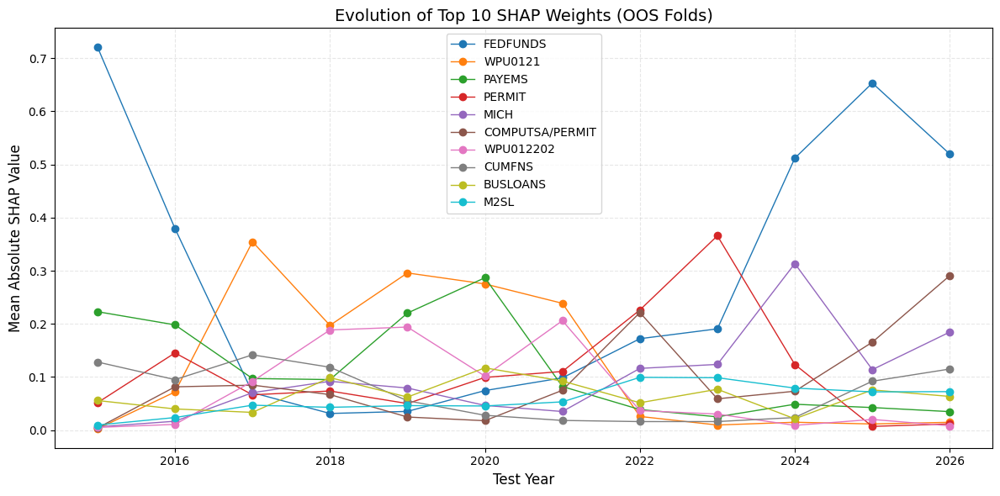

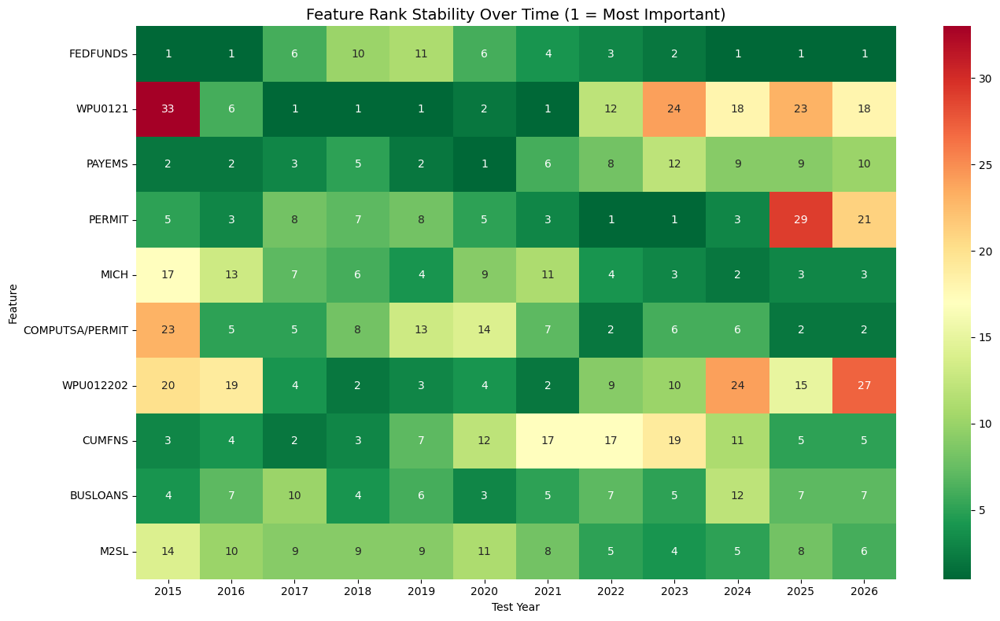

Average Rank Correlation between folds: 0.8196


In [58]:
# SHAP Weights Stability Analysis

# Convert list of Series into a DataFrame: Years as Index, Features as Columns
shap_stability_df = pd.concat(shap_history, axis=1).T

# Select the Top N features based on average importance for better visualization
top_n = 10
avg_importance = shap_stability_df.mean().sort_values(ascending=False)
top_features = avg_importance.head(top_n).index
plot_df = shap_stability_df[top_features]

# 1. Importance Trends
plt.figure(figsize=(12, 6))
for col in plot_df.columns:
    plt.plot(plot_df.index, plot_df[col], marker='o', label=col, linewidth=1)

plt.title(f"Evolution of Top {top_n} SHAP Weights (OOS Folds)", fontsize=14)
plt.xlabel("Test Year", fontsize=12)
plt.ylabel("Mean Absolute SHAP Value", fontsize=12)
plt.legend(loc='best')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Rank Stability Heatmap
rank_df = shap_stability_df.rank(axis=1, ascending=False)

plt.figure(figsize=(14, 8))
sns.heatmap(rank_df[top_features].T, annot=True, cmap="RdYlGn_r", fmt=".0f")
plt.title("Feature Rank Stability Over Time (1 = Most Important)", fontsize=14)
plt.xlabel("Test Year")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# 3. Numerical Stability Metric
# Calculate Spearman Rank Correlation between consecutive folds
corrs = []
for i in range(len(shap_stability_df) - 1):
    c = shap_stability_df.iloc[i].corr(shap_stability_df.iloc[i+1], method='spearman')
    corrs.append(c)

avg_stability = np.mean(corrs)
print(f"Average Rank Correlation between folds: {avg_stability:.4f}")

Some comments - written on May 24, 2026

Not too bad: 51.09% accuracy on a three-class problem against a 33.3% random baseline, using exclusively real-economy variables, is pretty good. The original concern was that performance would collapse without bond market variables. Fortunately, this doesn't occur, which suggests that macroeconomic variables carry genuinely independent regime information, with roughly 50% of yield curve regime structure captured by real-economy indicators instead. Although removing bond market variables reduces overall accuracy, the remaining predictive power—driven by labour market, housing, inflation, and monetary policy variables—remains meaningfully above the naïve benchmark.

The post-2022 decrease in accuracy appears structurally different from the 2017 failure. From 2022 onward, the evaluation tree consistently selects GS10 as its primary splitting variable because the post-COVID rate-hiking cycle was so historically extreme that it dominated the marginal likelihood calculation across the full 58-variable search space. My macro-only training model had no way to detect this boundary since yield variables were excluded from its feature set. The resulting performance drop is therefore better interpreted as a mismatch between yield-space regime definitions and macro-space predictors, rather than a failure of the model itself. During rate-shock regimes, these representations become difficult to compare. The 2025–2026 failure likely reflects a related phenomenon: the yield curve may currently be behaving in a way that real-economy data does not yet justify, or the local training trees have not yet accumulated sufficient observations from the post-hiking terminal rate environment to define regime boundaries stably.

The error structure also supports this interpretation. False transitions (23) slightly exceed true ones (21), indicating that the model becomes somewhat trigger-happy without the stabilising anchor of yield data. These false alarms cluster almost entirely in 2020–2023, where COVID-era macro volatility produces ambiguous signals that push the model to oscillate between Regime 0 and Regime 2 while the 'true' regime remains at 1.

The evolution of the SHAP weights is also interesting. Without GS10 to dominate, the model seems to cycle more evenly through various economic drivers. Here is Claude to explain because I didn't study economics: housing completions and permits (COMPUTSA/PERMIT, PERMIT) in the 2012–2017 post-GFC recovery, labour market conditions (PAYEMS) through 2018–2021, commodity prices (WPU0121) as an inflation precursor in 2017–2019, and federal funds rate (FEDFUNDS) during the 2023–2026 tightening cycle.

The non-transition accuracy is also very informative. When including the bond market, the model's OOS non-transition accuracy (81%) significantly exceeds transition accuracy (52.4%), suggesting that the model was largely exploiting regime persistence. With the macro-only model, the two figures are close to equal (50.9% versus 52.4%), meaning the model is no longer relying on persistence heuristics and instead operating under more balanced uncertainty across both stable and transition periods.

Finally, the fact that Spearman rank correlation barely dropped after removing the bond market category suggests that the model retains a robust structural relationship between macroeconomic conditions and yield curve regimes. This indicates that the learned mapping between the economy and regime dynamics does not collapse when yield-based features are excluded.

## 14. Proxy-Variable Random Forest Regime Forecaster (1 Month Ahead)

In [59]:
results_fcast = []

print("\n" + "=" * 70)
print("RECURSIVE CANONICAL FORECASTING PV-RF")
print("=" * 70)

shap_history_fcast = []

for test_year in range(first_test_year, last_test_year + 1):
    # Define periods
    test_start = pd.Timestamp(f'{test_year}-01-01')
    test_end = pd.Timestamp(f'{test_year}-12-01')
    gap_month = test_start - pd.DateOffset(months=1)
    train_end = test_start - pd.DateOffset(months=gap_months+1)
    train_start = common_idx.min()

    train_idx = common_idx[(common_idx >= train_start) & (common_idx <= train_end)]
    test_idx = common_idx[(common_idx >= test_start) & (common_idx <= test_end)]

    if len(test_idx) == 0:
        print(f"\n[{test_year}] No test data, skipping.")
        continue
    if len(train_idx) < min_training_years * 12:
        print(f"\n[{test_year}] Insufficient training data ({len(train_idx)} months), skipping.")
        continue

    # Features are observed (one month + one month gap) before the regime being predicted
    test_feature_idx = test_idx - pd.DateOffset(months=(1+gap_months))

    print(f"\n[Test Year {test_year}]")
    print(f"  Train: {train_idx[0].date()} → {train_idx[-1].date()} ({len(train_idx)} months)")
    print(f"  Gap: {gap_month.date()}")
    print(f"  Features: {test_feature_idx[0].date()} → {test_feature_idx[-1].date()}")
    print(f"  Predicts: {test_idx[0].date()} → {test_idx[-1].date()} ({len(test_idx)} months)")

    # Step 1: Local tree on training data only
    train_data_q = data_q.loc[train_idx]
    train_target = yields_svensson.loc[train_idx].values

    print("\nGrowing local tree...")
    local_labels, local_splits = grow_tree(
        data_q = train_data_q,
        target_data = train_target,
        thresholds = thresholds,
        min_obs = min_regime_months,
        max_regimes = max_regimes
    )

    # Verify the local tree produced the expected number of regimes
    n_local_regimes = len(np.unique(local_labels))
    if n_local_regimes < max_regimes:
        print(f"  Warning: local tree only found {n_local_regimes}/{max_regimes} regimes — skipping fold.")
        continue

    # Sort by mean spread on training period
    local_labels_canonical = sort_by_spread(local_labels, train_idx, yields_svensson)

    # Step 2: Recompute SHAP weights and construct PVs
    # RFR trained on X_t → yields_t+1 (predictive, not contemporaneous)
    X_train_fold = data_q.loc[train_idx, available_features].iloc[:-1] # X at t
    y_yields_train = yields_svensson.loc[train_idx].iloc[1:] # yields at t+1
    y_regime_train_fwd = local_labels_canonical[1:] # regime at t+1

    rfr_fold = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    rfr_fold.fit(X_train_fold, y_yields_train)

    expl_fold = shap.TreeExplainer(rfr_fold)
    shap_fold = expl_fold(X_train_fold)
    mean_shap_fold = np.abs(shap_fold.values).mean(axis=(0, 2))
    imp_fold = pd.Series(mean_shap_fold, index=available_features)
    shap_history_fcast.append(imp_fold.rename(test_year))

    pv_fold = pd.DataFrame(index=data_q.index)
    for cat_name, feat_list in categories.items():
        valid_feats = [f for f in feat_list if f in imp_fold.index]
        if not valid_feats:
            continue
        cat_imp = imp_fold[valid_feats]
        cat_sum = cat_imp.sum()
        weights = cat_imp / cat_sum if cat_sum > 0 else pd.Series(1/len(valid_feats), index=valid_feats)
        pv_fold[cat_name] = (data_q[valid_feats] * weights).sum(axis=1)

    X_pv_train = pv_fold.loc[X_train_fold.index] # PV at t, for training
    X_pv_test = pv_fold.loc[test_feature_idx] # PV at t, for prediction

    # PV-RF trained on X_t → regime_t+1
    pv_rf_fold = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    pv_rf_fold.fit(X_pv_train, y_regime_train_fwd)

    # Step 3: Predict regime at t+1 using features at t
    pred_regimes = pv_rf_fold.predict(X_pv_test)
    pred_probs = pv_rf_fold.predict_proba(X_pv_test)

    # Step 4: Ground truth from pre-computed evaluation tree
    if test_year not in eval_ground_truth:
        print(f"  No evaluation tree for {test_year} — skipping.")
        continue
    y_test_true = eval_ground_truth[test_year]

    # Guard: if test contains a regime the local tree never saw, Brier is undefined
    unseen = set(np.unique(y_test_true)) - set(np.unique(local_labels_canonical))
    if unseen:
        print(f"  Warning: regime(s) {unseen} in test period not seen during training.")

    acc = accuracy_score(y_test_true, pred_regimes)

    # Brier score: use fixed 3-class encoder to ensure consistent column ordering
    encoder_fold = OneHotEncoder(sparse_output=False, categories=[sorted(np.unique(regime_labels_canonical))])
    y_test_oh = encoder_fold.fit_transform(y_test_true.reshape(-1, 1))

    # Map pred_probs columns (local class ordering) to global 3-class ordering
    local_classes  = pv_rf_fold.classes_
    global_classes = sorted(np.unique(regime_labels_canonical))
    pred_probs_aligned = np.zeros((len(test_idx), len(global_classes)))
    for local_idx, cls in enumerate(local_classes):
        global_idx = global_classes.index(cls)
        pred_probs_aligned[:, global_idx] = pred_probs[:, local_idx]

    brier_monthly = np.mean((pred_probs_aligned - y_test_oh) ** 2, axis=1)

    print(f"\n  Forecasting Accuracy: {acc:.2%}")
    print(f"  Forecasting Brier:    {brier_monthly.mean():.6f}")

    for i, date in enumerate(test_idx):
        results_fcast.append({
            'date': date,
            'test_year': test_year,
            'true_regime': y_test_true[i],
            'pred_regime': pred_regimes[i],
            'correct': int(y_test_true[i] == pred_regimes[i]),
            'brier': brier_monthly[i],
        })

# Aggregate results
results_fcast_df = pd.DataFrame(results_fcast).set_index('date')
print("\n" + "=" * 70)
print(f"TOTAL FORECAST MONTHS:        {len(results_fcast_df)}")
print(f"OVERALL FORECAST ACCURACY:    {results_fcast_df['correct'].mean():.2%}")
print(f"OVERALL FORECAST BRIER SCORE: {results_fcast_df['brier'].mean():.6f}")
print("=" * 70)
print("\nPer-Year Breakdown:")
print(results_fcast_df.groupby('test_year')[['correct', 'brier']].mean().round(4).to_string())


RECURSIVE CANONICAL FORECASTING PV-RF

[2011] Insufficient training data (49 months), skipping.

[Test Year 2012]
  Train: 2006-11-01 → 2011-11-01 (61 months)
  Gap: 2011-12-01
  Features: 2011-11-01 → 2012-10-01
  Predicts: 2012-01-01 → 2012-12-01 (12 months)

Growing local tree...

── Split 1: Searching across 1 leaf node(s) × 58 variables × 4 thresholds ──

  Top 5 candidates for Leaf 0:
    CCSA/ICSA            threshold = 0.6 | log ML = -1008.4664
    PERMIT               threshold = 0.6 | log ML = -1085.5260
    BUSLOANS             threshold = 0.4 | log ML = -1097.5934
    TB3MS                threshold = 0.2 | log ML = -1099.9739
    PERMIT               threshold = 0.4 | log ML = -1134.4521

Split 1 applied:   Leaf 0 split on CCSA/ICSA at 0.6
    Regime 0: 29 months
    Regime 1: 32 months

── Split 2: Searching across 2 leaf node(s) × 58 variables × 4 thresholds ──

Leaf 0: too small to split (29 observations), skipping.

Leaf 1: too small to split (32 observations), skippin

In [60]:
eval_truth_series = results_fcast_df['true_regime']
pred_series = results_fcast_df['pred_regime']
fcast_dates = eval_truth_series.index.sort_values()

true_positives = []
false_negatives = []
false_positives = []
actual_transitions = []

for date in fcast_dates:
    prev_date = date - pd.DateOffset(months=1)
    # Skip if we don't have the previous month's evaluation label
    if prev_date not in eval_truth_series.index:
        continue

    true_current = eval_truth_series.loc[date]
    true_prev = eval_truth_series.loc[prev_date]
    pred_current = pred_series.loc[date]
    pred_prev = pred_series.loc[prev_date]

    true_transition = (true_current != true_prev)
    predicted_transition = (pred_current != pred_prev)

    if true_transition and predicted_transition:
        # Model flagged a transition that happened
        true_positives.append({
            'date': date,
            'from_regime': true_prev,
            'to_regime': true_current,
            'from_pred_regime': pred_prev,
            'to_pred_regime': pred_current,
            'correctly_classified': (pred_current == true_current)
        })
        actual_transitions.append(date)

    elif true_transition and not predicted_transition:
        # Model did not flag a transition that happened
        false_negatives.append({
            'date': date,
            'from_regime': true_prev,
            'to_regime': true_current,
            'pred_regime': pred_current
        })
        actual_transitions.append(date)

    elif not true_transition and predicted_transition:
        # Model flagged a transition that didn't happen
        false_positives.append({
            'date': date,
            'true_regime': true_current,
            'from_pred_regime': pred_prev,
            'to_pred_regime': pred_current
        })

true_positives_df = pd.DataFrame(true_positives).set_index('date') if true_positives else pd.DataFrame()
false_negatives_df = pd.DataFrame(false_negatives).set_index('date') if false_negatives else pd.DataFrame()
false_positives_df = pd.DataFrame(false_positives).set_index('date') if false_positives else pd.DataFrame()

n_tp = len(true_positives_df)
n_fn = len(false_negatives_df)
n_fp = len(false_positives_df)
n_cc = int(true_positives_df['correctly_classified'].sum()) if not true_positives_df.empty else 0

recall = n_tp / (n_tp + n_fn) if (n_tp + n_fn) > 0 else float('nan') # of all real transitions, how many real transitions did the model detect?
precision = n_tp / (n_tp + n_fp) if (n_tp + n_fp) > 0 else float('nan') # of all detected transitions, how many real transitions did the model detect?
correct_given_detected = n_cc / n_tp if n_tp > 0 else float('nan') # of all real, detected transitions, how many were correctly classified?
correct = n_cc / (n_tp + n_fn) if (n_tp + n_fn) > 0 else float('nan') # of all real transitions, how many were correctly classified?

non_trans_acc = results_fcast_df.loc[~results_fcast_df.index.isin(actual_transitions), 'correct'].mean()

print("=" * 60)
print("REGIME TRANSITION ANALYSIS — FORECASTER (t → t+1)")
print("=" * 60)
print(f"Total forecast months:                                  {len(fcast_dates)}")
print(f"Actual transition months:                               {n_tp+n_fn}")
print(f"")
print(f"True Positives (detected):                              {n_tp} ({recall:.1%} recall)")
print(f"False Negatives (missed):                               {n_fn} ({1-recall:.1%} miss rate)")
print(f"False Positives (false alarm):                          {n_fp} (precision = {precision:.1%})")
print(f"")
print(f"Of all real detected transitions, correctly classified: {n_cc}/{n_tp} ({correct_given_detected:.1%})")
print(f"Of all real transitions, correctly classified:          {n_cc}/{n_tp+n_fn} ({correct:.1%})")
print(f"")
print(f"Non-transition accuracy:                                {non_trans_acc:.1%}")

if not true_positives_df.empty:
    print(f"\nTrue Positives:")
    display_cols = ['from_regime', 'to_regime', 'from_pred_regime', 'to_pred_regime', 'correctly_classified']
    print(true_positives_df[display_cols].to_string())

if not false_negatives_df.empty:
    print(f"\nFalse Negatives (missed transitions):")
    print(false_negatives_df.to_string())

if not false_positives_df.empty:
    print(f"\nFalse Positives (false alarms):")
    print(false_positives_df.to_string())

REGIME TRANSITION ANALYSIS — FORECASTER (t → t+1)
Total forecast months:                                  137
Actual transition months:                               22

True Positives (detected):                              7 (31.8% recall)
False Negatives (missed):                               15 (68.2% miss rate)
False Positives (false alarm):                          16 (precision = 30.4%)

Of all real detected transitions, correctly classified: 4/7 (57.1%)
Of all real transitions, correctly classified:          4/22 (18.2%)

Non-transition accuracy:                                74.8%

True Positives:
            from_regime  to_regime  from_pred_regime  to_pred_regime  correctly_classified
date                                                                                      
2016-01-01            1          0                 1               0                  True
2016-06-01            1          0                 1               0                  True
2016-11-01         

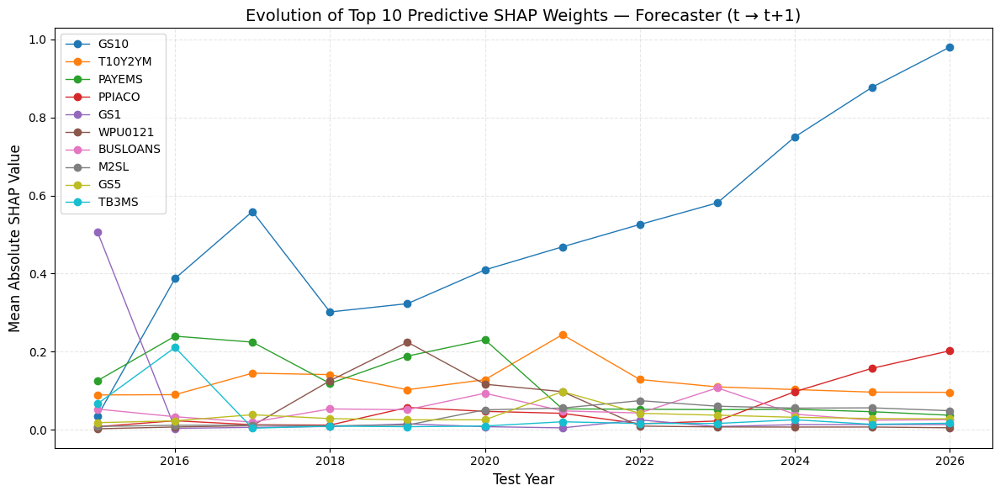

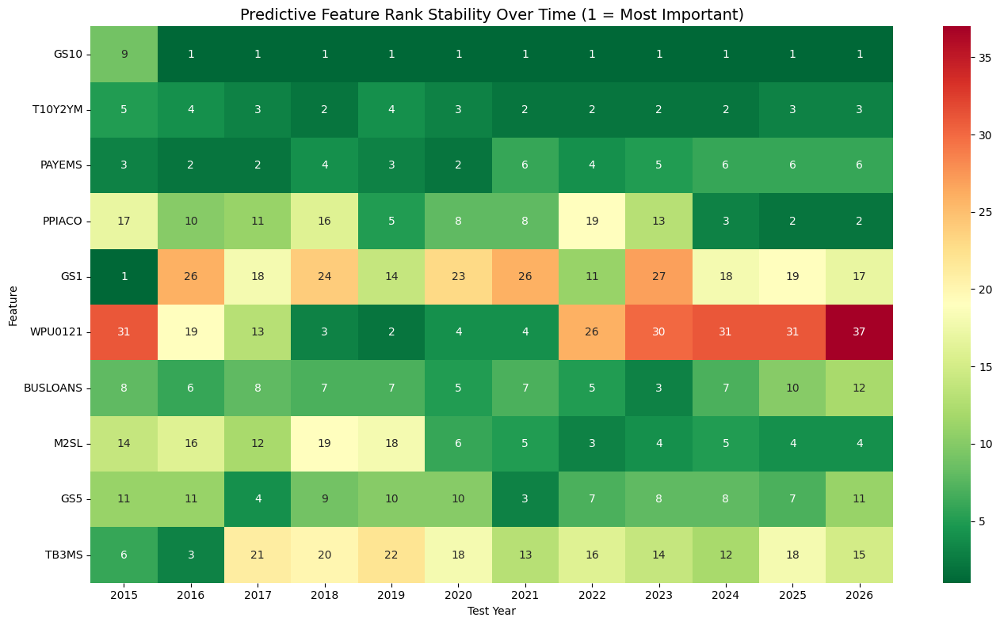

Average Rank Correlation between folds: 0.8441


In [61]:
# SHAP weight stability (forecasting)

# Convert list of Series into a DataFrame: Years as Index, Features as Columns
shap_stability_df = pd.concat(shap_history_fcast, axis=1).T

# Select the Top N features based on average importance for better visualization
top_n = 10
avg_importance = shap_stability_df.mean().sort_values(ascending=False)
top_features = avg_importance.head(top_n).index
plot_df = shap_stability_df[top_features]

# 1. Importance Trends
plt.figure(figsize=(12, 6))
for col in plot_df.columns:
    plt.plot(plot_df.index, plot_df[col], marker='o', label=col, linewidth=1)

plt.title(f"Evolution of Top {top_n} Predictive SHAP Weights — Forecaster (t → t+1)", fontsize=14)
plt.xlabel("Test Year", fontsize=12)
plt.ylabel("Mean Absolute SHAP Value", fontsize=12)
plt.legend(loc='best')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Rank Stability Heatmap
rank_df = shap_stability_df.rank(axis=1, ascending=False)

plt.figure(figsize=(14, 8))
sns.heatmap(rank_df[top_features].T, annot=True, cmap="RdYlGn_r", fmt=".0f")
plt.title("Predictive Feature Rank Stability Over Time (1 = Most Important)", fontsize=14)
plt.xlabel("Test Year")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# 3. Numerical stability metric
# Calculate Spearman Rank Correlation between consecutive folds
corrs = []
for i in range(len(shap_stability_df) - 1):
    c = shap_stability_df.iloc[i].corr(shap_stability_df.iloc[i+1], method='spearman')
    corrs.append(c)

avg_stability = np.mean(corrs)
print(f"Average Rank Correlation between folds: {avg_stability:.4f}")

## 15. Compiled Results

/tmp/ipykernel_4319/711163488.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


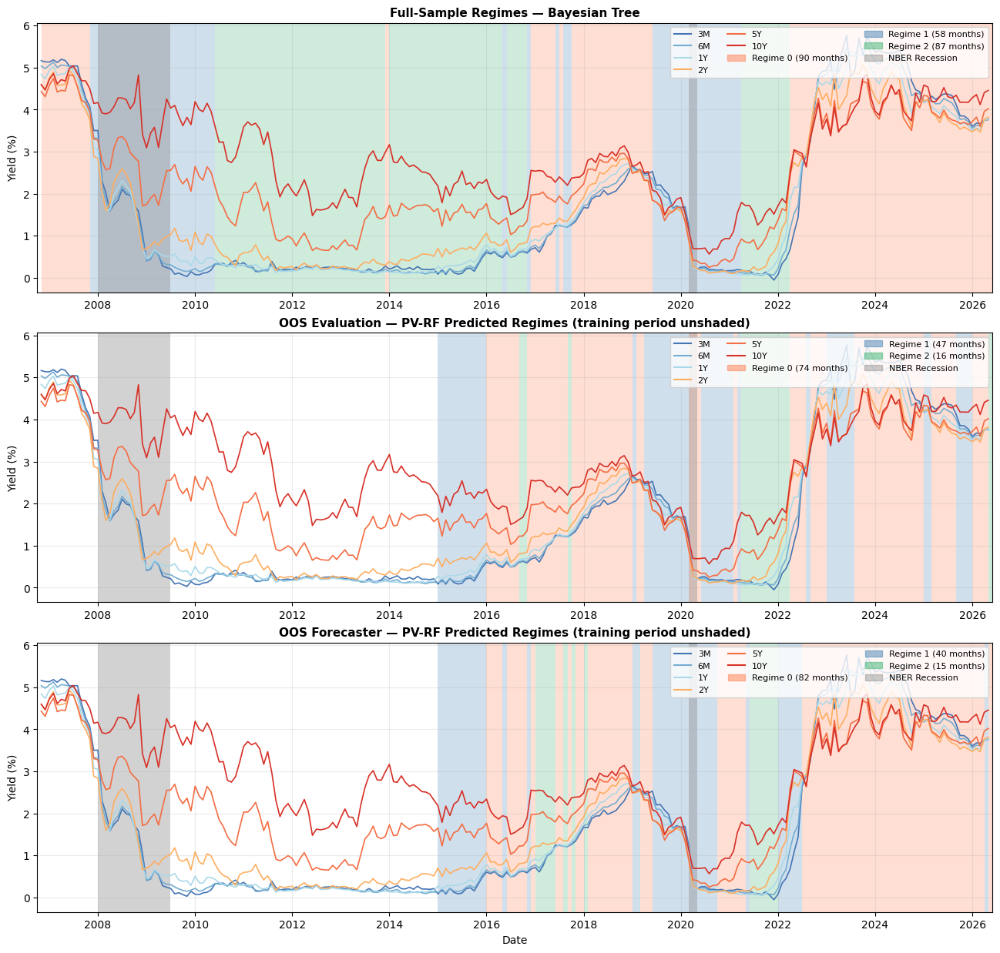

In [62]:
fig, axes = plt.subplots(3, 1, figsize=(16, 15), sharex=False, gridspec_kw={'hspace': 0.15})

plot_maturities = {
    'Y3M': '3M', 'Y6M': '6M', 'Y12M': '1Y',
    'Y24M': '2Y', 'Y60M': '5Y', 'Y120M': '10Y',
}
line_colors   = ['#4575b4', '#74add1', '#abd9e9', '#fdae61', '#f46d43', '#d73027']
regime_colors = {0: 'coral', 1: 'steelblue', 2: 'mediumseagreen'}

# Three regime series
# Panels 2 & 3 only contain OOS dates
regime_series_list = [
    ('Full-Sample Regimes — Bayesian Tree', regime_series_canonical),
    ('OOS Evaluation — PV-RF Predicted Regimes (training period unshaded)', results_oos_df['pred_regime']),
    ('OOS Forecaster — PV-RF Predicted Regimes (training period unshaded)', results_fcast_df['pred_regime']),
]

def shade_blocks(ax, common_idx, reg_series, colors):
    """
    Shade contiguous regime blocks only for dates present in reg_series.
    Dates not in reg_series (training period) are left unshaded.
    """
    oos_set = set(reg_series.index)
    for r in sorted(reg_series.unique()):
        in_block = False
        block_start = None
        for date in common_idx:
            is_r = (date in oos_set) and (reg_series.loc[date] == r)
            if is_r and not in_block:
                in_block, block_start = True, date
            elif not is_r and in_block:
                in_block = False
                ax.axvspan(block_start, date, alpha=0.25, color=colors[r], lw=0, zorder=0)
        if in_block:
            ax.axvspan(block_start, common_idx[-1] + pd.DateOffset(months=1), alpha=0.25, color=colors[r], lw=0, zorder=0)

for ax, (title, reg_series) in zip(axes, regime_series_list):

    # Yield curve lines (full sample on all panels)
    for (col, label), linecolor in zip(plot_maturities.items(), line_colors):
        ax.plot(common_idx, yields_svensson.loc[common_idx, col],
                color=linecolor, lw=1.2, label=label, zorder=3)

    # Regime background (OOS dates only for panels 2 & 3)
    shade_blocks(ax, common_idx, reg_series, regime_colors)

    # NBER recession shading
    in_recession = False
    rec_start = None
    for date, val in recession.iterrows():
        if val['USREC'] == 1 and not in_recession:
            in_recession, rec_start = True, date
        elif val['USREC'] == 0 and in_recession:
            in_recession = False
            ax.axvspan(rec_start, date, alpha=0.35, color='grey', lw=0, zorder=1)
    if in_recession:
        ax.axvspan(rec_start, recession.index[-1], alpha=0.35, color='grey', lw=0, zorder=1)

    # Legend
    line_handles = [plt.Line2D([0], [0], color=linecolor, lw=1.5, label=label) for linecolor, label in zip(line_colors, plot_maturities.values())]
    regime_handles = [plt.matplotlib.patches.Patch(color=regime_colors[r], alpha=0.5, label=f'Regime {r} ({(reg_series == r).sum()} months)') for r in sorted(reg_series.unique())]
    rec_handle = plt.matplotlib.patches.Patch(color='grey', alpha=0.4, label='NBER Recession')

    ax.legend(handles=line_handles + regime_handles + [rec_handle], loc='upper right', ncol=3, fontsize=8)
    ax.set_title(title, fontsize=11, fontweight='bold')
    ax.set_ylabel('Yield (%)')
    ax.grid(True, alpha=0.25)

for ax in axes:
    ax.set_xlim(common_idx.min() - pd.DateOffset(months=1), common_idx.max() + pd.DateOffset(months=1))
axes[-1].set_xlabel('Date')
plt.tight_layout()
plt.show()

# Gaussian Hidden Markov Model Regime Classifier

We now fit a multivariate Gaussian Hidden Markov Model (HMM) to the 12 SHAP-weighted proxy variables constructed in Section 12. Each proxy variable is already an economically interpretable, quantile-standardised weighted average of its category, which removes the need for further unsupervised compression such as PCA.

Why an HMM also?
- The Bayesian tree partitions the sample via hard, greedy splits. The HMM learns regime persistence and transition dynamics jointly and returns soft posterior probabilities rather than hard labels.
- The Viterbi algorithm recovers the globally most likely state sequence rather than a greedy local optimum.
- Because I heard Renaissance uses one.

In [63]:
try:
    from hmmlearn.hmm import GaussianHMM
except ImportError:
    !pip install hmmlearn -q
    from hmmlearn.hmm import GaussianHMM

# HMM Hyperparameters
n_states = max_regimes # number of hidden macro regimes
n_iter = 1000 # EM iterations per restart
n_restarts = 50 # random restarts (EM is non-convex)
cov_type = 'full'

# Input: proxy variables on the common index (12 columns, already quantile-standardised)
X_hmm = data_pv.loc[common_idx].values
pv_cols = data_pv.columns.tolist()

print(f'HMM input shape: {X_hmm.shape} ({len(pv_cols)} proxy variables × {X_hmm.shape[0]} months)')
print(f'Proxy variables: {pv_cols}')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 kB 11.3 MB/s eta 0:00:00
HMM input shape: (235, 12) (12 proxy variables × 235 months)
Proxy variables: ['Output', 'Consumer', 'Labour', 'Housing', 'Liquidity_Credit', 'Inflation', 'Bond_Market', 'FX_Market', 'Commodity', 'Stock_Market', 'Sentiment', 'Uncertainty']



Fitting GaussianHMM (3 states, full covariance) with 50 restarts...
  Restart   0: log-likelihood = 1,451.13  NEW BEST
  Restart   1: log-likelihood = 1,620.08  NEW BEST


  Restart   2: log-likelihood = 1,620.36  NEW BEST
  Restart   3: log-likelihood = 1,678.93  NEW BEST


  Restart   4: log-likelihood = 1,550.20
  Restart   5: log-likelihood = 1,533.78


  Restart   6: log-likelihood = 1,635.01
  Restart   7: log-likelihood = 1,659.69


  Restart   8: log-likelihood = 1,664.36


  Restart   9: log-likelihood = 1,678.93  NEW BEST
  Restart  10: log-likelihood = 1,661.91


  Restart  11: log-likelihood = 1,597.64
  Restart  12: log-likelihood = 1,678.93
  Restart  13: log-likelihood = 1,659.69
  Restart  14: log-likelihood = 1,678.14


  Restart  15: log-likelihood = 1,623.79
  Restart  16: log-likelihood = 1,552.58
  Restart  17: log-likelihood = 1,595.24


  Restart  18: log-likelihood = 1,602.08
  Restart  19: log-likelihood = 1,587.67
  Restart  20: log-likelihood = 1,640.68
  Restart  21: log-likelihood = 1,659.69


  Restart  22: log-likelihood = 1,650.35
  Restart  23: log-likelihood = 1,561.44
  Restart  24: log-likelihood = 1,652.48


  Restart  25: log-likelihood = 1,661.92
  Restart  26: log-likelihood = 1,611.78
  Restart  27: log-likelihood = 1,661.91


  Restart  28: log-likelihood = 1,356.43
  Restart  29: log-likelihood = 1,661.91
  Restart  30: log-likelihood = 1,661.91


  Restart  31: log-likelihood = 1,610.88
  Restart  32: log-likelihood = 1,635.01
  Restart  33: log-likelihood = 1,561.22


  Restart  34: log-likelihood = 1,661.91
  Restart  35: log-likelihood = 1,562.85
  Restart  36: log-likelihood = 1,553.96


  Restart  37: log-likelihood = 1,233.11
  Restart  38: log-likelihood = 1,650.65
  Restart  39: log-likelihood = 1,616.35
  Restart  40: log-likelihood = 1,661.91


  Restart  41: log-likelihood = 1,678.14


  Restart  42: log-likelihood = 1,139.65
  Restart  43: log-likelihood = 1,659.69
  Restart  44: log-likelihood = 1,640.68
  Restart  45: log-likelihood = 1,140.95


  Restart  46: log-likelihood = 1,140.50
  Restart  47: log-likelihood = 1,589.92
  Restart  48: log-likelihood = 1,574.61
  Restart  49: log-likelihood = 1,661.91

Best log-likelihood: 1,678.93
Converged:           True


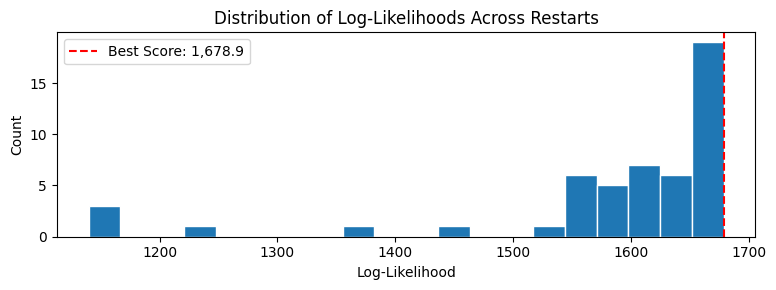

In [64]:
# Fit GaussianHMM with multiple restarts
print(f'\nFitting GaussianHMM ({n_states} states, {cov_type} covariance) '
      f'with {n_restarts} restarts...')

best_score = -np.inf
best_model = None
scores = []

for seed in range(n_restarts):
    try:
        model = GaussianHMM(
            n_components    = n_states,
            covariance_type = cov_type,
            n_iter          = n_iter,
            tol             = 1e-6,
            random_state    = seed,
            verbose         = False
        )
        model.fit(X_hmm)
        score = model.score(X_hmm)
        scores.append(score)
        if score > best_score:
            best_score = score
            best_model = model
            print(f'  Restart {seed:3d}: log-likelihood = {score:,.2f}  NEW BEST')
        else:
            print(f'  Restart {seed:3d}: log-likelihood = {score:,.2f}')
    except Exception as e:
        scores.append(np.nan)
        print(f'  Restart {seed:3d}: failed ({e})')

print(f'\nBest log-likelihood: {best_score:,.2f}')
print(f'Converged:           {best_model.monitor_.converged}')

# Distribution of restart scores
valid_scores = [s for s in scores if not np.isnan(s)]
plt.figure(figsize=(8, 3))
plt.hist(valid_scores, bins=20, edgecolor='white')
plt.axvline(best_score, color='red', linestyle='--', label=f'Best Score: {best_score:,.1f}')
plt.xlabel('Log-Likelihood')
plt.ylabel('Count')
plt.title('Distribution of Log-Likelihoods Across Restarts')
plt.legend()
plt.tight_layout()
plt.show()

In [65]:
# Viterbi decoding
hmm_labels_raw = best_model.predict(X_hmm)
hmm_probs_raw = best_model.predict_proba(X_hmm) # posterior state probabilities

print('Raw state counts (before canonical ordering):')
for s in range(n_states):
    n = (hmm_labels_raw == s).sum()
    print(f'  State {s}: {n:4d} months ({n/len(hmm_labels_raw):.1%})')

# Canonical ordering by mean spread (consistent with Bayesian tree)
hmm_labels_canonical = sort_by_spread(hmm_labels_raw, common_idx, yields_svensson)

# Derive the permutation applied by sort_by_spread to reorder probability columns
# Compute the empirical 10Y-2Y spread directly from your reconstructed yields matrix
spread_series = yields_svensson.loc[common_idx, 'Y120M'] - yields_svensson.loc[common_idx, 'Y24M']
state_spreads = {s: spread_series.values[hmm_labels_raw == s].mean() for s in range(n_states)}

# Sort the hidden state indices by their mean spread in ascending order via lambda
state_order = [s for s, _ in sorted(state_spreads.items(), key=lambda x: x[1])]
hmm_probs = hmm_probs_raw[:, state_order] # reorder probability columns to match

print(f'\nCanonical ordering by mean 10Y-2Y Spread:')
for new_label, old_label in enumerate(state_order):
    n = (hmm_labels_canonical == new_label).sum()
    print(f'  Raw state {old_label} → Regime {new_label} (mean spread = {state_spreads[old_label]:.4f}%, {n} months)')

print('\nRegime Sizes:')
for label in sorted(np.unique(hmm_labels_canonical)):
    count = (hmm_labels_canonical == label).sum()
    pct = count / len(hmm_labels_canonical) * 100
    print(f'  Regime {label}: {count:4d} months  ({pct:.1f}%)')

Raw state counts (before canonical ordering):
  State 0:   63 months (26.8%)
  State 1:   79 months (33.6%)
  State 2:   93 months (39.6%)

Canonical ordering by mean 10Y-2Y Spread:
  Raw state 2 → Regime 0 (mean spread = 0.2351%, 93 months)
  Raw state 0 → Regime 1 (mean spread = 1.5589%, 63 months)
  Raw state 1 → Regime 2 (mean spread = 1.8950%, 79 months)

Regime Sizes:
  Regime 0:   93 months  (39.6%)
  Regime 1:   63 months  (26.8%)
  Regime 2:   79 months  (33.6%)


Transition Matrix (row = from-state, col = to-state):
          Regime 0  Regime 1  Regime 2
Regime 0    0.9783    0.0217    0.0000
Regime 1    0.0159    0.9524    0.0317
Regime 2    0.0127    0.0127    0.9747

Expected regime duration (months):
  Regime 0: 46.0 months
  Regime 1: 21.0 months
  Regime 2: 39.5 months

Stationary distribution:
  Regime 0: 0.3932  (39.3%)
  Regime 1: 0.2692  (26.9%)
  Regime 2: 0.3376  (33.8%)


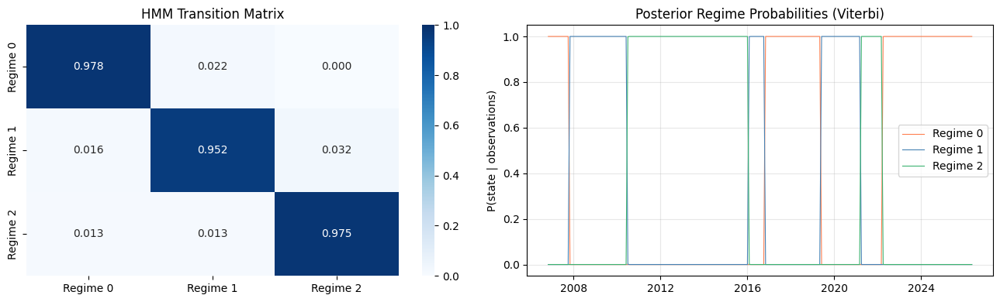

In [66]:
# Transition matrix
T_raw = best_model.transmat_
T = T_raw[np.ix_(state_order, state_order)] # reorder to canonical labels
T_df  = pd.DataFrame(T, index = [f'Regime {i}' for i in range(n_states)], columns = [f'Regime {j}' for j in range(n_states)])

print('Transition Matrix (row = from-state, col = to-state):')
print(T_df.round(4))

print('\nExpected regime duration (months):')
for i in range(n_states):
    duration = 1 / (1 - T[i, i]) if T[i, i] < 1 else np.inf
    print(f'  Regime {i}: {duration:.1f} months')

# Stationary distribution
eigenvalues, eigenvectors = np.linalg.eig(T.T)
stationary = np.real(eigenvectors[:, np.isclose(eigenvalues, 1.0)])
stationary = (stationary / stationary.sum()).flatten()
print('\nStationary distribution:')
for i, p in enumerate(stationary):
    print(f'  Regime {i}: {p:.4f}  ({p:.1%})')

# Heatmap + posterior probabilities
regime_colors = {0: 'coral', 1: 'steelblue', 2: 'mediumseagreen'}
fig, axes = plt.subplots(1, 2, figsize=(13, 4))

sns.heatmap(T_df, annot=True, fmt='.3f', cmap='Blues', vmin=0, vmax=1, ax=axes[0])
axes[0].set_title('HMM Transition Matrix')

for i in range(n_states):
    axes[1].plot(common_idx, hmm_probs[:, i], lw=0.8, color=regime_colors[i], label=f'Regime {i}')
axes[1].set_title('Posterior Regime Probabilities (Viterbi)')
axes[1].set_ylabel('P(state | observations)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

HMM Emission Means (quantile-standardised proxy variable space):
          Output  Consumer  Labour  Housing  Liquidity_Credit  Inflation  Bond_Market  FX_Market  Commodity  Stock_Market  Sentiment  Uncertainty
Regime 0   0.550     0.495   0.365    0.727             0.436      0.583        0.785      0.508      0.548         0.542      0.467        0.573
Regime 1   0.283     0.352   0.266    0.620             0.598      0.448        0.182      0.619      0.475         0.360      0.650        0.540
Regime 2   0.713     0.580   0.763    0.276             0.482      0.472        0.296      0.406      0.470         0.571      0.360        0.477


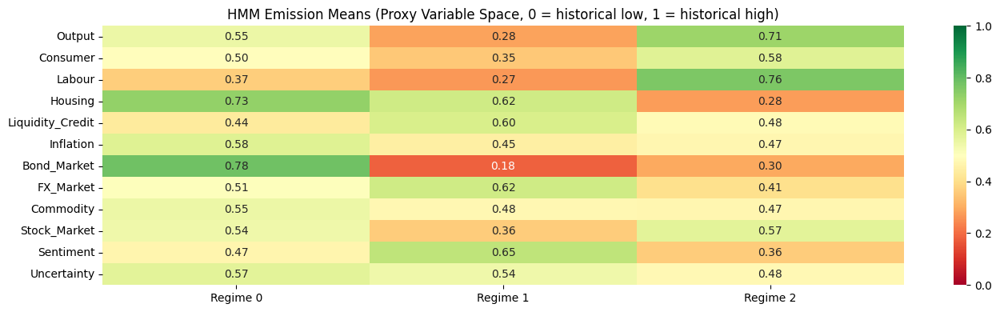

In [67]:
# Emission means
means_pv = best_model.means_[state_order]
emission_means = pd.DataFrame(means_pv, index = [f'Regime {i}' for i in range(n_states)], columns = pv_cols)

print('HMM Emission Means (quantile-standardised proxy variable space):')
print(emission_means.round(3).to_string())

fig, ax = plt.subplots(figsize=(14, 4))
sns.heatmap(
    emission_means.T,
    cmap='RdYlGn', center=0.5, vmin=0, vmax=1,
    annot=True, fmt='.2f',
    ax=ax, yticklabels=True, xticklabels=True
)
ax.set_title('HMM Emission Means (Proxy Variable Space, 0 = historical low, 1 = historical high)')
plt.tight_layout()
plt.show()

In [68]:
# Information criteria
n_obs = X_hmm.shape[0]
n_pv = X_hmm.shape[1]
n_params = (
    (n_states - 1)                           # initial state distribution
    + n_states * (n_states - 1)              # transition matrix
    + n_states * n_pv                        # emission means
    + n_states * n_pv * (n_pv + 1) // 2      # unique entries in full covariance
) if cov_type == 'full' else (
    (n_states - 1)
    + n_states * (n_states - 1)
    + n_states * n_pv
    + n_states * n_pv                        # diagonal variances
)

aic = -2 * best_score + 2 * n_params # Akaike Information Criterion
bic = -2 * best_score + n_params * np.log(n_obs) # Bayesian Information Criterion

print(f'Log-Likelihood: {best_score:,.2f}')
print(f'N observations: {n_obs}')
print(f'N parameters:   {n_params}')
print(f'AIC:            {aic:,.2f}')
print(f'BIC:            {bic:,.2f}')

Log-Likelihood: 1,678.93
N observations: 235
N parameters:   278
AIC:            -2,801.87
BIC:            -1,840.10


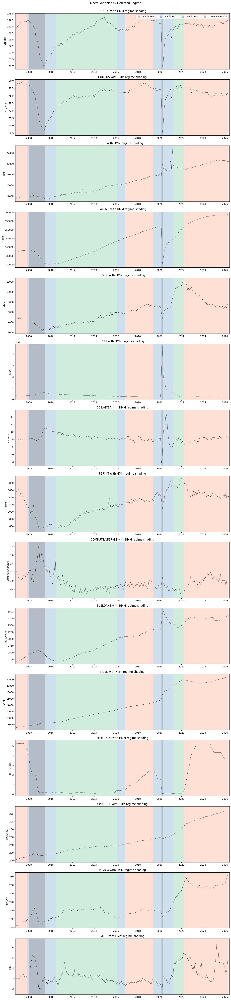

In [69]:
# Plots of Macro Variables Colored by Regime
n_cols_plot = len(macro_cols)
fig, axes = plt.subplots(n_cols_plot, 1, figsize=(14, 4 * n_cols_plot))
colors = {0: 'coral', 1: 'steelblue', 2: 'mediumseagreen'}

if n_cols_plot == 1:
    axes = [axes]

for ax, col in zip(axes, macro_cols):
    ax.plot(common_idx, data.loc[common_idx, col], color='black', lw=0.5, zorder=2)

    # Shade background by regime
    for label in np.unique(hmm_labels_canonical):
        mask = (hmm_labels_canonical == label)

        # Find contiguous blocks
        in_block = False
        block_start = None
        for i, date in enumerate(common_idx):
            if mask[i] and not in_block:
                in_block = True
                block_start = date
            # If this month does not belong to the current regime and we were in a block, the block just ended
            elif not mask[i] and in_block:
                in_block = False
                ax.axvspan(block_start, date, alpha=0.25, color=colors[label], lw=0) # Draw the span from `block_start` to `date`
        # Close any open block at the end of the sample
        if in_block:
            ax.axvspan(block_start, common_idx[-1], alpha=0.25, color=colors[label], lw=0)

    # Shade NBER recessions
    in_recession = False
    rec_start = None
    for date, val in recession.iterrows():
        if val['USREC'] == 1 and not in_recession:
            in_recession = True
            rec_start = date
        elif val['USREC'] == 0 and in_recession:
            in_recession = False
            ax.axvspan(rec_start, date, alpha=0.35, color='grey', lw=0, zorder=1)
    # Close any open recession at end of sample
    if in_recession:
        ax.axvspan(rec_start, recession.index[-1], alpha=0.25, color='grey', lw=0, zorder=1)

    ax.set_xlim(common_idx.min() - pd.DateOffset(months=1), common_idx.max() + pd.DateOffset(months=1))
    ax.set_ylabel(col)
    ax.set_title(f'{col} with HMM regime shading')

# Legend
for label in np.unique(hmm_labels_canonical):
    axes[0].scatter([], [], color=colors[label], alpha=0.5, label=f'Regime {label}', s=100)
axes[0].scatter([], [], color='grey', alpha=0.5, label='NBER Recession', s=100)
axes[0].legend(loc='upper right', ncol=len(np.unique(hmm_labels_canonical)) + 1)

plt.suptitle('Macro Variables by Detected Regime', y=1.0)
plt.tight_layout()
plt.show()

In [70]:
# Recession overlap for HMM labels
rec_mask = recession_aligned['USREC'].values == 1
print('HMM Recession Overlap:')
for label in sorted(np.unique(hmm_labels_canonical)):
    regime_mask = (hmm_labels_canonical == label)
    regime_months = regime_mask.sum()
    overlap = (regime_mask & rec_mask).sum()
    print(f'  Regime {label} ({regime_months} months): '
          f'{overlap} recession months '
          f'({overlap/regime_months*100:.1f}% of regime, '
          f'{overlap/rec_mask.sum()*100:.1f}% of all recessions)')

HMM Recession Overlap:
  Regime 0 (93 months): 0 recession months (0.0% of regime, 0.0% of all recessions)
  Regime 1 (63 months): 20 recession months (31.7% of regime, 100.0% of all recessions)
  Regime 2 (79 months): 0 recession months (0.0% of regime, 0.0% of all recessions)


HMM vs Bayesian tree agreement: 94.0%


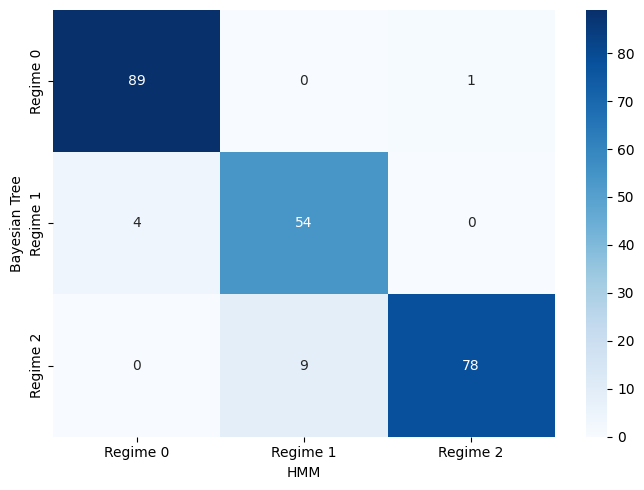

In [71]:
# Compare HMM vs Bayesian tree regime labels
agreement = (hmm_labels_canonical == regime_labels_canonical).mean()
print(f'HMM vs Bayesian tree agreement: {agreement:.1%}')

# Confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(regime_labels_canonical, hmm_labels_canonical)
fig, ax = plt.subplots(figsize=(7, 5))
sns.heatmap(
    cm, annot=True, fmt='d', cmap='Blues',
    xticklabels=[f'Regime {i}' for i in range(n_states)],
    yticklabels=[f'Regime {i}' for i in range(n_states)],
    ax=ax
)
ax.set_xlabel('HMM')
ax.set_ylabel('Bayesian Tree')
plt.tight_layout()
plt.show()